# Identity
---
2702234081 - Aldo Oktavianus<br>
Link Video : https://drive.google.com/drive/folders/1hIAWtv7KjCXRuNgFwYPol72dKU-AeBk-

Link Backup Drive : https://drive.google.com/drive/folders/1T7EcIOUBQbmbqVVzpZkioMOBSsLucdtW

# Task
---


For this second task of the Deep Learning Final Exam, the objective is to construct a Generative Adversarial Network (GAN) architecture specifically designed to synthesize artificial pistachio images. In practical deep learning applications, GANs are frequently employed to generate additional synthetic data, a crucial technique when faced with limited real-world training samples. 

Our dataset for this task comprises existing images of pistachios, encompassing two distinct varieties: Siirt and Kirmizi.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import *
from keras.models import *
from keras.optimizers import Adam
import seaborn as sns

import os
import glob
import cv2
from skimage.util import random_noise # For adding noise
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image, UnidentifiedImageError
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from skimage.metrics import structural_similarity as ssim

from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras.applications.inception_v3 import InceptionV3, preprocess_input
from scipy.linalg import sqrtm

In [2]:
def set_global_styles():
    # Set the style for seaborn so I can make the to be yellow
    # (i prefer it cause its more "eye friendly" xixixixixi)
    sns.set_style({"axes.facecolor": "lightyellow",
                "figure.facecolor": "lightyellow"})

    # this one is for matplotlib
    plt.rcParams['figure.figsize'] = (10, 6)
    plt.rcParams['axes.titlesize'] = 15
    plt.rcParams['axes.labelsize'] = 14
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    plt.rcParams['axes.facecolor'] = 'lightyellow'
    plt.rcParams['figure.facecolor'] = 'lightyellow'

set_global_styles()

In [3]:
data_path = "Dataset"

# EDA for GAN
---

**Most EDA is done in number 2 so there is not much EDA need to be done in number 3 to make the GAN model**

First I have to make sure the data directory is correct

In [4]:
image_files = os.listdir(data_path)
image_files = [f for f in image_files if f.endswith(('.jpg', '.jpeg', '.png'))]
total_files = [f for f in image_files]
len(image_files)

1072

Yes the data is correct while the number of data is the same with number 2 data.

## Sample of the data

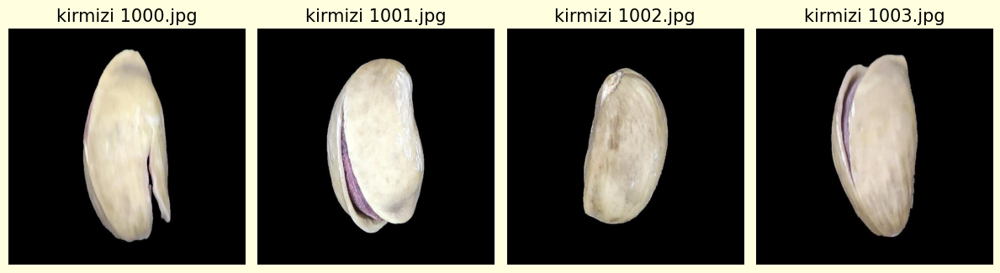

In [5]:
sample_images = image_files[:4]

plt.figure(figsize=(12, 6))
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(data_path, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(1, 4, i+1)
    plt.imshow(img)
    plt.title(img_name)
    plt.axis('off')
plt.tight_layout()
plt.show()

Here are some sample of our data. Our data consists of 1074 pistachios with 600x600x3 size. The data brightness is also having the mean of around 40-50 (EDA number 2). This means that we might need to preprocess the images before further analysis.

In [6]:
modes = []
for filename in os.listdir(data_path):
    with Image.open(os.path.join(data_path, filename)) as img:
        modes.append(img.mode)

print(f"Mode warna yang ditemukan: {set(modes)}")

Mode warna yang ditemukan: {'RGB'}


We also sure that the data in our dataset is having the mode of RGB meaning that we will not have to worry about greyscale or CYMK images. All set for RGB images

## Blurs

To ensure the GAN learns to generate truly high-quality, sharp images, it is crucial to curate the training dataset carefully. Dropping or filtering out blurred images ensures that the Discriminator only learns from unequivocally high-fidelity examples. This forces the Generator to elevate its output quality, focusing on synthesizing genuine high-frequency details, leading to the generation of crisp, realistic, and desired output data. Manual inspection or automated image quality assessment techniques can be employed to identify and remove such problematic samples from the dataset.

In [7]:
def check_sharpness(folder_path, blur_threshold=100.0):
    if not os.path.isdir(folder_path):
        print(f"Error: Folder not found at '{folder_path}'")
        return []

    image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')
    potentially_blurry_images = []
    
    print(f"\nChecking sharpness in '{folder_path}' (threshold: < {blur_threshold})...")
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(image_extensions):
            image_path = os.path.join(folder_path, filename)
            try:
                # Read image in grayscale using OpenCV
                img_cv2_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                
                if img_cv2_gray is None:
                    print(f"Warning: Could not read {filename} with OpenCV. Skipping sharpness check.")
                    continue
                
                # Calculate Laplacian variance
                laplacian_variance = cv2.Laplacian(img_cv2_gray, cv2.CV_64F).var()
                
                if laplacian_variance < blur_threshold:
                    potentially_blurry_images.append(image_path)

            except Exception as e: # Catch generic exceptions during file processing
                print(f"An error occurred processing {filename} for sharpness: {e}")
                
    print(f"Sharpness check complete. Found {len(potentially_blurry_images)} potentially blurry images.")
    return potentially_blurry_images


The test is conducted by checking the edges of the images, blurry images will have a smoother and weaker edges compared to the non blur one. If the laplacian variance is under 100, then its considered as a potential blur images and might need to be dropped to increase the chance and likelihood for us to generate a higher quality of images for the pistachios

By removing blurred images, we ensure that the Discriminator is exclusively exposed to high-quality, sharp samples. This raises the "quality bar" for the Generator, compelling it to learn to synthesize intricate textures and crisp edges to effectively fool the Discriminator. This focused training, free from the influence of degraded samples, significantly increases the likelihood of our GAN generating high-quality, perceptually sharp, and realistic images of pistachios, aligning directly with our project's objective. This proactive data cleaning step is crucial for achieving superior generative performance and avoiding the common pitfall of GANs generating blurry or otherwise unconvincing outputs.

In [8]:
blurry_images = check_sharpness(data_path)


Checking sharpness in 'Dataset' (threshold: < 100.0)...
Sharpness check complete. Found 0 potentially blurry images.


In here we can see that there 2 potentially blurry images. We might want to remove these pictures. This will make the GAN model to learn about the higher quality data.

In [9]:
import math
if blurry_images:
    print(f"\n--- Potentially Blurry Images (Laplacian Variance < {100}) ---")

    num_images = len(blurry_images)
    cols = 5
    rows = math.ceil(num_images / cols)

    plt.figure(figsize=(cols * 5, 5 * rows))

    for i, img_path in enumerate(blurry_images):
        # Read the image in RGB format
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_rgb)
        plt.title(f"{os.path.basename(img_path)}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print(f"\nNo images found below the blur threshold of 100.")


No images found below the blur threshold of 100.


There are 2 data that is blur, The amount of blur data is small compared to 1072 data that is not blur. So we might just drop it. In case that our model will learn about these 2 bad pictures.

## Graininess of the image

To ensure that our Generative Adversarial Network (GAN) learns to produce pristine, high-fidelity images, it is crucial to address the presence of undesirable artifacts like graininess in the training dataset. Graininess, often appearing as random speckles or noise, can be inadvertently learned by the Discriminator as a "real" image feature, thereby compelling the Generator to synthesize outputs that also exhibit this imperfection.

In [10]:
def check_graininess(folder_path, grain_threshold=10.0):
    if not os.path.isdir(folder_path):
        print(f"Error: Folder not found at '{folder_path}'")
        return []

    image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')
    potentially_grainy_images = []

    print(f"\nChecking graininess in '{folder_path}' (threshold: > {grain_threshold})...")
    processed_count = 0
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(image_extensions):
            image_path = os.path.join(folder_path, filename)
            try:
                # Read image in grayscale using OpenCV
                img_cv2_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

                if img_cv2_gray is None:
                    print(f"Warning: Could not read {filename} with OpenCV. Skipping graininess check.")
                    continue

                # Apply a small Gaussian blur
                blurred_img = cv2.GaussianBlur(img_cv2_gray, (3, 3), 0)
                
                difference_img = cv2.absdiff(img_cv2_gray, blurred_img)
                
                grain_metric = np.std(difference_img)
                
                if grain_metric > grain_threshold:
                    potentially_grainy_images.append(image_path)
            except Exception as e:
                print(f"An error occurred processing {filename} for graininess: {e}")
                
    print(f"Graininess check complete. Found {len(potentially_grainy_images)} potentially grainy images.")
    return potentially_grainy_images

To proactively identify and mitigate this issue, a method involving Gaussian blur and difference calculation is employed. In this approach, a **Gaussian blur filter** is applied to each training image. Gaussian blur works by **averaging pixel values within a neighborhood, effectively smoothing out high-frequency noise like grain while largely preserving underlying structures**. Consequently, for images with significant grain, the **blur operation will make the grain more apparent or visually "pop out"** as the surrounding legitimate image data is smoothed. The next critical step involves calculating the pixel-wise difference between the original image and its Gaussian-blurred counterpart. For truly smooth, grain-free images, this difference will be minimal. However, in grainy images, the difference image will highlight the areas where the grain was present, as these were significantly impacted by the smoothing. **Finally, the standard deviation of this difference image is computed. A higher standard deviation indicates a larger spread of differences, signifying the presence of substantial high-frequency noise (grain)** that was smoothed out. Images exceeding a predefined standard deviation threshold for this difference are thus identified as grainy and considered for removal from the training dataset

In [11]:
custom_grain_threshold = 10
grainy_images2 = check_graininess(data_path, grain_threshold=custom_grain_threshold)


Checking graininess in 'Dataset' (threshold: > 10)...
Graininess check complete. Found 0 potentially grainy images.


Its good to know that our data has no grainy images. Then we dont have to throw any data because of graininess

## Color Distribution, Hue, Saturation

In this section, we analyze the color distribution across our dataset. This analysis is crucial for understanding the inherent chromatic characteristics of our images, allowing us to identify if the data is predisposed to certain color palettes, or if there's a tendency towards images being ***overly dark, light, or intensely saturated***. Gaining insight into these color biases helps us better interpret model performance and ensures that our model, whether for generation or classification, is trained on a representative and well-understood spectrum of colors.

Analyzing images in 'Dataset' for color variability...

Plotting histograms of average RGB channel intensities...


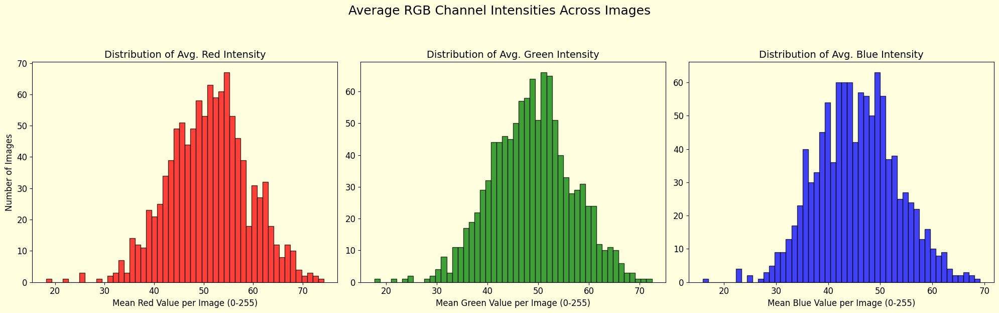


Plotting histogram of average saturation values...


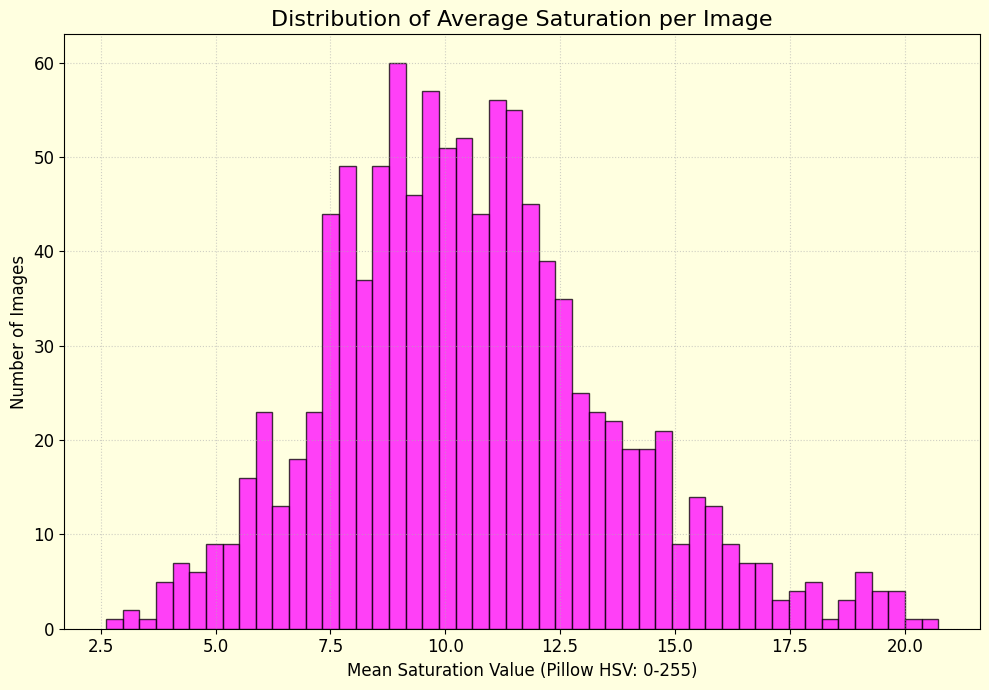


--- Summary Statistics for Color Variability ---

-- Avg Red per Image --
Overall Mean: 51.07
Median: 51.25
Std Dev: 8.05
Min: 18.21
Max: 74.21

-- Avg Green per Image --
Overall Mean: 48.75
Median: 48.85
Std Dev: 7.98
Min: 17.68
Max: 72.43

-- Avg Blue per Image --
Overall Mean: 45.51
Median: 45.30
Std Dev: 7.76
Min: 15.88
Max: 69.19

-- Avg Saturation per Image (Pillow HSV 0-255) --
Overall Mean: 10.54
Median: 10.28
Std Dev: 3.08
Min: 2.62
Max: 20.73


In [12]:
def print_channel_stats(channel_name, data):
    if not data:
        print(f"No data for {channel_name}.")
        return
    print(f"\n-- {channel_name} --")
    print(f"Overall Mean: {np.mean(data):.2f}")
    print(f"Median: {np.median(data):.2f}")
    print(f"Std Dev: {np.std(data):.2f}")
    print(f"Min: {np.min(data):.2f}")
    print(f"Max: {np.max(data):.2f}")

def analyze_color_variability(folder_path):
    if not os.path.isdir(folder_path):
        print(f"Error: Folder not found at {folder_path}")
        return

    image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff') # Common static image types
    
    avg_reds = []
    avg_greens = []
    avg_blues = []
    avg_saturations = []
    
    print(f"Analyzing images in '{folder_path}' for color variability...")
    processed_images_count = 0

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(image_extensions):
            image_path = os.path.join(folder_path, filename)
            try:
                img_pil = Image.open(image_path)

                # 1. Average Channel Intensities (RGB)
                img_rgb_pil = img_pil.convert('RGB') 
                img_rgb_array = np.array(img_rgb_pil)
                
                if img_rgb_array.ndim == 3 and img_rgb_array.shape[2] == 3: # Check if it's a color image
                    avg_reds.append(np.mean(img_rgb_array[:,:,0]))
                    avg_greens.append(np.mean(img_rgb_array[:,:,1]))
                    avg_blues.append(np.mean(img_rgb_array[:,:,2]))

                    # 2. Saturation Variability (HSV)
                    img_hsv_pil = img_rgb_pil.convert('HSV')
                    img_hsv_array = np.array(img_hsv_pil)
                    avg_saturations.append(np.mean(img_hsv_array[:,:,1])) 
                    
                else:
                    print(f"Warning: Skipping '{filename}' as it's not a standard RGB image (shape: {img_rgb_array.shape}).")
                    continue
            except Exception as e:
                print(f"An error occurred while processing {filename}: {e}")
        

    # Histograms of Average RGB Channel Intensities
    if avg_reds: 
        print("\nPlotting histograms of average RGB channel intensities...")
        fig_rgb_hist, axs_rgb_hist = plt.subplots(1, 3, figsize=(20, 6))
        
        axs_rgb_hist[0].hist(avg_reds, bins=50, color='red', alpha=0.75, edgecolor='black')
        axs_rgb_hist[0].set_title('Distribution of Avg. Red Intensity', fontsize=14)
        axs_rgb_hist[0].set_xlabel('Mean Red Value per Image (0-255)', fontsize=12)
        axs_rgb_hist[0].set_ylabel('Number of Images', fontsize=12)
        
        axs_rgb_hist[1].hist(avg_greens, bins=50, color='green', alpha=0.75, edgecolor='black')
        axs_rgb_hist[1].set_title('Distribution of Avg. Green Intensity', fontsize=14)
        axs_rgb_hist[1].set_xlabel('Mean Green Value per Image (0-255)', fontsize=12)
        
        axs_rgb_hist[2].hist(avg_blues, bins=50, color='blue', alpha=0.75, edgecolor='black')
        axs_rgb_hist[2].set_title('Distribution of Avg. Blue Intensity', fontsize=14)
        axs_rgb_hist[2].set_xlabel('Mean Blue Value per Image (0-255)', fontsize=12)
        
        fig_rgb_hist.suptitle('Average RGB Channel Intensities Across Images', fontsize=18, y=1.03)
        plt.tight_layout(rect=[0, 0, 1, 0.97]) 
        plt.show()

    # Histogram of Average Saturation Values
    if avg_saturations: 
        print("\nPlotting histogram of average saturation values...")
        plt.figure(figsize=(10, 7)) 
        plt.hist(avg_saturations, bins=50, color='magenta', alpha=0.75, edgecolor='black')
        plt.title('Distribution of Average Saturation per Image', fontsize=16)
        plt.xlabel('Mean Saturation Value (Pillow HSV: 0-255)', fontsize=12)
        plt.ylabel('Number of Images', fontsize=12)
        plt.grid(True, linestyle=':', alpha=0.6)
        plt.tight_layout()
        plt.show()
    
    print("\n--- Summary Statistics for Color Variability ---")
    if avg_reds: print_channel_stats("Avg Red per Image", avg_reds)
    if avg_greens: print_channel_stats("Avg Green per Image", avg_greens)
    if avg_blues: print_channel_stats("Avg Blue per Image", avg_blues)
    if avg_saturations: print_channel_stats("Avg Saturation per Image (Pillow HSV 0-255)", avg_saturations)

analyze_color_variability(data_path)

Overall, our image collection exhibits a distinctive color profile, generally characterized by a dark, muted aesthetic with a subtle warm, reddish-brown tone. 

This is evidenced by a slightly higher mean on the Red and Green channels, which contributes to a predominantly yellowish hue, with most images clustering around an average RGB range of approximately 51-48-45. A defining characteristic is the extremely low average saturation, recorded at 10.53 (out of a possible 255), with the highest individual image saturation reaching only 20.73. 

This very low saturation renders the images with a muted, almost monochromatic appearance. While the collection shares this consistent low-energy, desaturated aesthetic, there is still a healthy amount of color variation among the images, with some samples appearing noticeably redder or bluer than the average, ensuring a degree of diversity within the dataset's general color profile.

# Data Preprocessing
---

## Delete all blurry images

In [13]:
images_to_delete = blurry_images

for img_path in images_to_delete:
    try:
        if os.path.exists(img_path):
            os.remove(img_path)
            print(f"Deleted: {img_path}")
        else:
            print(f"File not found: {img_path}")
    except Exception as e:
        print(f"Error deleting {img_path}: {e}")

Lets just do a 100x100 image for the input because the output taregt is 100x100

## Normalize the pixel value and resize

In [14]:
IMG_HEIGHT = 100
IMG_WIDTH = 100
CHANNELS = 3
BATCH_SIZE = 32

In this some preprocessing is done, like make the pixel value ranging from [-1, 1] and resizing it from all 600x600 pictures just to be 100x100, also the pixel value would be normalized to [-1, 1] so the model will learn the numbers easier. Some augmentation is also done to make the model to be more robust towards different positioning of the pistachios

In [15]:
def preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=CHANNELS, expand_animations=False)
    img = tf.image.resize(img, [IMG_HEIGHT, IMG_WIDTH])
    
    img = tf.image.random_flip_left_right(img)

    img = (tf.cast(img, tf.float32) / 127.5) - 1.0 ## Because the generator is asked for the output to be tanh so we need it to be [-1 1]
    img.set_shape([IMG_HEIGHT, IMG_WIDTH, CHANNELS])
    
    return img

Batches and prefetch is also done here to boost training process. Also the data is being shuffled so it will ensure a better training process.

In [16]:
data_path_list = glob.glob(os.path.join(data_path, "*.jpg"))
data = tf.data.Dataset.from_tensor_slices(data_path_list)
data = data.shuffle(buffer_size = len(data_path_list), reshuffle_each_iteration = True) # shuffle the data 
data = data.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
data = data.batch(BATCH_SIZE, drop_remainder=False)
data = data.prefetch(tf.data.AUTOTUNE)

After preprocessing lets take a look at some example, and comparison between real and processed data

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


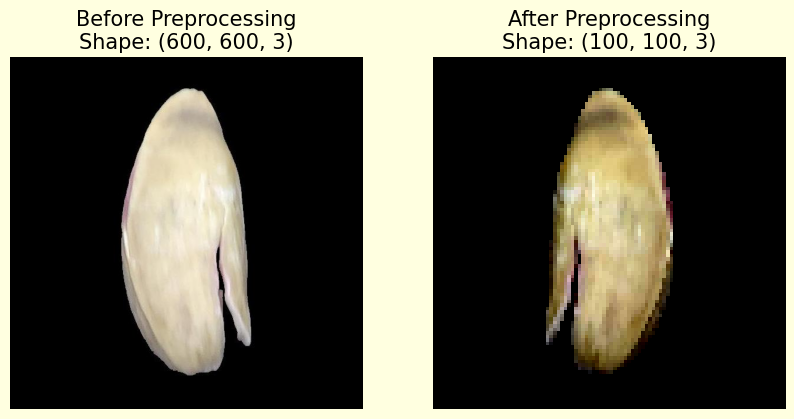

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8784313].


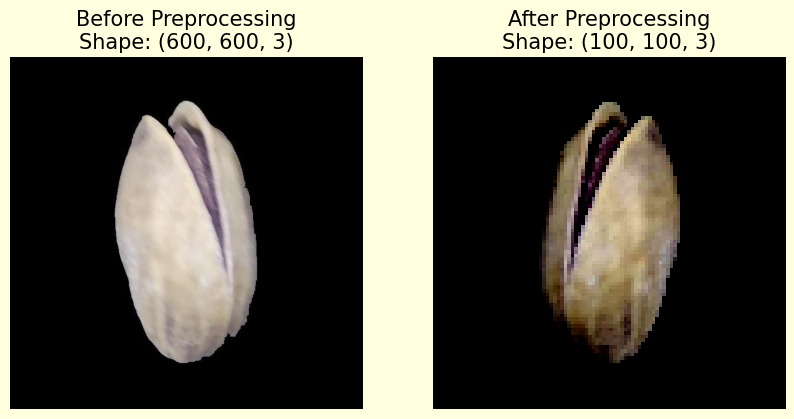

In [17]:
path_ds = tf.data.Dataset.from_tensor_slices(data_path_list)
image_ds = path_ds.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
paired_ds = tf.data.Dataset.zip((path_ds, image_ds))
data_for_viz = paired_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

for paths, images in data_for_viz.take(2):
    
    path_to_show = paths[0].numpy().decode('utf-8')
    
    # The corresponding processed image tensor from the batch
    image_to_show = images[0]
    
    # Create a figure with two subplots, side-by-side
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    
    original_image = mpimg.imread(path_to_show)
    ax[0].imshow(original_image)
    ax[0].set_title(f"Before Preprocessing\nShape: {original_image.shape}")
    ax[0].axis('off')

    ax[1].imshow(image_to_show)
    ax[1].set_title(f"After Preprocessing\nShape: {image_to_show.shape}")
    ax[1].axis('off')
    
    plt.show()

Now that the data is processed, we can feed the data into our models.

# Modeling
---

## A. Baseline : DCGAN
---

### Building the model

For all the model i use 128 as the latent dimention to preserve the information of my 100x100x3 dataset. This number is sufficient enough the keep the features inside for the images while being not redundant compare dot the larger latent dimension size.

In [14]:
LATENT_DIM = 128

Some step are done here in the generator
1. Using the Fully Connected Layer of 28x28x64 to transform the `LATENT_DIM` to a much larger vector. This will make it to be a 28*28 feature map with 64 channels. It is done by the help of Resize too that gives a flat output of Dense to have form of 3D Tensor.
2. 2 Times upsampling in block 1 and block 2 from the shape of 28x28 to 56x56 (padding valid to 54x54) then 108x108 (with padding valid to 104*104) These 2 blocks are equipped with BatchNormalization so no bias needed and ReLu to keep the output to be positive.
3. Then the output layer of tanh, giving the image of pixel values ranging from [-1, 1]

#### Generator

In [67]:
def build_generator():
    noise_input = Input(shape=(LATENT_DIM,))

    # Block 0
    x = Dense(28 * 28 * 64, use_bias=False)(noise_input)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Reshape((28, 28, 64))(x)

    # Block 1: Upsampling to ~56x56
    x = UpSampling2D()(x)  # 28x28 -> 56x56
    x = Conv2D(16, 3, strides=1, padding='valid', use_bias=False)(x)  # 56x56 -> 54x54
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Block 2: Upsampling to ~108x108
    x = UpSampling2D()(x)  # 54x54 -> 108x108
    x = Conv2D(32, 3, strides=1, padding='valid', use_bias=False)(x)  # 108x108 -> 106x106
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Block 3: Final Convolution Layer
    x = Conv2D(64, 3, strides=1, padding='valid', use_bias=False)(x)  # 106x106 -> 104x104
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Output layer 3 channel with tanh
    x = Conv2D(CHANNELS, 3, strides=1, padding='valid', activation='tanh')(x)  # 104x104 -> 102x102
    output_image = Cropping2D(cropping=((1, 1), (1, 1)))(x)  # 102x102 -> 100x100

    generator = Model(noise_input, output_image, name="generator")
    return generator

#### Discriminator

The discriminator build with 3 layers of convolution from 16 32 and 64 neurons. It then connected to a fully connected layer that is a binary classificator. The classificator then will predict if the image generated by the generator is real or fake. This will be the feedback to the generator to improve if the prediction of the discriminator is fake and its right. But if the prediction of the discriminator is real and its wrong, then generator would be able to know how to produce an image to "lie" to the discriminator and will repeat that pattern as the best model output. Some dropout are also implemented here to reduce the overfitting for the discriminator

In [68]:
def build_discriminator():
    image_input = Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))

    # Layer conv 1
    # Kernel: 16, size: 3x3, Strides: 1, Padding: 'valid', activation: ReLU
    x = Conv2D(16, kernel_size=3, strides=1, padding='valid', activation='relu')(image_input)
    x = Dropout(0.3)(x)
    # Layer conv 2
    # Kernel: 32, size: 3x3, Strides: 1, Padding: 'valid', activation: ReLU
    x = Conv2D(32, kernel_size=3, strides=1, padding='valid', activation='relu')(x)
    x = Dropout(0.3)(x)
    # Layer conv 3
    # Kernel: 64, size: 3x3, Strides: 1, Padding: 'valid', activation: ReLU
    x = Conv2D(64, kernel_size=3, strides=1, padding='valid', activation='relu')(x)
    x = Dropout(0.3)(x)
    # Flatten feature map u
    x = Flatten()(x)

    # Output layer: Fully connected 1 neuron act Sigmoid
    output_prob = Dense(1, activation='sigmoid')(x)

    discriminator = Model(image_input, output_prob, name="discriminator")
    return discriminator

#### Build Model Class

- In this model class, we will have some object like discriminator, generator, latent tim, dlossmetric, glossmetric in super init . Inheriting keras.Model so method `fit()`, `predict()`, etc will be able to be used here.

- `super().compile()` will call the compile method from keras.Model parent class. <br>
Optimizer for generator and discriminator will also be stored in here. Beside that, the loss will be stored here also.

- Property of metrics will allow us to automatically access and reset our custom loss metrics at beginning of each epochs. Also showing it while training

- Train Step --> This is the core for the training
1. First gradient tape is training the discriminator first to be able to predict what is real and what is fake. <br>
> This use `tf.GradientTape` to count the gradients of the d_loss with the respect of all the trainable weights in the discriminator. This is done by the generator making fake images and then the image will be combined with the real one and labeled 0 for fake and 1 for real. Then discriminator will predict and the loss will be calculated based on the comparison of the discriminator prediction and the real labels on the step.

The discriminator will be trained 3 times for each time the generator trained so it will always be a strong teacher for the gene

2. Second Gradient tape is for training the generator, and we train it to fool the discriminator. The discriminator weight is not updated in this phase.
> `random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))` --> This is used to make sure that the generator is making a varied images not just refine the last one from discriminator step <br>
> `misleading_labels = tf.ones((batch_size, 1))` --> Key of generator training. For generator, label 1 = fake. So its counteraction with the discriminator <br>
> `fake_images = self.generator(random_latent_vectors, training=True)` --> Then the generator will generate fake images <br>
> `predictions = self.discriminator(fake_images, training=True)` --> The discriminator will examine the fake images all over again <br>
> `g_loss = self.loss_fn(misleading_labels, predictions)` --> and the generator loss will be updated based on the previous step

- And at last it will return the loss and the result

In [69]:
class GAN(Model):
    def __init__(self, discriminator, generator, latent_dim, dsteps=3):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_loss_metric = tf.keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")
        self.d_steps = dsteps

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]
        
        # Train the discriminator multiple times
        for _ in range(self.d_steps):
            random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
            fake_images = self.generator(random_latent_vectors, training=True)
            combined_images = tf.concat([real_images, fake_images], axis=0)
            
            # Real image labels are 0.9 instead of 1.0.
            real_labels = tf.ones((batch_size, 1)) * 0.9 
            fake_labels = tf.zeros((batch_size, 1))
            labels = tf.concat([real_labels, fake_labels], axis=0)

            with tf.GradientTape() as tape:
                predictions = self.discriminator(combined_images, training=True)
                d_loss = self.loss_fn(labels, predictions)
            grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
            self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights))

        # --- Train the generator once ---
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        misleading_labels = tf.ones((batch_size, 1))

        with tf.GradientTape() as tape:
            fake_images = self.generator(random_latent_vectors, training=True)
            predictions = self.discriminator(fake_images, training=True)
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

#### Monitor

This monitor will be very useful to be used. These will be used for monitoring the GAN Training progress and keeping it documented. 
- This parent initialized with some objects like num_img, latent_dimention, output directory, frequency of image saved, and for the model saved. It also make the directory if its not available yet
- Function on epoch end will be used to plot example of generator example of Generated Image for us to see the progress of the training, we will be able to know if the model is getting better. And for the second phase, it will be saving the models on iteration N to make sure that the model is documented and if the training is crash, we can continue from there. It also preserve a better model if the future training provide a worse result

In [70]:
class GANMonitor(tf.keras.callbacks.Callback):

    def __init__(self, num_img=3, latent_dim=128, output_dir="gan_training_run_modified", image_freq=10, save_freq=50):
        # parameter init
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.output_dir = output_dir
        self.image_freq = image_freq # n epochs to save img
        self.save_freq = save_freq    # n epochs to save weight
        if not os.path.exists(self.output_dir):
            os.makedirs(self.output_dir)

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.image_freq == 0:
            print(f"\n--- Membuat gambar di epoch {epoch + 1} ---")
            
            random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
            generated_images = self.model.generator(random_latent_vectors, training=False)
            generated_images = (generated_images + 1) / 2.0 # Denormalisasi ke [0, 1]

            fig, axes = plt.subplots(1, self.num_img, figsize=(15, 15))
            for i in range(self.num_img):
                img = tf.keras.preprocessing.image.array_to_img(generated_images[i])
                axes[i].imshow(img)
                axes[i].axis('off')
            
            # Saving pictures to file
            plt.savefig(os.path.join(self.output_dir, f"generated_image_epoch_{epoch+1:04d}.png"))
            plt.show()
            plt.close()

        if (epoch + 1) % self.save_freq == 0:
            # saving weight
            gen_path = os.path.join(self.output_dir, f"generator_weights_epoch_{epoch+1:04d}.h5")
            disc_path = os.path.join(self.output_dir, f"discriminator_weights_epoch_{epoch+1:04d}.h5")
            
            self.model.generator.save_weights(gen_path)
            self.model.discriminator.save_weights(disc_path)

            print(f"\n>>> Checkpoint disimpan di epoch {epoch+1}:")
            print(f"    -> Generator: {gen_path}")
            print(f"    -> Discriminator: {disc_path}")

In [71]:
generator = build_generator()
discriminator = build_discriminator()

In [72]:
print("--- Arsitektur Generator ---")
generator.summary()
print("\n--- Arsitektur Diskriminator ---")
discriminator.summary()

--- Arsitektur Generator ---
Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_55 (InputLayer)       [(None, 128)]             0         
                                                                 
 dense_54 (Dense)            (None, 50176)             6422528   
                                                                 
 batch_normalization_82 (Bat  (None, 50176)            200704    
 chNormalization)                                                
                                                                 
 re_lu_82 (ReLU)             (None, 50176)             0         
                                                                 
 reshape_27 (Reshape)        (None, 28, 28, 64)        0         
                                                                 
 up_sampling2d_54 (UpSamplin  (None, 56, 56, 64)       0         
 g2D)                       

#### Compile

The model is then trained with Adam optimizer and loss of Binary CrossEntropy.

In [21]:
g_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5)
d_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5)
loss_fn = tf.keras.losses.BinaryCrossentropy()

# Buat instance GAN
gan = GAN(discriminator=discriminator, generator=generator, latent_dim=LATENT_DIM)

# Compile model GAN
gan.compile(d_optimizer=d_optimizer, g_optimizer=g_optimizer, loss_fn=loss_fn)

### Training

500 Epoch will be used here. Usually GAN would need thousands of epochs for it to make the best result. But 500 would be enough for exam. Isnt it, Bu Lili :D

Epoch 1/500
34/34 [==============================] - 34s 324ms/step - d_loss: 0.1866 - g_loss: 4.8831
Epoch 2/500
34/34 [==============================] - 9s 276ms/step - d_loss: 0.1751 - g_loss: 5.5720
Epoch 3/500
34/34 [==============================] - 9s 278ms/step - d_loss: 0.1898 - g_loss: 4.9191
Epoch 4/500
34/34 [==============================] - 10s 284ms/step - d_loss: 0.2971 - g_loss: 3.2051
Epoch 5/500
34/34 [==============================] - 9s 277ms/step - d_loss: 0.3883 - g_loss: 2.0415
Epoch 6/500
34/34 [==============================] - 10s 279ms/step - d_loss: 0.4132 - g_loss: 1.8498
Epoch 7/500
34/34 [==============================] - 9s 275ms/step - d_loss: 0.4012 - g_loss: 1.7022
Epoch 8/500
34/34 [==============================] - 10s 279ms/step - d_loss: 0.4044 - g_loss: 1.7264
Epoch 9/500
34/34 [==============================] - 9s 270ms/step - d_loss: 0.3896 - g_loss: 1.7235
Epoch 10/500
34/34 [==============================] - ETA: 0s - d_loss: 0.3614 - g_loss

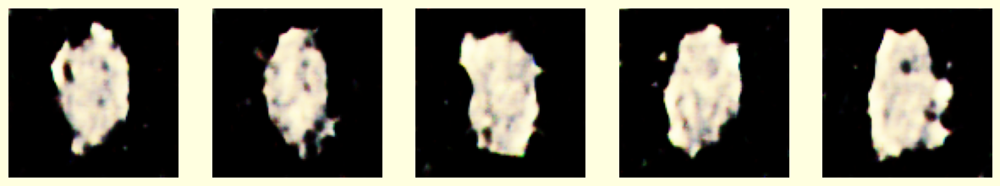

34/34 [==============================] - 9s 269ms/step - d_loss: 0.3614 - g_loss: 1.8356
Epoch 11/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3329 - g_loss: 2.0205
Epoch 12/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3178 - g_loss: 2.1502
Epoch 13/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3117 - g_loss: 2.1563
Epoch 14/500
34/34 [==============================] - 9s 276ms/step - d_loss: 0.3363 - g_loss: 2.1395
Epoch 15/500
34/34 [==============================] - 10s 279ms/step - d_loss: 0.3640 - g_loss: 2.1197
Epoch 16/500
34/34 [==============================] - 10s 281ms/step - d_loss: 0.3789 - g_loss: 2.0010
Epoch 17/500
34/34 [==============================] - 10s 279ms/step - d_loss: 0.3857 - g_loss: 1.8164
Epoch 18/500
34/34 [==============================] - 10s 281ms/step - d_loss: 0.4019 - g_loss: 2.0190
Epoch 19/500
34/34 [==============================] - 10s 280ms/step - d_loss: 0.4035 - g_l

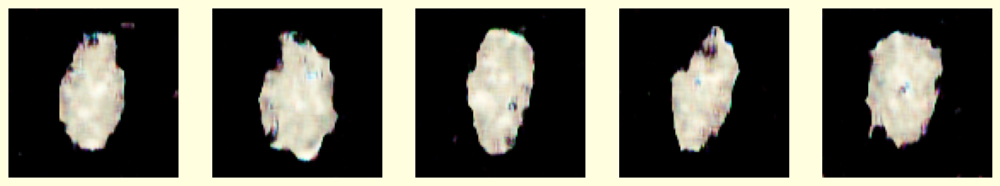

34/34 [==============================] - 10s 288ms/step - d_loss: 0.3867 - g_loss: 1.8817
Epoch 21/500
34/34 [==============================] - 9s 274ms/step - d_loss: 0.4005 - g_loss: 1.9359
Epoch 22/500
34/34 [==============================] - 10s 279ms/step - d_loss: 0.3902 - g_loss: 1.8966
Epoch 23/500
34/34 [==============================] - 10s 279ms/step - d_loss: 0.3892 - g_loss: 1.8688
Epoch 24/500
34/34 [==============================] - 9s 279ms/step - d_loss: 0.3935 - g_loss: 2.0331
Epoch 25/500
34/34 [==============================] - 9s 276ms/step - d_loss: 0.4285 - g_loss: 1.7690
Epoch 26/500
34/34 [==============================] - 10s 279ms/step - d_loss: 0.3980 - g_loss: 1.8733
Epoch 27/500
34/34 [==============================] - 9s 268ms/step - d_loss: 0.3951 - g_loss: 1.8900
Epoch 28/500
34/34 [==============================] - 9s 273ms/step - d_loss: 0.4069 - g_loss: 1.8258
Epoch 29/500
34/34 [==============================] - 10s 278ms/step - d_loss: 0.4387 - g_l

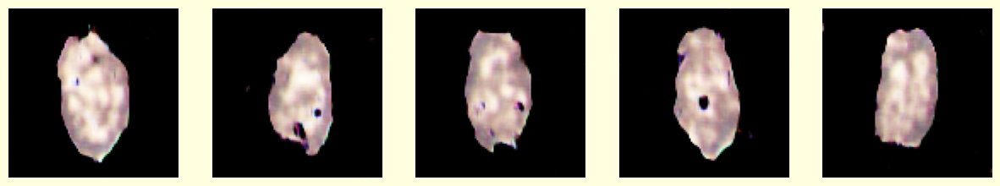

34/34 [==============================] - 9s 267ms/step - d_loss: 0.4215 - g_loss: 1.7901
Epoch 31/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.4191 - g_loss: 1.8475
Epoch 32/500
34/34 [==============================] - 9s 258ms/step - d_loss: 0.4081 - g_loss: 1.8488
Epoch 33/500
34/34 [==============================] - 9s 258ms/step - d_loss: 0.3990 - g_loss: 1.9831
Epoch 34/500
34/34 [==============================] - 9s 258ms/step - d_loss: 0.3919 - g_loss: 1.9454
Epoch 35/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4036 - g_loss: 1.9178
Epoch 36/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.4138 - g_loss: 2.0084
Epoch 37/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4369 - g_loss: 1.8135
Epoch 38/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4284 - g_loss: 1.7641
Epoch 39/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4455 - g_loss: 

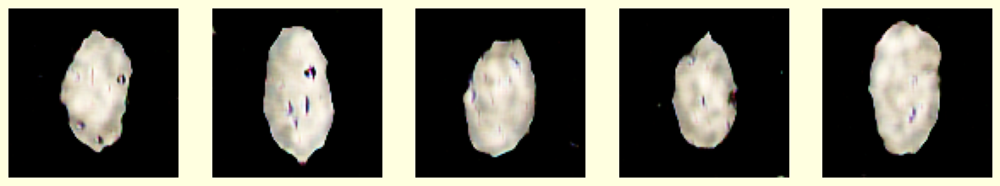

34/34 [==============================] - 9s 264ms/step - d_loss: 0.4480 - g_loss: 1.7707
Epoch 41/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4411 - g_loss: 1.6814
Epoch 42/500
34/34 [==============================] - 9s 267ms/step - d_loss: 0.4349 - g_loss: 1.6532
Epoch 43/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.4397 - g_loss: 1.7871
Epoch 44/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.4478 - g_loss: 1.6854
Epoch 45/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4276 - g_loss: 1.7274
Epoch 46/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.4421 - g_loss: 1.8136
Epoch 47/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.4554 - g_loss: 1.7338
Epoch 48/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.4430 - g_loss: 1.7132
Epoch 49/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.4546 - g_loss: 

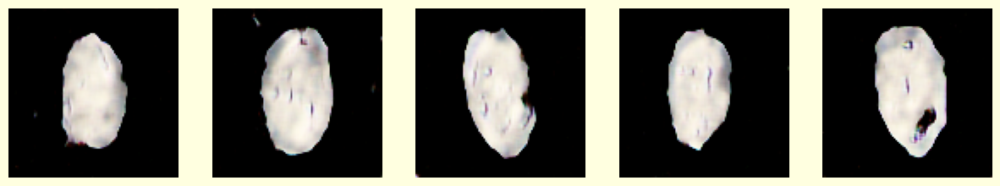


>>> Checkpoint disimpan di epoch 50:
    -> Generator: gan_training_run_modified\generator_weights_epoch_0050.h5
    -> Discriminator: gan_training_run_modified\discriminator_weights_epoch_0050.h5
34/34 [==============================] - 9s 273ms/step - d_loss: 0.4521 - g_loss: 1.7227
Epoch 51/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4446 - g_loss: 1.7014
Epoch 52/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.4468 - g_loss: 1.7575
Epoch 53/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4388 - g_loss: 1.6418
Epoch 54/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4515 - g_loss: 1.7347
Epoch 55/500
34/34 [==============================] - 9s 274ms/step - d_loss: 0.4387 - g_loss: 1.6950
Epoch 56/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.4449 - g_loss: 1.7917
Epoch 57/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.4580 - g_loss: 1.6806

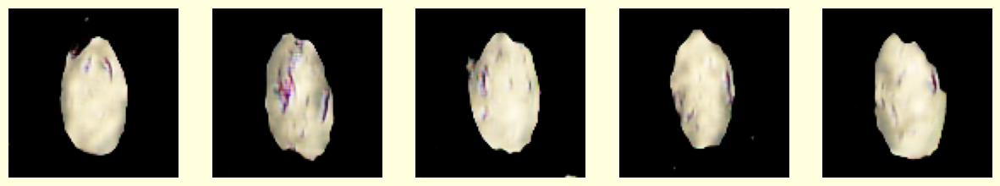

34/34 [==============================] - 9s 268ms/step - d_loss: 0.4477 - g_loss: 1.5266
Epoch 61/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.4609 - g_loss: 1.6910
Epoch 62/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.4536 - g_loss: 1.7508
Epoch 63/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4606 - g_loss: 1.6084
Epoch 64/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4589 - g_loss: 1.7645
Epoch 65/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4695 - g_loss: 1.6753
Epoch 66/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.4728 - g_loss: 1.7409
Epoch 67/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4942 - g_loss: 1.5420
Epoch 68/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4687 - g_loss: 1.5835
Epoch 69/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4729 - g_loss: 

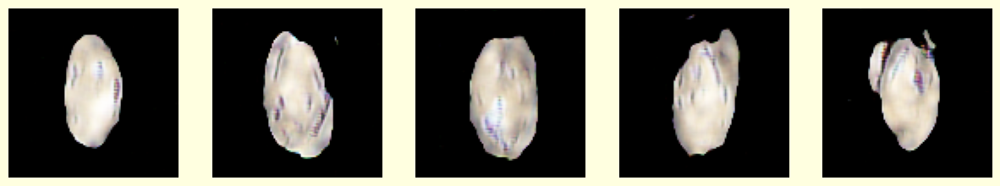

34/34 [==============================] - 9s 266ms/step - d_loss: 0.4919 - g_loss: 1.5495
Epoch 71/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4745 - g_loss: 1.6122
Epoch 72/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4770 - g_loss: 1.5960
Epoch 73/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.4645 - g_loss: 1.4492
Epoch 74/500
34/34 [==============================] - 10s 280ms/step - d_loss: 0.4710 - g_loss: 1.6524
Epoch 75/500
34/34 [==============================] - 10s 281ms/step - d_loss: 0.4639 - g_loss: 1.4732
Epoch 76/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.4641 - g_loss: 1.5414
Epoch 77/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.4747 - g_loss: 1.5312
Epoch 78/500
34/34 [==============================] - 9s 277ms/step - d_loss: 0.4664 - g_loss: 1.6372
Epoch 79/500
34/34 [==============================] - 9s 269ms/step - d_loss: 0.4646 - g_loss

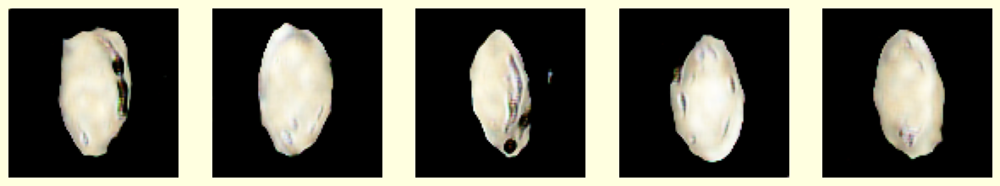

34/34 [==============================] - 10s 289ms/step - d_loss: 0.4643 - g_loss: 1.7232
Epoch 81/500
34/34 [==============================] - 9s 269ms/step - d_loss: 0.4560 - g_loss: 1.5720
Epoch 82/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4580 - g_loss: 1.5173
Epoch 83/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.4684 - g_loss: 1.6725
Epoch 84/500
34/34 [==============================] - 10s 285ms/step - d_loss: 0.4716 - g_loss: 1.6373
Epoch 85/500
34/34 [==============================] - 9s 277ms/step - d_loss: 0.4443 - g_loss: 1.5272
Epoch 86/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4512 - g_loss: 1.5970
Epoch 87/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4770 - g_loss: 1.4568
Epoch 88/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4597 - g_loss: 1.5892
Epoch 89/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4666 - g_loss

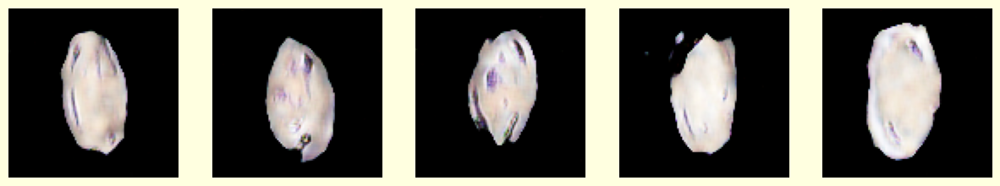

34/34 [==============================] - 10s 284ms/step - d_loss: 0.4624 - g_loss: 1.6027
Epoch 91/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4745 - g_loss: 1.4957
Epoch 92/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4691 - g_loss: 1.5862
Epoch 93/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4637 - g_loss: 1.5481
Epoch 94/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4771 - g_loss: 1.6287
Epoch 95/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4732 - g_loss: 1.5831
Epoch 96/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4613 - g_loss: 1.5350
Epoch 97/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4685 - g_loss: 1.6020
Epoch 98/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4614 - g_loss: 1.6265
Epoch 99/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4601 - g_loss:

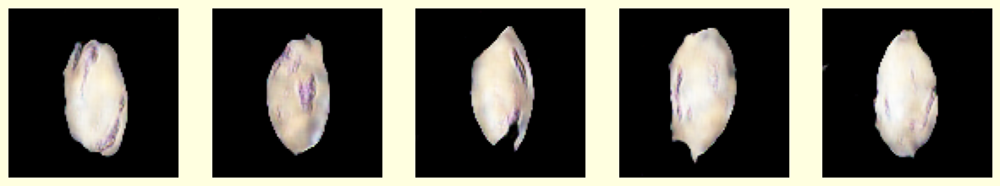


>>> Checkpoint disimpan di epoch 100:
    -> Generator: gan_training_run_modified\generator_weights_epoch_0100.h5
    -> Discriminator: gan_training_run_modified\discriminator_weights_epoch_0100.h5
34/34 [==============================] - 9s 272ms/step - d_loss: 0.4664 - g_loss: 1.6112
Epoch 101/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4742 - g_loss: 1.6639
Epoch 102/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4740 - g_loss: 1.6184
Epoch 103/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4813 - g_loss: 1.5904
Epoch 104/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4852 - g_loss: 1.5097
Epoch 105/500
34/34 [==============================] - 9s 270ms/step - d_loss: 0.4832 - g_loss: 1.5120
Epoch 106/500
34/34 [==============================] - 10s 295ms/step - d_loss: 0.4894 - g_loss: 1.6059
Epoch 107/500
34/34 [==============================] - 10s 284ms/step - d_loss: 0.4810 - g_lo

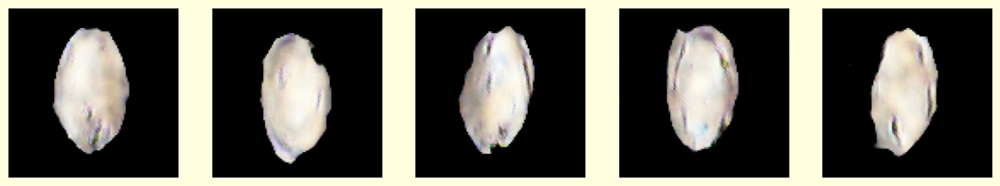

34/34 [==============================] - 10s 307ms/step - d_loss: 0.4640 - g_loss: 1.6158
Epoch 111/500
34/34 [==============================] - 10s 288ms/step - d_loss: 0.4637 - g_loss: 1.6159
Epoch 112/500
34/34 [==============================] - 10s 293ms/step - d_loss: 0.4575 - g_loss: 1.6940
Epoch 113/500
34/34 [==============================] - 10s 289ms/step - d_loss: 0.4600 - g_loss: 1.6148
Epoch 114/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4551 - g_loss: 1.6414
Epoch 115/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4582 - g_loss: 1.6760
Epoch 116/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4476 - g_loss: 1.5843
Epoch 117/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4622 - g_loss: 1.6318
Epoch 118/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.4556 - g_loss: 1.5233
Epoch 119/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.46

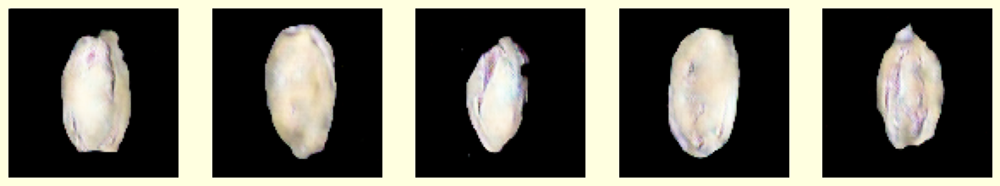

34/34 [==============================] - 9s 266ms/step - d_loss: 0.4620 - g_loss: 1.5972
Epoch 121/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4593 - g_loss: 1.6432
Epoch 122/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4544 - g_loss: 1.7093
Epoch 123/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4519 - g_loss: 1.6285
Epoch 124/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4604 - g_loss: 1.6257
Epoch 125/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4549 - g_loss: 1.7535
Epoch 126/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.4452 - g_loss: 1.7151
Epoch 127/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4677 - g_loss: 1.6791
Epoch 128/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4546 - g_loss: 1.6493
Epoch 129/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4513 -

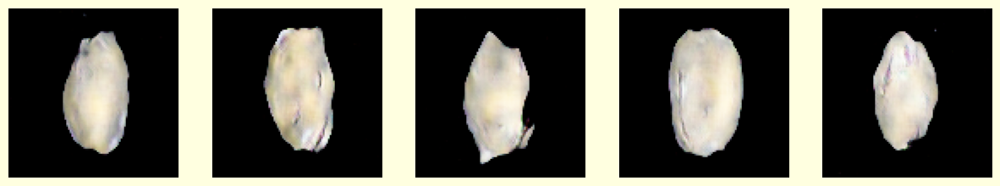

34/34 [==============================] - 9s 268ms/step - d_loss: 0.4576 - g_loss: 1.6054
Epoch 131/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4451 - g_loss: 1.5602
Epoch 132/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4540 - g_loss: 1.7519
Epoch 133/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.4544 - g_loss: 1.6898
Epoch 134/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.4558 - g_loss: 1.7315
Epoch 135/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4548 - g_loss: 1.7233
Epoch 136/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4549 - g_loss: 1.6613
Epoch 137/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4518 - g_loss: 1.7266
Epoch 138/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4651 - g_loss: 1.6767
Epoch 139/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4515 -

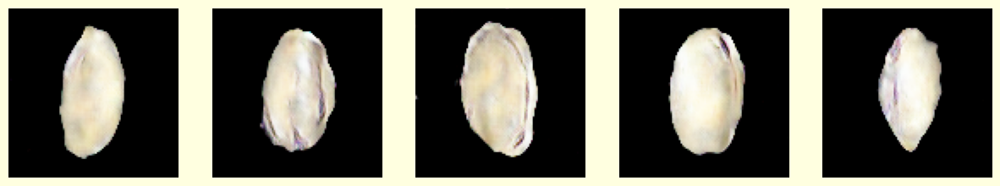

34/34 [==============================] - 9s 267ms/step - d_loss: 0.4517 - g_loss: 1.7451
Epoch 141/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.4594 - g_loss: 1.7631
Epoch 142/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.4549 - g_loss: 1.7329
Epoch 143/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.4468 - g_loss: 1.6740
Epoch 144/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.4516 - g_loss: 1.7066
Epoch 145/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.4572 - g_loss: 1.7297
Epoch 146/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.4467 - g_loss: 1.7074
Epoch 147/500
34/34 [==============================] - 9s 266ms/step - d_loss: 0.4483 - g_loss: 1.7416
Epoch 148/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.4502 - g_loss: 1.7923
Epoch 149/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4438 -

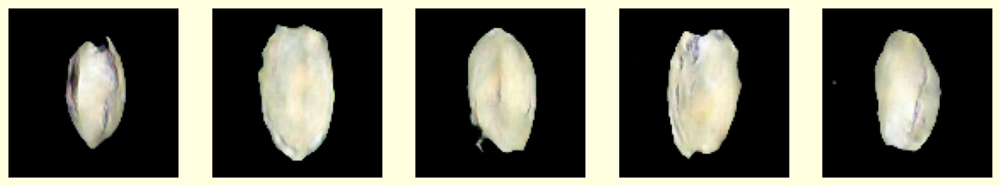


>>> Checkpoint disimpan di epoch 150:
    -> Generator: gan_training_run_modified\generator_weights_epoch_0150.h5
    -> Discriminator: gan_training_run_modified\discriminator_weights_epoch_0150.h5
34/34 [==============================] - 9s 272ms/step - d_loss: 0.4417 - g_loss: 1.7043
Epoch 151/500
34/34 [==============================] - 10s 283ms/step - d_loss: 0.4371 - g_loss: 1.7717
Epoch 152/500
34/34 [==============================] - 10s 287ms/step - d_loss: 0.4435 - g_loss: 1.7458
Epoch 153/500
34/34 [==============================] - 10s 288ms/step - d_loss: 0.4441 - g_loss: 1.6460
Epoch 154/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4444 - g_loss: 1.8240
Epoch 155/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4438 - g_loss: 1.6849
Epoch 156/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4576 - g_loss: 1.7402
Epoch 157/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4431 - g_l

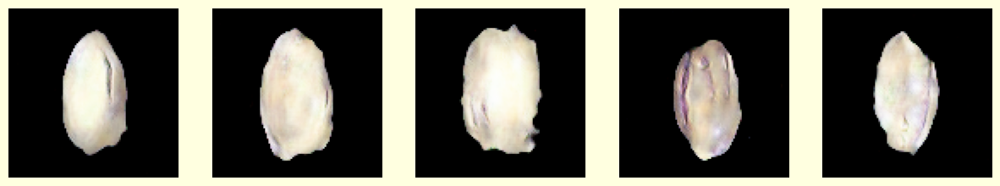

34/34 [==============================] - 9s 265ms/step - d_loss: 0.4477 - g_loss: 1.6799
Epoch 161/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4497 - g_loss: 1.7189
Epoch 162/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4547 - g_loss: 1.7694
Epoch 163/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.4354 - g_loss: 1.7032
Epoch 164/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4354 - g_loss: 1.7508
Epoch 165/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4396 - g_loss: 1.7894
Epoch 166/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4443 - g_loss: 1.8290
Epoch 167/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.4398 - g_loss: 1.7818
Epoch 168/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4459 - g_loss: 1.8128
Epoch 169/500
34/34 [==============================] - 9s 278ms/step - d_loss: 0.4414 -

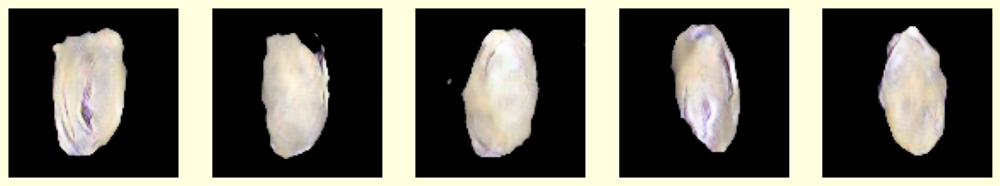

34/34 [==============================] - 10s 297ms/step - d_loss: 0.4349 - g_loss: 1.7574
Epoch 171/500
34/34 [==============================] - 10s 283ms/step - d_loss: 0.4491 - g_loss: 1.8198
Epoch 172/500
34/34 [==============================] - 10s 282ms/step - d_loss: 0.4360 - g_loss: 1.7268
Epoch 173/500
34/34 [==============================] - 10s 285ms/step - d_loss: 0.4395 - g_loss: 1.7817
Epoch 174/500
34/34 [==============================] - 10s 287ms/step - d_loss: 0.4354 - g_loss: 1.8528
Epoch 175/500
34/34 [==============================] - 10s 287ms/step - d_loss: 0.4347 - g_loss: 1.8333
Epoch 176/500
34/34 [==============================] - 9s 270ms/step - d_loss: 0.4388 - g_loss: 1.9025
Epoch 177/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.4322 - g_loss: 1.8200
Epoch 178/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4334 - g_loss: 1.7039
Epoch 179/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.

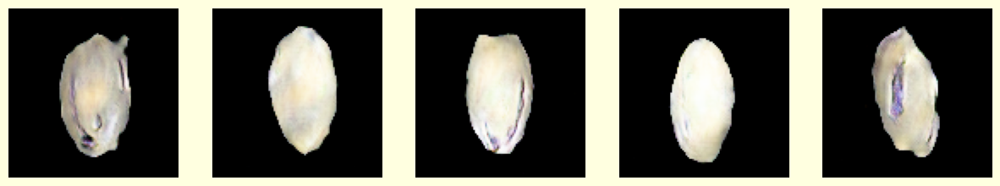

34/34 [==============================] - 9s 268ms/step - d_loss: 0.4327 - g_loss: 1.8939
Epoch 181/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4330 - g_loss: 1.8235
Epoch 182/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4306 - g_loss: 1.9019
Epoch 183/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4327 - g_loss: 1.8577
Epoch 184/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4458 - g_loss: 1.8611
Epoch 185/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4269 - g_loss: 1.7692
Epoch 186/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4365 - g_loss: 1.7421
Epoch 187/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4167 - g_loss: 1.8411
Epoch 188/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4292 - g_loss: 1.8550
Epoch 189/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4315 -

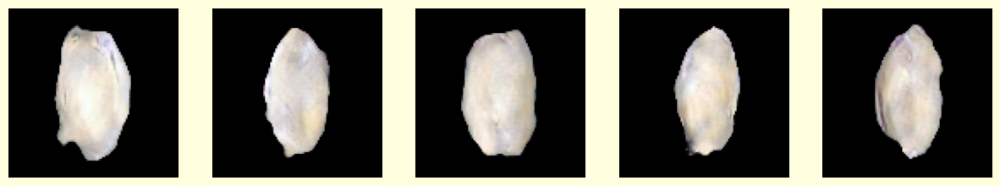

34/34 [==============================] - 9s 266ms/step - d_loss: 0.4330 - g_loss: 1.8578
Epoch 191/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4228 - g_loss: 1.8560
Epoch 192/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4211 - g_loss: 1.8966
Epoch 193/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.4236 - g_loss: 1.8697
Epoch 194/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4163 - g_loss: 1.8821
Epoch 195/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4170 - g_loss: 1.8900
Epoch 196/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4264 - g_loss: 1.8327
Epoch 197/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4163 - g_loss: 1.8663
Epoch 198/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.4232 - g_loss: 1.8781
Epoch 199/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.4211 -

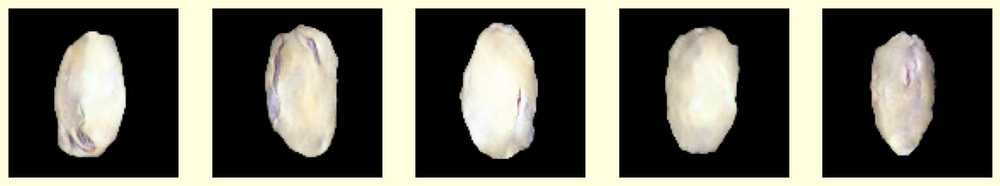


>>> Checkpoint disimpan di epoch 200:
    -> Generator: gan_training_run_modified\generator_weights_epoch_0200.h5
    -> Discriminator: gan_training_run_modified\discriminator_weights_epoch_0200.h5
34/34 [==============================] - 9s 269ms/step - d_loss: 0.4148 - g_loss: 1.8263
Epoch 201/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4178 - g_loss: 1.9528
Epoch 202/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.4176 - g_loss: 1.8782
Epoch 203/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4120 - g_loss: 1.8334
Epoch 204/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.4127 - g_loss: 1.9913
Epoch 205/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.4125 - g_loss: 1.8817
Epoch 206/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.4201 - g_loss: 1.9149
Epoch 207/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4146 - g_loss

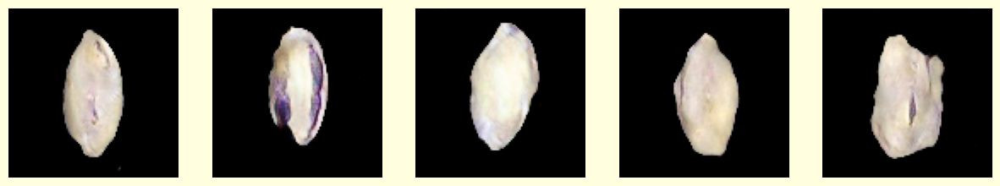

34/34 [==============================] - 9s 270ms/step - d_loss: 0.4188 - g_loss: 1.9415
Epoch 211/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.4117 - g_loss: 1.8939
Epoch 212/500
34/34 [==============================] - 9s 266ms/step - d_loss: 0.4237 - g_loss: 1.9445
Epoch 213/500
34/34 [==============================] - 9s 258ms/step - d_loss: 0.4096 - g_loss: 1.9541
Epoch 214/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.4200 - g_loss: 1.9875
Epoch 215/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.4084 - g_loss: 1.9584
Epoch 216/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.4083 - g_loss: 1.9795
Epoch 217/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.4109 - g_loss: 1.9121
Epoch 218/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.4158 - g_loss: 2.0260
Epoch 219/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.4120 -

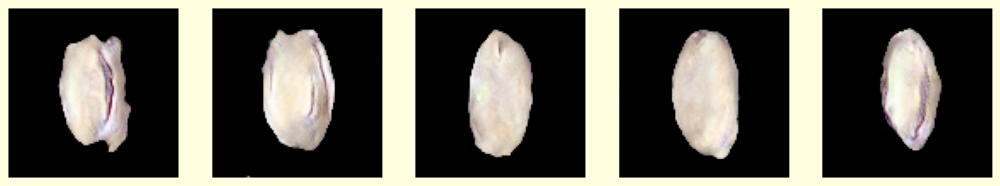

34/34 [==============================] - 9s 262ms/step - d_loss: 0.4176 - g_loss: 1.9696
Epoch 221/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3966 - g_loss: 1.9183
Epoch 222/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.4067 - g_loss: 1.9902
Epoch 223/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.4008 - g_loss: 1.9612
Epoch 224/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.4164 - g_loss: 1.9471
Epoch 225/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.4091 - g_loss: 1.9717
Epoch 226/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.3990 - g_loss: 2.0253
Epoch 227/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3974 - g_loss: 1.9976
Epoch 228/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.4003 - g_loss: 1.9839
Epoch 229/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.3973 -

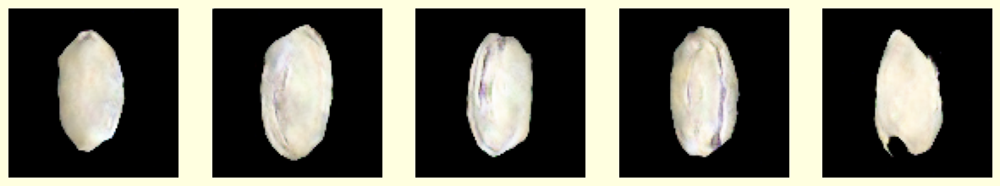

34/34 [==============================] - 9s 263ms/step - d_loss: 0.3997 - g_loss: 1.9345
Epoch 231/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3945 - g_loss: 2.0107
Epoch 232/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.3997 - g_loss: 2.0704
Epoch 233/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.4116 - g_loss: 2.0702
Epoch 234/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.4042 - g_loss: 2.0852
Epoch 235/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.4002 - g_loss: 2.0245
Epoch 236/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3885 - g_loss: 2.0468
Epoch 237/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3958 - g_loss: 2.0119
Epoch 238/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.3888 - g_loss: 1.9916
Epoch 239/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3819 -

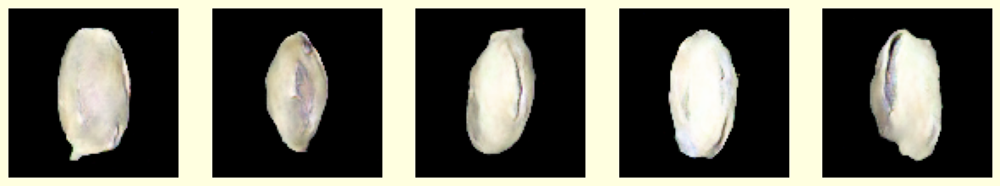

34/34 [==============================] - 9s 266ms/step - d_loss: 0.3844 - g_loss: 2.0342
Epoch 241/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3928 - g_loss: 2.0125
Epoch 242/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3900 - g_loss: 2.0990
Epoch 243/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.3930 - g_loss: 2.0419
Epoch 244/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.4033 - g_loss: 2.0261
Epoch 245/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3933 - g_loss: 2.1072
Epoch 246/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3898 - g_loss: 2.1581
Epoch 247/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3837 - g_loss: 2.0623
Epoch 248/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3846 - g_loss: 2.0510
Epoch 249/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3840 -

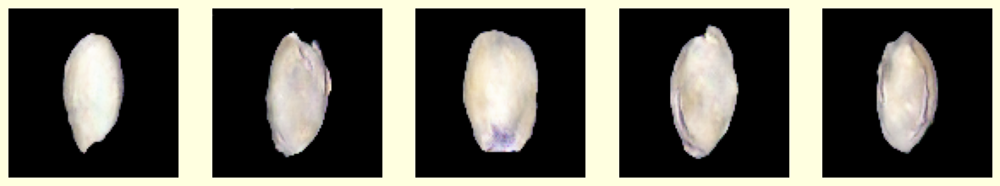


>>> Checkpoint disimpan di epoch 250:
    -> Generator: gan_training_run_modified\generator_weights_epoch_0250.h5
    -> Discriminator: gan_training_run_modified\discriminator_weights_epoch_0250.h5
34/34 [==============================] - 10s 282ms/step - d_loss: 0.3805 - g_loss: 2.1521
Epoch 251/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3874 - g_loss: 2.1306
Epoch 252/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3772 - g_loss: 2.1439
Epoch 253/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3839 - g_loss: 2.0761
Epoch 254/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3836 - g_loss: 2.2471
Epoch 255/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3785 - g_loss: 2.1074
Epoch 256/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3886 - g_loss: 2.1038
Epoch 257/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3774 - g_los

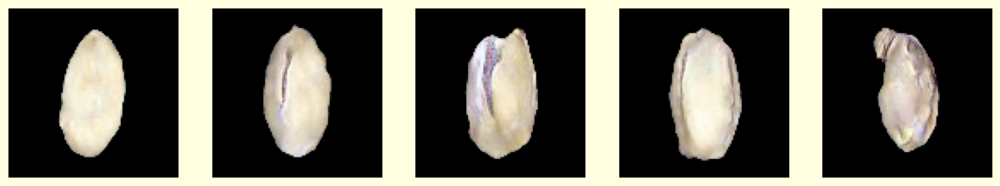

34/34 [==============================] - 9s 269ms/step - d_loss: 0.3995 - g_loss: 2.1591
Epoch 261/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3885 - g_loss: 2.0505
Epoch 262/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3782 - g_loss: 2.1263
Epoch 263/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3719 - g_loss: 2.0816
Epoch 264/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.3769 - g_loss: 2.1772
Epoch 265/500
34/34 [==============================] - 10s 280ms/step - d_loss: 0.3770 - g_loss: 2.0554
Epoch 266/500
34/34 [==============================] - 10s 295ms/step - d_loss: 0.3901 - g_loss: 2.1563
Epoch 267/500
34/34 [==============================] - 10s 292ms/step - d_loss: 0.3812 - g_loss: 2.1698
Epoch 268/500
34/34 [==============================] - 10s 293ms/step - d_loss: 0.3727 - g_loss: 2.1911
Epoch 269/500
34/34 [==============================] - 10s 291ms/step - d_loss: 0.3

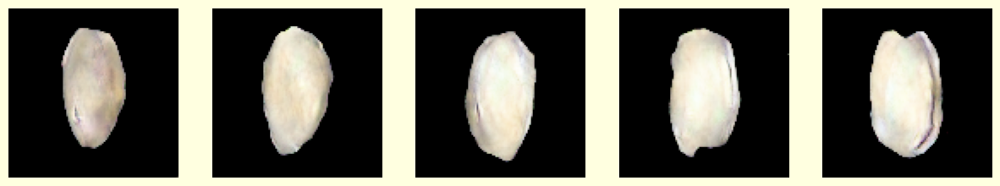

34/34 [==============================] - 11s 308ms/step - d_loss: 0.3793 - g_loss: 2.1002
Epoch 271/500
34/34 [==============================] - 10s 292ms/step - d_loss: 0.3670 - g_loss: 2.2199
Epoch 272/500
34/34 [==============================] - 10s 291ms/step - d_loss: 0.3743 - g_loss: 2.2046
Epoch 273/500
34/34 [==============================] - 10s 286ms/step - d_loss: 0.3832 - g_loss: 2.1887
Epoch 274/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3842 - g_loss: 2.2370
Epoch 275/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3721 - g_loss: 2.2783
Epoch 276/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3707 - g_loss: 2.2090
Epoch 277/500
34/34 [==============================] - 9s 258ms/step - d_loss: 0.3712 - g_loss: 2.2356
Epoch 278/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3734 - g_loss: 2.2592
Epoch 279/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.37

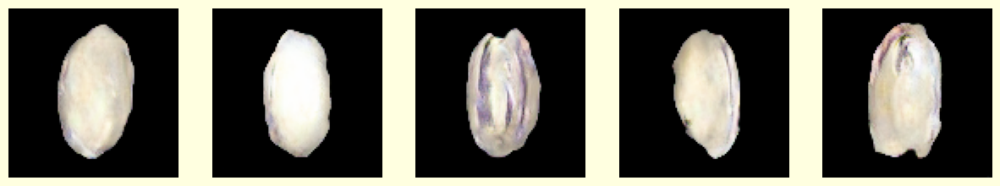

34/34 [==============================] - 9s 259ms/step - d_loss: 0.3744 - g_loss: 2.2104
Epoch 281/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3750 - g_loss: 2.2241
Epoch 282/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3759 - g_loss: 2.3020
Epoch 283/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3674 - g_loss: 2.2279
Epoch 284/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.3723 - g_loss: 2.2507
Epoch 285/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3758 - g_loss: 2.2597
Epoch 286/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3629 - g_loss: 2.2906
Epoch 287/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3558 - g_loss: 2.2365
Epoch 288/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3687 - g_loss: 2.3859
Epoch 289/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.3745 -

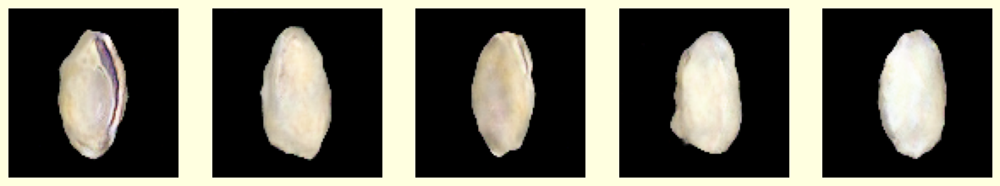

34/34 [==============================] - 9s 262ms/step - d_loss: 0.3698 - g_loss: 2.2733
Epoch 291/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3540 - g_loss: 2.2409
Epoch 292/500
34/34 [==============================] - 9s 258ms/step - d_loss: 0.3641 - g_loss: 2.2849
Epoch 293/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.3576 - g_loss: 2.3384
Epoch 294/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.3619 - g_loss: 2.2267
Epoch 295/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3741 - g_loss: 2.2438
Epoch 296/500
34/34 [==============================] - 9s 258ms/step - d_loss: 0.3589 - g_loss: 2.3169
Epoch 297/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.3563 - g_loss: 2.3033
Epoch 298/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.3566 - g_loss: 2.2967
Epoch 299/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3650 -

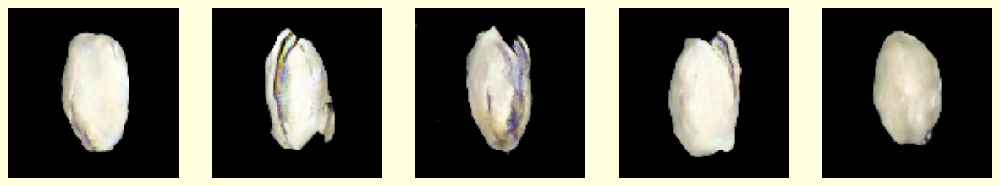


>>> Checkpoint disimpan di epoch 300:
    -> Generator: gan_training_run_modified\generator_weights_epoch_0300.h5
    -> Discriminator: gan_training_run_modified\discriminator_weights_epoch_0300.h5
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3678 - g_loss: 2.2097
Epoch 301/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3656 - g_loss: 2.2224
Epoch 302/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3564 - g_loss: 2.3054
Epoch 303/500
34/34 [==============================] - 9s 257ms/step - d_loss: 0.3546 - g_loss: 2.4030
Epoch 304/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3574 - g_loss: 2.2413
Epoch 305/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.3519 - g_loss: 2.4345
Epoch 306/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3571 - g_loss: 2.3691
Epoch 307/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.3714 - g_loss

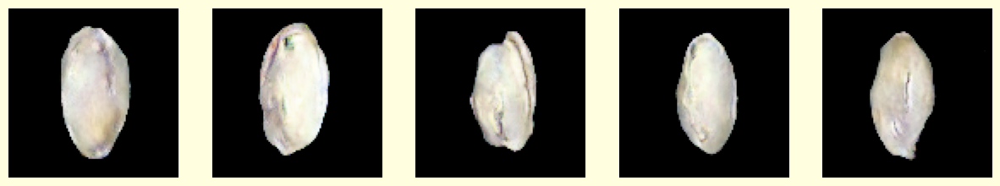

34/34 [==============================] - 9s 262ms/step - d_loss: 0.3629 - g_loss: 2.2820
Epoch 311/500
34/34 [==============================] - 9s 255ms/step - d_loss: 0.3641 - g_loss: 2.3046
Epoch 312/500
34/34 [==============================] - 9s 256ms/step - d_loss: 0.3417 - g_loss: 2.3299
Epoch 313/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3520 - g_loss: 2.3704
Epoch 314/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3603 - g_loss: 2.3541
Epoch 315/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3589 - g_loss: 2.2629
Epoch 316/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3561 - g_loss: 2.4077
Epoch 317/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.3568 - g_loss: 2.3770
Epoch 318/500
34/34 [==============================] - 9s 266ms/step - d_loss: 0.3560 - g_loss: 2.3905
Epoch 319/500
34/34 [==============================] - 9s 268ms/step - d_loss: 0.3562 -

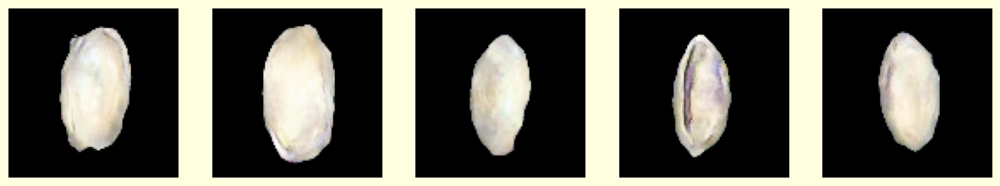

34/34 [==============================] - 9s 274ms/step - d_loss: 0.3519 - g_loss: 2.3947
Epoch 321/500
34/34 [==============================] - 9s 266ms/step - d_loss: 0.3533 - g_loss: 2.4058
Epoch 322/500
34/34 [==============================] - 9s 268ms/step - d_loss: 0.3471 - g_loss: 2.4104
Epoch 323/500
34/34 [==============================] - 9s 267ms/step - d_loss: 0.3525 - g_loss: 2.4221
Epoch 324/500
34/34 [==============================] - 9s 266ms/step - d_loss: 0.3561 - g_loss: 2.3924
Epoch 325/500
34/34 [==============================] - 9s 269ms/step - d_loss: 0.3563 - g_loss: 2.4307
Epoch 326/500
34/34 [==============================] - 9s 268ms/step - d_loss: 0.3486 - g_loss: 2.4274
Epoch 327/500
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3566 - g_loss: 2.4153
Epoch 328/500
34/34 [==============================] - 9s 266ms/step - d_loss: 0.3567 - g_loss: 2.4796
Epoch 329/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.3515 -

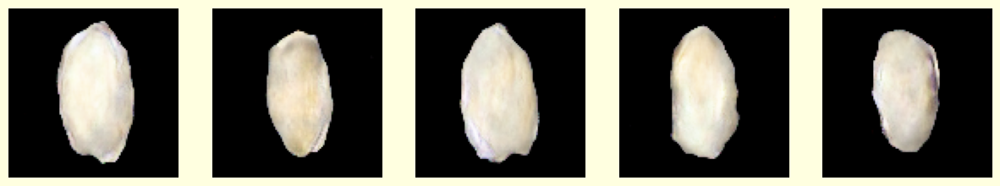

34/34 [==============================] - 9s 271ms/step - d_loss: 0.3516 - g_loss: 2.4408
Epoch 331/500
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3555 - g_loss: 2.4504
Epoch 332/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.3555 - g_loss: 2.3430
Epoch 333/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.3454 - g_loss: 2.4825
Epoch 334/500
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3526 - g_loss: 2.3848
Epoch 335/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.3401 - g_loss: 2.5669
Epoch 336/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.3549 - g_loss: 2.5288
Epoch 337/500
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3505 - g_loss: 2.3475
Epoch 338/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.3542 - g_loss: 2.4004
Epoch 339/500
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3524 -

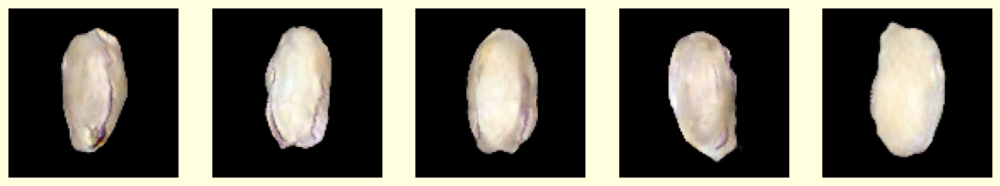

34/34 [==============================] - 9s 269ms/step - d_loss: 0.3590 - g_loss: 2.4839
Epoch 341/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3475 - g_loss: 2.4960
Epoch 342/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.3461 - g_loss: 2.4365
Epoch 343/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.3412 - g_loss: 2.4231
Epoch 344/500
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3387 - g_loss: 2.5043
Epoch 345/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.3400 - g_loss: 2.4379
Epoch 346/500
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3492 - g_loss: 2.5165
Epoch 347/500
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3468 - g_loss: 2.4624
Epoch 348/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3417 - g_loss: 2.4973
Epoch 349/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3489 -

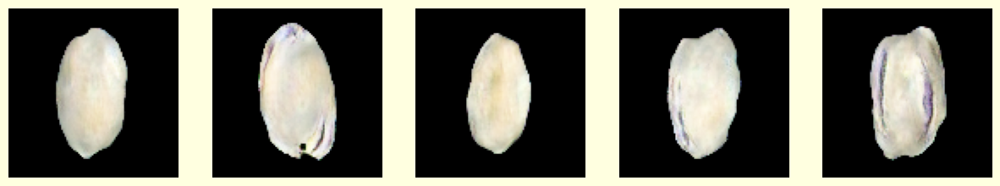


>>> Checkpoint disimpan di epoch 350:
    -> Generator: gan_training_run_modified\generator_weights_epoch_0350.h5
    -> Discriminator: gan_training_run_modified\discriminator_weights_epoch_0350.h5
34/34 [==============================] - 9s 267ms/step - d_loss: 0.3477 - g_loss: 2.5265
Epoch 351/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3478 - g_loss: 2.3958
Epoch 352/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3476 - g_loss: 2.4802
Epoch 353/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3369 - g_loss: 2.5184
Epoch 354/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3467 - g_loss: 2.5610
Epoch 355/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.3346 - g_loss: 2.4707
Epoch 356/500
34/34 [==============================] - 10s 289ms/step - d_loss: 0.3452 - g_loss: 2.5264
Epoch 357/500
34/34 [==============================] - 9s 269ms/step - d_loss: 0.3487 - g_los

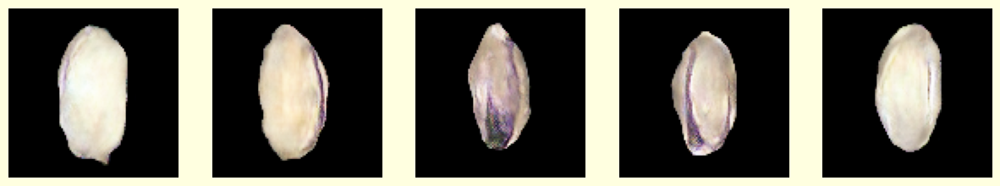

34/34 [==============================] - 9s 271ms/step - d_loss: 0.3417 - g_loss: 2.6252
Epoch 361/500
34/34 [==============================] - 9s 277ms/step - d_loss: 0.3438 - g_loss: 2.5302
Epoch 362/500
34/34 [==============================] - 9s 278ms/step - d_loss: 0.3364 - g_loss: 2.4950
Epoch 363/500
34/34 [==============================] - 10s 288ms/step - d_loss: 0.3432 - g_loss: 2.5324
Epoch 364/500
34/34 [==============================] - 10s 289ms/step - d_loss: 0.3370 - g_loss: 2.4955
Epoch 365/500
34/34 [==============================] - 10s 288ms/step - d_loss: 0.3361 - g_loss: 2.5426
Epoch 366/500
34/34 [==============================] - 10s 280ms/step - d_loss: 0.3396 - g_loss: 2.4942
Epoch 367/500
34/34 [==============================] - 9s 276ms/step - d_loss: 0.3323 - g_loss: 2.6030
Epoch 368/500
34/34 [==============================] - 10s 280ms/step - d_loss: 0.3342 - g_loss: 2.5472
Epoch 369/500
34/34 [==============================] - 9s 267ms/step - d_loss: 0.3

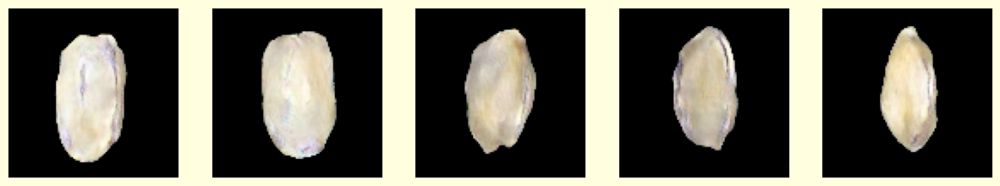

34/34 [==============================] - 9s 266ms/step - d_loss: 0.3272 - g_loss: 2.4704
Epoch 371/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3326 - g_loss: 2.4940
Epoch 372/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3313 - g_loss: 2.5715
Epoch 373/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3345 - g_loss: 2.5726
Epoch 374/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3350 - g_loss: 2.5758
Epoch 375/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3400 - g_loss: 2.5844
Epoch 376/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3349 - g_loss: 2.5264
Epoch 377/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3329 - g_loss: 2.5183
Epoch 378/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3347 - g_loss: 2.5987
Epoch 379/500
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3398 -

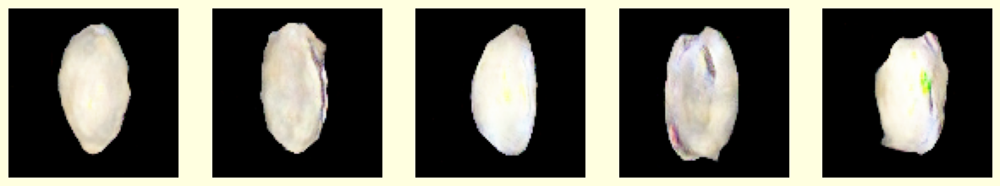

34/34 [==============================] - 9s 269ms/step - d_loss: 0.3334 - g_loss: 2.5189
Epoch 381/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3360 - g_loss: 2.5857
Epoch 382/500
34/34 [==============================] - 10s 287ms/step - d_loss: 0.3318 - g_loss: 2.6195
Epoch 383/500
34/34 [==============================] - 10s 299ms/step - d_loss: 0.3370 - g_loss: 2.5481
Epoch 384/500
34/34 [==============================] - 10s 287ms/step - d_loss: 0.3349 - g_loss: 2.5148
Epoch 385/500
34/34 [==============================] - 10s 278ms/step - d_loss: 0.3319 - g_loss: 2.5672
Epoch 386/500
34/34 [==============================] - 10s 278ms/step - d_loss: 0.3338 - g_loss: 2.5577
Epoch 387/500
34/34 [==============================] - 10s 287ms/step - d_loss: 0.3282 - g_loss: 2.6201
Epoch 388/500
34/34 [==============================] - 9s 275ms/step - d_loss: 0.3272 - g_loss: 2.6679
Epoch 389/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.

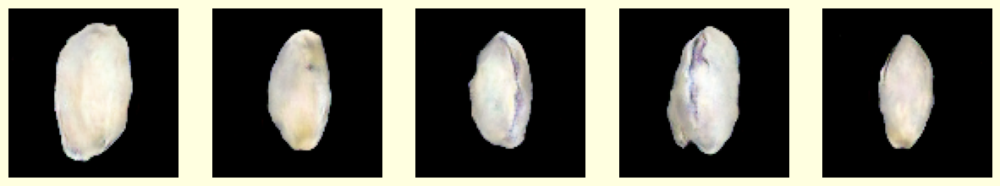

34/34 [==============================] - 9s 267ms/step - d_loss: 0.3257 - g_loss: 2.5814
Epoch 391/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3262 - g_loss: 2.6048
Epoch 392/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3216 - g_loss: 2.6715
Epoch 393/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3363 - g_loss: 2.6133
Epoch 394/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3319 - g_loss: 2.6287
Epoch 395/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3330 - g_loss: 2.5986
Epoch 396/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.3364 - g_loss: 2.6186
Epoch 397/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3293 - g_loss: 2.7013
Epoch 398/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3303 - g_loss: 2.6466
Epoch 399/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3388 -

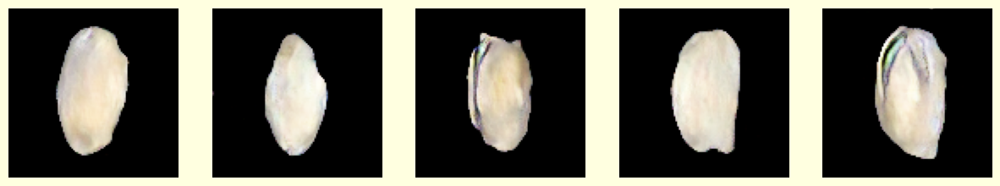


>>> Checkpoint disimpan di epoch 400:
    -> Generator: gan_training_run_modified\generator_weights_epoch_0400.h5
    -> Discriminator: gan_training_run_modified\discriminator_weights_epoch_0400.h5
34/34 [==============================] - 9s 270ms/step - d_loss: 0.3359 - g_loss: 2.7166
Epoch 401/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3248 - g_loss: 2.6677
Epoch 402/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3201 - g_loss: 2.6561
Epoch 403/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3203 - g_loss: 2.6211
Epoch 404/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.3310 - g_loss: 2.6435
Epoch 405/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3257 - g_loss: 2.7267
Epoch 406/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3207 - g_loss: 2.5968
Epoch 407/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3252 - g_loss

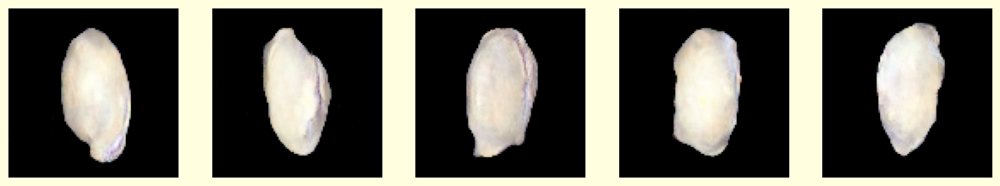

34/34 [==============================] - 11s 318ms/step - d_loss: 0.3264 - g_loss: 2.7629
Epoch 411/500
34/34 [==============================] - 10s 285ms/step - d_loss: 0.3252 - g_loss: 2.6875
Epoch 412/500
34/34 [==============================] - 10s 285ms/step - d_loss: 0.3302 - g_loss: 2.6377
Epoch 413/500
34/34 [==============================] - 10s 285ms/step - d_loss: 0.3196 - g_loss: 2.5985
Epoch 414/500
34/34 [==============================] - 10s 286ms/step - d_loss: 0.3229 - g_loss: 2.7470
Epoch 415/500
34/34 [==============================] - 10s 284ms/step - d_loss: 0.3295 - g_loss: 2.6642
Epoch 416/500
34/34 [==============================] - 10s 285ms/step - d_loss: 0.3122 - g_loss: 2.6011
Epoch 417/500
34/34 [==============================] - 10s 281ms/step - d_loss: 0.3221 - g_loss: 2.7055
Epoch 418/500
34/34 [==============================] - 10s 284ms/step - d_loss: 0.3322 - g_loss: 2.7170
Epoch 419/500
34/34 [==============================] - 10s 284ms/step - d_loss

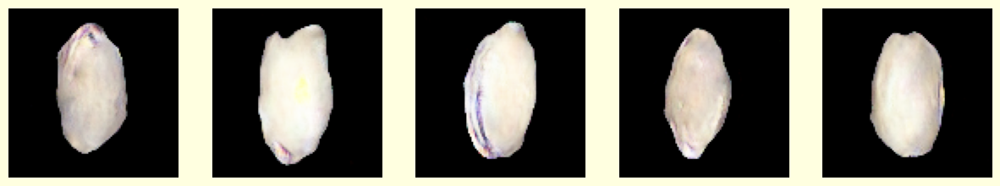

34/34 [==============================] - 9s 266ms/step - d_loss: 0.3110 - g_loss: 2.7588
Epoch 421/500
34/34 [==============================] - 9s 270ms/step - d_loss: 0.3310 - g_loss: 2.8081
Epoch 422/500
34/34 [==============================] - 10s 288ms/step - d_loss: 0.3291 - g_loss: 2.5662
Epoch 423/500
34/34 [==============================] - 10s 285ms/step - d_loss: 0.3255 - g_loss: 2.7428
Epoch 424/500
34/34 [==============================] - 10s 287ms/step - d_loss: 0.3182 - g_loss: 2.7159
Epoch 425/500
34/34 [==============================] - 10s 290ms/step - d_loss: 0.3240 - g_loss: 2.6980
Epoch 426/500
34/34 [==============================] - 9s 278ms/step - d_loss: 0.3262 - g_loss: 2.6775
Epoch 427/500
34/34 [==============================] - 9s 273ms/step - d_loss: 0.3245 - g_loss: 2.7558
Epoch 428/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.3069 - g_loss: 2.7673
Epoch 429/500
34/34 [==============================] - 9s 268ms/step - d_loss: 0.31

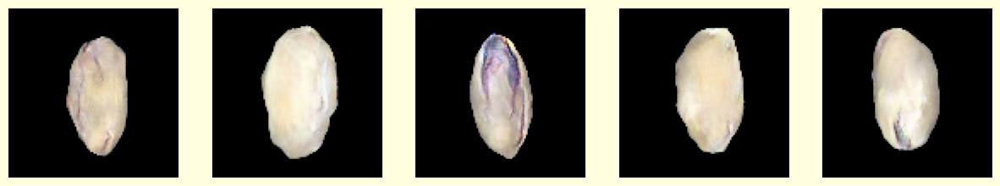

34/34 [==============================] - 9s 277ms/step - d_loss: 0.3345 - g_loss: 2.7393
Epoch 431/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.3157 - g_loss: 2.6912
Epoch 432/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.3193 - g_loss: 2.8158
Epoch 433/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3120 - g_loss: 2.7234
Epoch 434/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3198 - g_loss: 2.8271
Epoch 435/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3252 - g_loss: 2.6763
Epoch 436/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3128 - g_loss: 2.7098
Epoch 437/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3222 - g_loss: 2.7248
Epoch 438/500
34/34 [==============================] - 10s 279ms/step - d_loss: 0.3115 - g_loss: 2.8468
Epoch 439/500
34/34 [==============================] - 10s 294ms/step - d_loss: 0.3209

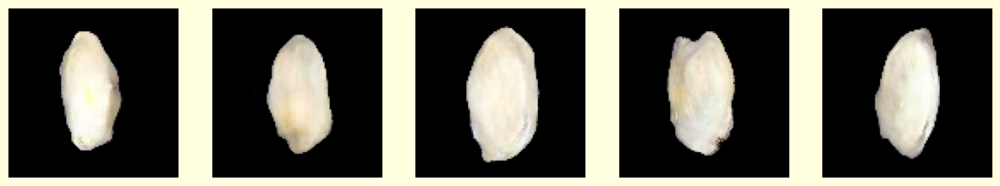

34/34 [==============================] - 11s 323ms/step - d_loss: 0.3131 - g_loss: 2.8321
Epoch 441/500
34/34 [==============================] - 10s 302ms/step - d_loss: 0.3114 - g_loss: 2.8773
Epoch 442/500
34/34 [==============================] - 10s 301ms/step - d_loss: 0.3221 - g_loss: 2.7561
Epoch 443/500
34/34 [==============================] - 10s 300ms/step - d_loss: 0.3206 - g_loss: 2.6804
Epoch 444/500
34/34 [==============================] - 10s 292ms/step - d_loss: 0.3189 - g_loss: 2.7807
Epoch 445/500
34/34 [==============================] - 10s 297ms/step - d_loss: 0.3189 - g_loss: 2.7663
Epoch 446/500
34/34 [==============================] - 10s 299ms/step - d_loss: 0.3173 - g_loss: 2.8031
Epoch 447/500
34/34 [==============================] - 10s 298ms/step - d_loss: 0.3115 - g_loss: 2.7267
Epoch 448/500
34/34 [==============================] - 10s 293ms/step - d_loss: 0.3096 - g_loss: 2.7607
Epoch 449/500
34/34 [==============================] - 10s 291ms/step - d_loss

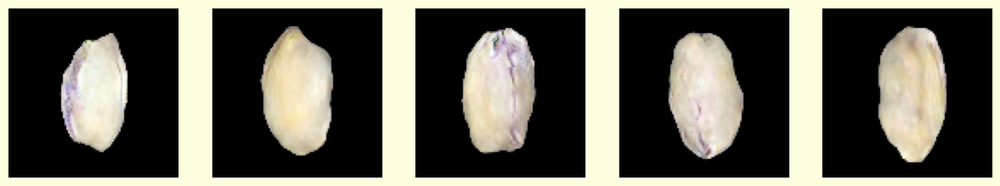


>>> Checkpoint disimpan di epoch 450:
    -> Generator: gan_training_run_modified\generator_weights_epoch_0450.h5
    -> Discriminator: gan_training_run_modified\discriminator_weights_epoch_0450.h5
34/34 [==============================] - 10s 307ms/step - d_loss: 0.3088 - g_loss: 2.7485
Epoch 451/500
34/34 [==============================] - 10s 282ms/step - d_loss: 0.3186 - g_loss: 2.8082
Epoch 452/500
34/34 [==============================] - 10s 288ms/step - d_loss: 0.3067 - g_loss: 2.7808
Epoch 453/500
34/34 [==============================] - 10s 287ms/step - d_loss: 0.3211 - g_loss: 2.7806
Epoch 454/500
34/34 [==============================] - 9s 270ms/step - d_loss: 0.3192 - g_loss: 2.7623
Epoch 455/500
34/34 [==============================] - 9s 267ms/step - d_loss: 0.3105 - g_loss: 2.7864
Epoch 456/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.3192 - g_loss: 2.7838
Epoch 457/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3197 - g_

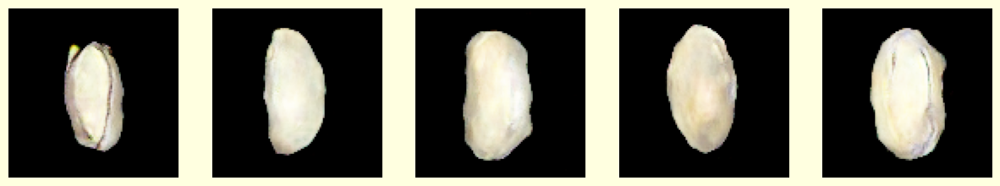

34/34 [==============================] - 9s 264ms/step - d_loss: 0.3108 - g_loss: 2.8215
Epoch 461/500
34/34 [==============================] - 9s 258ms/step - d_loss: 0.3132 - g_loss: 2.8265
Epoch 462/500
34/34 [==============================] - 9s 263ms/step - d_loss: 0.3148 - g_loss: 2.7679
Epoch 463/500
34/34 [==============================] - 9s 264ms/step - d_loss: 0.3080 - g_loss: 2.8683
Epoch 464/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3077 - g_loss: 2.7485
Epoch 465/500
34/34 [==============================] - 9s 258ms/step - d_loss: 0.3127 - g_loss: 2.8744
Epoch 466/500
34/34 [==============================] - 9s 262ms/step - d_loss: 0.3096 - g_loss: 2.8220
Epoch 467/500
34/34 [==============================] - 9s 271ms/step - d_loss: 0.3197 - g_loss: 2.7701
Epoch 468/500
34/34 [==============================] - 10s 294ms/step - d_loss: 0.3078 - g_loss: 2.7700
Epoch 469/500
34/34 [==============================] - 10s 293ms/step - d_loss: 0.3002

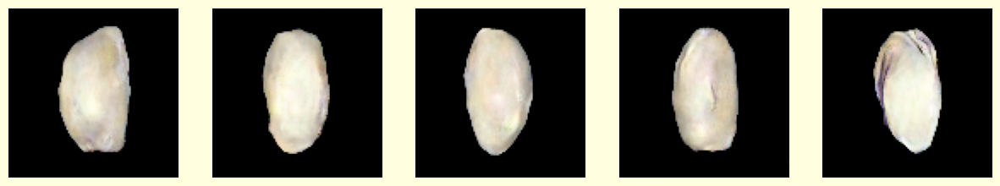

34/34 [==============================] - 11s 309ms/step - d_loss: 0.3119 - g_loss: 2.8330
Epoch 471/500
34/34 [==============================] - 10s 293ms/step - d_loss: 0.3116 - g_loss: 2.8466
Epoch 472/500
34/34 [==============================] - 10s 285ms/step - d_loss: 0.3148 - g_loss: 2.8148
Epoch 473/500
34/34 [==============================] - 10s 292ms/step - d_loss: 0.3112 - g_loss: 2.8410
Epoch 474/500
34/34 [==============================] - 10s 290ms/step - d_loss: 0.3177 - g_loss: 2.9084
Epoch 475/500
34/34 [==============================] - 9s 273ms/step - d_loss: 0.3157 - g_loss: 2.9312
Epoch 476/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3119 - g_loss: 2.7853
Epoch 477/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3140 - g_loss: 2.9160
Epoch 478/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3134 - g_loss: 2.8497
Epoch 479/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3

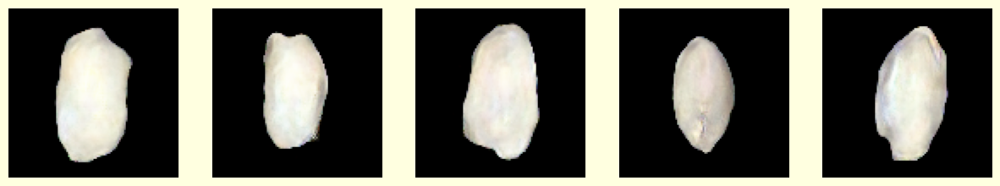

34/34 [==============================] - 9s 265ms/step - d_loss: 0.3119 - g_loss: 2.7793
Epoch 481/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3077 - g_loss: 2.8480
Epoch 482/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3087 - g_loss: 2.9196
Epoch 483/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3036 - g_loss: 2.8312
Epoch 484/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3075 - g_loss: 2.8453
Epoch 485/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3062 - g_loss: 2.9137
Epoch 486/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3059 - g_loss: 2.7440
Epoch 487/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3150 - g_loss: 2.8436
Epoch 488/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3074 - g_loss: 2.9264
Epoch 489/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3003 -

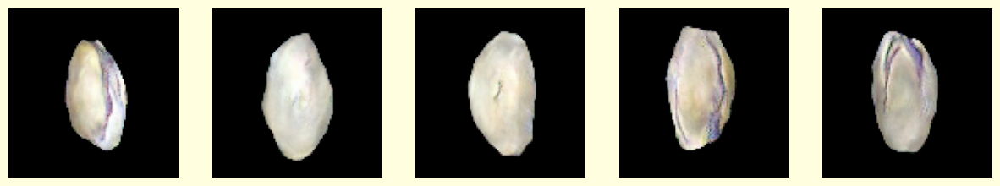

34/34 [==============================] - 9s 273ms/step - d_loss: 0.3097 - g_loss: 2.8512
Epoch 491/500
34/34 [==============================] - 9s 265ms/step - d_loss: 0.2983 - g_loss: 2.8832
Epoch 492/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3066 - g_loss: 2.8649
Epoch 493/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3040 - g_loss: 2.9171
Epoch 494/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3123 - g_loss: 2.8479
Epoch 495/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3163 - g_loss: 2.8678
Epoch 496/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.2906 - g_loss: 2.9616
Epoch 497/500
34/34 [==============================] - 9s 260ms/step - d_loss: 0.3039 - g_loss: 2.9091
Epoch 498/500
34/34 [==============================] - 9s 259ms/step - d_loss: 0.3013 - g_loss: 3.0030
Epoch 499/500
34/34 [==============================] - 9s 261ms/step - d_loss: 0.3008 -

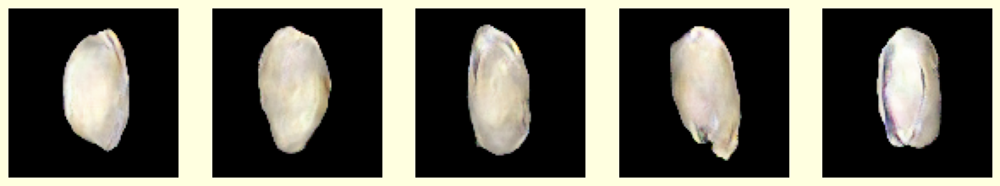


>>> Checkpoint disimpan di epoch 500:
    -> Generator: gan_training_run_modified\generator_weights_epoch_0500.h5
    -> Discriminator: gan_training_run_modified\discriminator_weights_epoch_0500.h5
34/34 [==============================] - 9s 268ms/step - d_loss: 0.2995 - g_loss: 2.8719


In [22]:
EPOCHS = 500
monitor = GANMonitor(num_img=5, latent_dim=LATENT_DIM)
history = gan.fit(
    data,
    epochs=EPOCHS,
    callbacks=[monitor]
)

### Loss Plot

In this plot we can see the battle of generator vs discriminator. The Higher the Loss, meaning that the part lose.

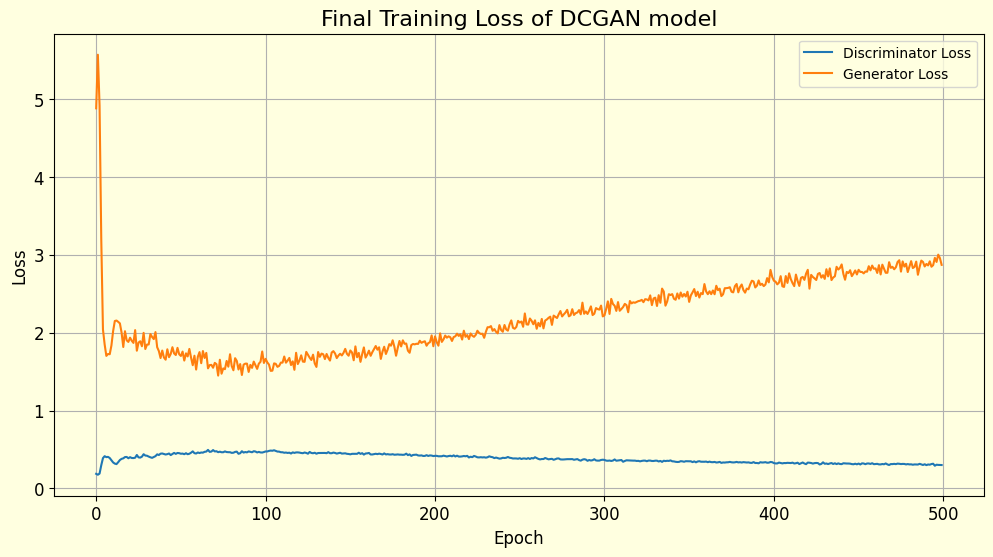

In [74]:
d_loss = history.history['d_loss']
g_loss = history.history['g_loss']
epochs_range = range(len(d_loss))

plt.figure(figsize=(12, 6))
plt.plot(epochs_range, d_loss, label='Discriminator Loss')
plt.plot(epochs_range, g_loss, label='Generator Loss')
plt.title('Final Training Loss of DCGAN model', fontsize=16)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.grid(True)
plt.savefig("final_loss_plot.png")
plt.show()

We can see here that the generator is constantly losing. It demonstrates a clear sign of divergence on the training for both of the instances. Discriminator loss quickly converge to 0 really indicate that discriminator is overpowering the generator at all time. This led to a vanishing gradient problem for the Generator, starving it of the necessary feedback to improve. This continues until the epoch of 500, gap is widening showing the difference of skill gap even after making the learning rate of the generator to be bigger than the discriminator. This inherent instability will become the reason of why I choose to make the next model, which oftenly designed to tackle this problem of DCGAN.

### Data Generation example

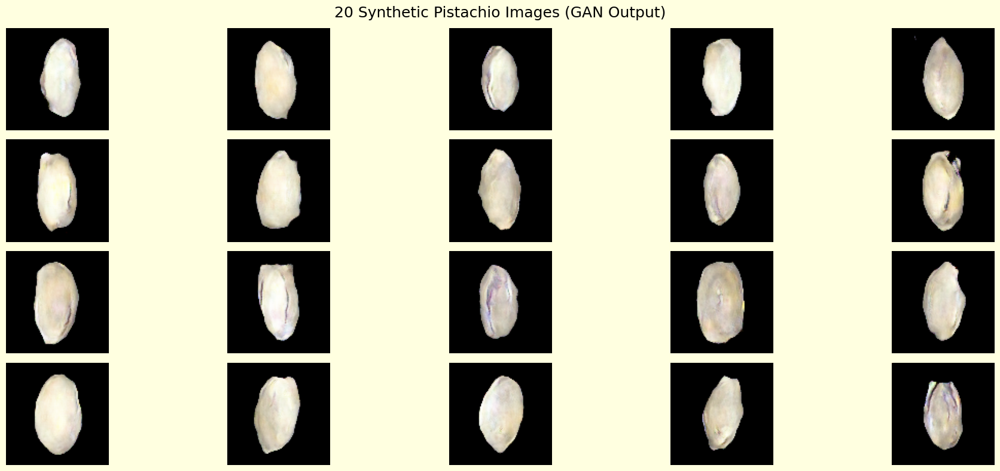

In [73]:
# Load the saved weights for generator and discriminator
generator_weights_path = "gan_training_run_modified/generator_weights_epoch_0500.h5"
discriminator_weights_path = "gan_training_run_modified/discriminator_weights_epoch_0500.h5"

generator.load_weights(generator_weights_path)
discriminator.load_weights(discriminator_weights_path)

# Generate 20 new images using the trained generator
num_images = 20
random_latent_vectors = tf.random.normal(shape=(num_images, LATENT_DIM))
generated_images = generator(random_latent_vectors, training=False)
generated_images = (generated_images + 1) / 2.0  # Rescale from [-1,1] to [0,1] if using tanh

# Plot the generated images
plt.figure(figsize=(20, 8))
for i in range(num_images):
    plt.subplot(4, 5, i + 1)
    img = tf.keras.preprocessing.image.array_to_img(generated_images[i])
    plt.imshow(img)
    plt.axis('off')
plt.suptitle("20 Synthetic Pistachio Images (GAN Output)", fontsize=18)
plt.tight_layout()
plt.show()

From the sample of generated images we can see that our generator is already able to get the global features of the pistachio. It's already able to generate the oval-ly shape of the pistachios. While the model haven't been able to genereta the details of the images like when the nut cracked and show it's inside. It still shows that the model is able to create the image quite nice with the global big features.

## B. Modification : WGAN-GP (Wasserstein GAN with Gradient Penalty)
---

###  Building the model

In [18]:
LATENT_DIM = 128

#### Generator

1. Like the first model, the WCGAN generator is started with fully connected layerthat projects the latent vector into a high dimensional space. However this model makes it into 25x25x128 instead of 28x28x64
2. Padding is "same" to ensure that the height and width are preserved after each convolution. This also eliminates cropping.
3. Upsampling is done to learn, about the image more.
4. Direct output is enabled here because of the "same" padding, it doesnt need any more method.

In [11]:
def _gen_block(x, filters):
    x = Conv2D(filters, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Conv2D(filters, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    return x

def build_generator_wgan():
    noise_input = Input(shape=(LATENT_DIM,))
    x = Dense(25 * 25 * 128, use_bias=False)(noise_input)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Reshape((25, 25, 128))(x)

    # 25 -> 50
    x = UpSampling2D()(x)
    x = _gen_block(x, 64)

    # 50-> 100
    x = UpSampling2D()(x)
    x = _gen_block(x, 32)

    out = Conv2D(CHANNELS, 3, padding='same', activation='tanh')(x)  # [-1, 1]
    return Model(noise_input, out, name="generator")

#### Critic

In our modified WGAN-GP model, the "Discriminator" is replaced by a "Critic". While they share a similar goal of assessing the realism of an image, their function and architecture are fundamentally different. This change is the core reason why WGANs are more stable than standard DCGANs.

1. The main difference is critic will produce a score while discriminator will produce prediction either the image is fake or real. Critic is using linear activation on the end and not sigmoid like discriminator. Critic's job is not to classify, but to score the image generated by the generator. A score representing "how real" an image is. This score can be any real number (e.g., -50, 10, 100). A higher score means the Critic thinks the image is more realistic. 

2. Deeper and Wider aren also used here making it more superior, and LeakyReLu also used to prevents dying neurons

In [20]:
def build_critic():
    image_input = Input(shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS))
    x = Conv2D(64, 4, strides=2, padding='same')(image_input)
    x = LeakyReLU()(x)
    x = Conv2D(128, 4, strides=2, padding='same')(x)
    x = LeakyReLU()(x)
    x = Conv2D(256, 4, strides=2, padding='same')(x)
    x = LeakyReLU()(x)
    x = Conv2D(512, 4, strides=2, padding='same')(x)
    x = LeakyReLU()(x)
    x = Flatten()(x)
    x = Dense(1)(x)  # No sigmoid
    return Model(image_input, x, name="critic")

#### Gradient Penalty

The main job of this function is to prevent the Critic from becoming "too sharp" or "too spiky" in its judgments. A smooth Critic provides a much better learning signal for the Generator. This function enforces that smoothness by calculating a "penalty" if the Critic's judgments change too rapidly.

1. The function will create an inbetween images by blending the real images and the fake images. This will be used to check the Critic behavior. This function will picks a random alpha to determine how many fake images want to be blended in the real_images.

2. GradientTape will be used to see how the critic is behave towards the interpolated image

3. Then the gradient will be calculated and count the steepness. 

4. Then it will return `tf.reduce_mean((norm - 1.0) ** 2)` to stabilize the critic, because the number will be added to the critic later <br>
Example : 
- `(norm - 1.0)` --> 1.0 is the ideal steepness of the critic.<br>
if norm is different from 1 --> then it will be substracted from 1 and squared > Example of norm 1.2 > 1.2 - 1 = 0.2 > 0.04 (squared), for all images in the step
- `tf.reduce_mean` = will return the mean of all norm-squared function

In [21]:
def gradient_penalty(batch_size, real_images, fake_images, critic):
    alpha = tf.random.uniform([batch_size, 1, 1, 1], 0.0, 1.0)
    interpolated = real_images + alpha * (fake_images - real_images)
    with tf.GradientTape() as gp_tape:
        gp_tape.watch(interpolated)
        pred = critic(interpolated, training=True)
    grads = gp_tape.gradient(pred, interpolated)
    norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1,2,3]) + 1e-12)
    return tf.reduce_mean((norm - 1.0) ** 2)

#### Custom Loss

The custom loss will be more powerfull than DCGAN loss.
1. Generator --> `tf.reduce_mean(fake_score)` calculates the average score for all the fake images in the batch. By this we are telling the optimizer to change the generator weights to make this number as small as possible and this force generator to make highest positive score as possible

In [22]:
def generator_loss(fake_score):
    return -tf.reduce_mean(fake_score)

def critic_loss(real_score, fake_score, gradient_penalty, gp_weight=10.0):
    wasserstein = tf.reduce_mean(fake_score) - tf.reduce_mean(real_score)
    return wasserstein + gp_weight * gradient_penalty

#### Build Model Class

The WGAN_GP class fundamentally redesigns the training loop to implement the Wasserstein GAN with Gradient Penalty methodology. While it inherits from `tf.keras.Model `like the baseline GAN class, its internal logic, especially within the train_step, is significantly different.

1. Initialization of init and compilation of compile 
- `critic_steps` --> New variable is introduced, this dictates how many time the critic is trained everytime the generator is trained. This imbalance is intentional and needed to ensure that the critic remain as a teacher for the generator
- For the `compile` method, now the model is no longer use a loss from outside like DCGAN that uses `BinaryCrossEntropy`. The WGAN use model using the Loss from `generator_loss` and `critic_loss` declared before.

2. The core of the `train_step` is also changed.
- Phase A : Critic Training <br>
> 1. The critic will be trained 5 times, to ensure that the critic will be reliable as a teacher for the generator
> 2. Calculating loss will be based on score not based on prediction like DCGAN. <br>
a. It will assigns score between the real and the fake images<br>
b. Then it will calculate the gradient penalty to ensure that its smooth <br>
c. The final `c_loss` is calculated using the function `critic_loss` which purpose is to maximize the distance of average real and fake scores while being punished by gradient penalty


- Phase B : Generator Training
> 1. Its purpose is to maximize the score given by the critic
> 2. How it do it <br>
a. The generator will create a batch of fake images <br>
b. These pics will be given to critic to get a score :D<br>
c. The `g_loss` then will be updated using the custom `generator_loss`

In [23]:
class WGAN_GP(tf.keras.Model):
    def __init__(self, critic, generator, latent_dim, critic_steps=5, use_ema=True, ema_decay=0.999):
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.critic_steps = critic_steps

        self.use_ema = use_ema
        self.ema_decay = ema_decay
        if self.use_ema:
            self.generator_ema = clone_model(self.generator)
            _ = self.generator(tf.zeros([1, self.latent_dim]))
            _ = self.generator_ema(tf.zeros([1, self.latent_dim]))
            self.generator_ema.set_weights(self.generator.get_weights())

    def compile(self, c_optimizer, g_optimizer):
        super().compile()
        self.c_optimizer = c_optimizer
        self.g_optimizer = g_optimizer
        self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")
        self.c_loss_metric = tf.keras.metrics.Mean(name="c_loss")

    @property
    def metrics(self):
        return [self.g_loss_metric, self.c_loss_metric]

    def _update_ema(self):
        for ew, w in zip(self.generator_ema.trainable_variables, self.generator.trainable_variables):
            ew.assign(self.ema_decay * ew + (1.0 - self.ema_decay) * w)
        for ew, w in zip(self.generator_ema.non_trainable_variables, self.generator.non_trainable_variables):
            ew.assign(w)

    def sample(self, z, training=False):
        g = self.generator_ema if (self.use_ema and hasattr(self, "generator_ema")) else self.generator
        return g(z, training=training)

    def train_step(self, real_images):
        if isinstance(real_images, (tuple, list)):
            real_images = real_images[0]
        batch_size = tf.shape(real_images)[0]

        # --- Critic ---
        c_losses = []
        for _ in range(self.critic_steps):
            z = tf.random.normal([batch_size, self.latent_dim])
            with tf.GradientTape() as tape:
                fake_images = self.generator(z, training=True)
                real_score = self.critic(real_images, training=True)
                fake_score = self.critic(fake_images, training=True)
                gp = gradient_penalty(batch_size, real_images, fake_images, self.critic)
                c_loss = critic_loss(real_score, fake_score, gp)
            grads = tape.gradient(c_loss, self.critic.trainable_variables)
            self.c_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))
            c_losses.append(c_loss)
        c_loss = tf.reduce_mean(c_losses)

        # --- Generator ---
        z = tf.random.normal([batch_size, self.latent_dim])
        with tf.GradientTape() as tape:
            gen_score = self.critic(self.generator(z, training=True), training=True)
            g_loss = generator_loss(gen_score)
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        # --- EMA update (after gen step) ---
        if self.use_ema:
            self._update_ema()

        self.g_loss_metric.update_state(tf.cast(g_loss, tf.float32))
        self.c_loss_metric.update_state(tf.cast(c_loss, tf.float32))
        return {"g_loss": self.g_loss_metric.result(), "c_loss": self.c_loss_metric.result()}

#### WGAN monitor

The WGANmonitor however doesnt really change compared to the last model. It saves the picture, plot it. And also save models per N epochs.

In [24]:
class WGANMonitor(tf.keras.callbacks.Callback):
    def __init__(self, num_img=5, latent_dim=128, output_dir="wgan_output_porto", image_freq=10, save_freq=50):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.output_dir = output_dir
        self.image_freq = image_freq
        self.save_freq = save_freq
        self.seed = tf.random.normal([self.num_img, self.latent_dim])

        os.makedirs(self.output_dir, exist_ok=True)

    def on_epoch_end(self, epoch, logs=None):
    # 1. Membuat dan menyimpan gambar
        if (epoch + 1) % self.image_freq == 0:
            print(f"\n--- Membuat gambar di epoch {epoch + 1} ---")
            generated_images = self.model.generator(self.seed, training=False)
            generated_images = (generated_images + 1) / 2.0  # [-1,1] -> [0,1]

            fig, axes = plt.subplots(1, self.num_img, figsize=(15, 15))
            for i in range(self.num_img):
                img = tf.keras.preprocessing.image.array_to_img(generated_images[i])
                axes[i].imshow(img)
                axes[i].axis('off')

            # ✅ Ensure folder exists before saving
            os.makedirs(self.output_dir, exist_ok=True)
            plt.savefig(os.path.join(self.output_dir, f"generated_{epoch+1:04d}.png"))
            plt.show()
            plt.close()

        # 2. Menyimpan bobot model (checkpoint)
        if (epoch + 1) % self.save_freq == 0:
            os.makedirs(self.output_dir, exist_ok=True)
            gen_path = os.path.join(self.output_dir, f"generator_epoch_{epoch+1}.h5")
            critic_path = os.path.join(self.output_dir, f"critic_epoch_{epoch+1}.h5")

            self.model.generator.save_weights(gen_path)
            self.model.critic.save_weights(critic_path)

            print(f"\n>>> Checkpoint disimpan di epoch {epoch+1}:")
            print(f"    -> Generator: {gen_path}")
            print(f"    -> Critic: {critic_path}")


Then we can see here that the model is build with a 5 critic steps and no need for more loss declaration, because the loss is already in the object of WGAN_GP

In [25]:
generator_wgan = build_generator_wgan()
critic_wgan = build_critic()

wgan = WGAN_GP(generator=generator_wgan, critic=critic_wgan, latent_dim=LATENT_DIM, critic_steps=5, use_ema=True, ema_decay=0.999)

wgan.compile(
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=8e-5, beta_1=0.0, beta_2=0.9),
    c_optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.0, beta_2=0.9)
)

#### Compile

In [26]:
print("--- Generator ---")
generator_wgan.summary()
print("\n--- Critic ---")
critic_wgan.summary()

--- Generator ---
Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128)]             0         
                                                                 
 dense (Dense)               (None, 80000)             10240000  
                                                                 
 batch_normalization (BatchN  (None, 80000)            320000    
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 80000)             0         
                                                                 
 reshape (Reshape)           (None, 25, 25, 128)       0         
                                                                 
 up_sampling2d (UpSampling2D  (None, 50, 50, 128)      0         
 )                                     

### Training

Epoch 1/500
34/34 [==============================] - 23s 464ms/step - g_loss: 102.1937 - c_loss: -579.9574
Epoch 2/500
34/34 [==============================] - 15s 435ms/step - g_loss: -126.2622 - c_loss: -327.5301
Epoch 3/500
34/34 [==============================] - 15s 435ms/step - g_loss: -226.8201 - c_loss: -141.8285
Epoch 4/500
34/34 [==============================] - 15s 436ms/step - g_loss: -218.3819 - c_loss: -71.2397
Epoch 5/500
34/34 [==============================] - 15s 436ms/step - g_loss: -180.6370 - c_loss: -39.3947
Epoch 6/500
34/34 [==============================] - 15s 436ms/step - g_loss: -125.1261 - c_loss: -26.9053
Epoch 7/500
34/34 [==============================] - 15s 437ms/step - g_loss: -71.6815 - c_loss: -22.8945
Epoch 8/500
34/34 [==============================] - 15s 435ms/step - g_loss: -38.7889 - c_loss: -18.6640
Epoch 9/500
34/34 [==============================] - 15s 445ms/step - g_loss: -19.5759 - c_loss: -16.3784
Epoch 10/500
34/34 [==================

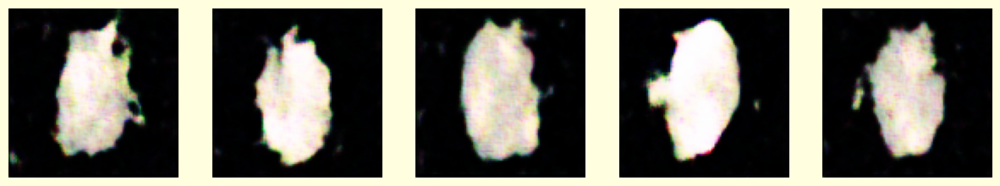

34/34 [==============================] - 15s 450ms/step - g_loss: -28.7743 - c_loss: -14.7129
Epoch 11/500
34/34 [==============================] - 15s 431ms/step - g_loss: -31.3535 - c_loss: -12.7768
Epoch 12/500
34/34 [==============================] - 15s 432ms/step - g_loss: -39.3622 - c_loss: -11.8925
Epoch 13/500
34/34 [==============================] - 15s 432ms/step - g_loss: -43.5934 - c_loss: -11.2990
Epoch 14/500
34/34 [==============================] - 15s 435ms/step - g_loss: -42.7447 - c_loss: -11.0228
Epoch 15/500
34/34 [==============================] - 15s 441ms/step - g_loss: -39.1996 - c_loss: -10.6212
Epoch 16/500
34/34 [==============================] - 15s 433ms/step - g_loss: -44.8461 - c_loss: -10.0827
Epoch 17/500
34/34 [==============================] - 15s 432ms/step - g_loss: -39.2670 - c_loss: -10.0416
Epoch 18/500
34/34 [==============================] - 15s 431ms/step - g_loss: -32.5660 - c_loss: -9.6449
Epoch 19/500
34/34 [==============================]

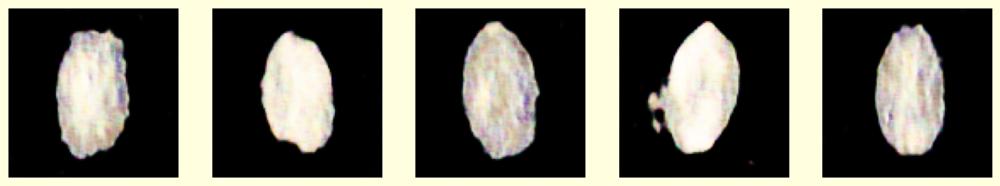

34/34 [==============================] - 15s 452ms/step - g_loss: -30.9816 - c_loss: -9.2676
Epoch 21/500
34/34 [==============================] - 15s 437ms/step - g_loss: -35.0380 - c_loss: -8.8678
Epoch 22/500
34/34 [==============================] - 15s 440ms/step - g_loss: -39.7879 - c_loss: -8.9362
Epoch 23/500
34/34 [==============================] - 15s 430ms/step - g_loss: -33.0703 - c_loss: -8.8087
Epoch 24/500
34/34 [==============================] - 15s 429ms/step - g_loss: -36.8781 - c_loss: -8.7439
Epoch 25/500
34/34 [==============================] - 15s 431ms/step - g_loss: -42.8690 - c_loss: -8.7394
Epoch 26/500
34/34 [==============================] - 15s 429ms/step - g_loss: -27.1915 - c_loss: -8.6829
Epoch 27/500
34/34 [==============================] - 15s 429ms/step - g_loss: -35.4279 - c_loss: -8.0537
Epoch 28/500
34/34 [==============================] - 15s 430ms/step - g_loss: -43.7897 - c_loss: -8.4785
Epoch 29/500
34/34 [==============================] - 15s 4

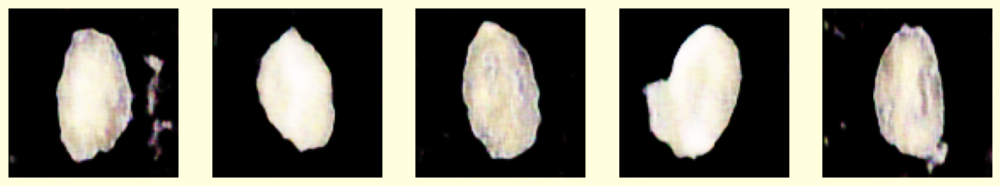

34/34 [==============================] - 15s 452ms/step - g_loss: -48.4028 - c_loss: -8.6108
Epoch 31/500
34/34 [==============================] - 21s 626ms/step - g_loss: -50.4880 - c_loss: -8.4455
Epoch 32/500
34/34 [==============================] - 19s 564ms/step - g_loss: -39.8926 - c_loss: -8.3245
Epoch 33/500
34/34 [==============================] - 19s 565ms/step - g_loss: -44.8280 - c_loss: -8.0875
Epoch 34/500
34/34 [==============================] - 16s 473ms/step - g_loss: -44.7669 - c_loss: -8.5228
Epoch 35/500
34/34 [==============================] - 15s 432ms/step - g_loss: -57.9914 - c_loss: -8.3599
Epoch 36/500
34/34 [==============================] - 15s 426ms/step - g_loss: -48.9851 - c_loss: -7.8994
Epoch 37/500
34/34 [==============================] - 15s 427ms/step - g_loss: -63.8627 - c_loss: -8.2900
Epoch 38/500
34/34 [==============================] - 15s 429ms/step - g_loss: -62.0483 - c_loss: -8.1996
Epoch 39/500
34/34 [==============================] - 15s 4

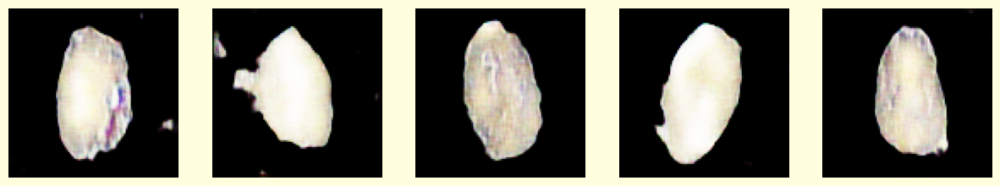

34/34 [==============================] - 15s 435ms/step - g_loss: -77.1125 - c_loss: -8.1568
Epoch 41/500
34/34 [==============================] - 15s 430ms/step - g_loss: -79.5499 - c_loss: -7.7112
Epoch 42/500
34/34 [==============================] - 15s 428ms/step - g_loss: -73.2375 - c_loss: -8.0035
Epoch 43/500
34/34 [==============================] - 15s 438ms/step - g_loss: -71.4719 - c_loss: -7.8279
Epoch 44/500
34/34 [==============================] - 15s 433ms/step - g_loss: -76.4836 - c_loss: -7.7858
Epoch 45/500
34/34 [==============================] - 15s 431ms/step - g_loss: -77.5265 - c_loss: -7.4926
Epoch 46/500
34/34 [==============================] - 15s 431ms/step - g_loss: -84.5453 - c_loss: -7.4749
Epoch 47/500
34/34 [==============================] - 15s 429ms/step - g_loss: -70.5370 - c_loss: -7.7081
Epoch 48/500
34/34 [==============================] - 15s 429ms/step - g_loss: -66.9905 - c_loss: -7.2108
Epoch 49/500
34/34 [==============================] - 15s 4

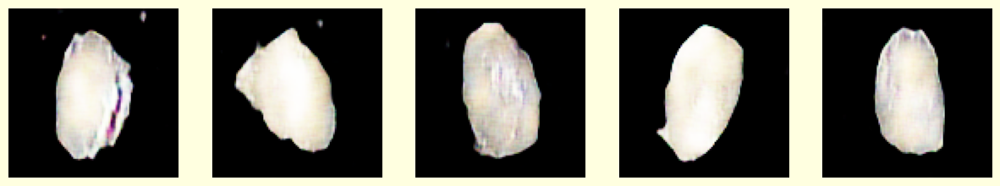


>>> Checkpoint disimpan di epoch 50:
    -> Generator: wgan_output_porto\generator_epoch_50.h5
    -> Critic: wgan_output_porto\critic_epoch_50.h5
34/34 [==============================] - 15s 438ms/step - g_loss: -71.7597 - c_loss: -7.1247
Epoch 51/500
34/34 [==============================] - 15s 430ms/step - g_loss: -74.0369 - c_loss: -7.4678
Epoch 52/500
34/34 [==============================] - 15s 429ms/step - g_loss: -71.4600 - c_loss: -7.7457
Epoch 53/500
34/34 [==============================] - 15s 430ms/step - g_loss: -57.8595 - c_loss: -6.9786
Epoch 54/500
34/34 [==============================] - 15s 426ms/step - g_loss: -64.5348 - c_loss: -7.1692
Epoch 55/500
34/34 [==============================] - 15s 429ms/step - g_loss: -58.8605 - c_loss: -7.3235
Epoch 56/500
34/34 [==============================] - 15s 428ms/step - g_loss: -58.1569 - c_loss: -7.3760
Epoch 57/500
34/34 [==============================] - 15s 427ms/step - g_loss: -65.9152 - c_loss: -6.7649
Epoch 58/500
34/3

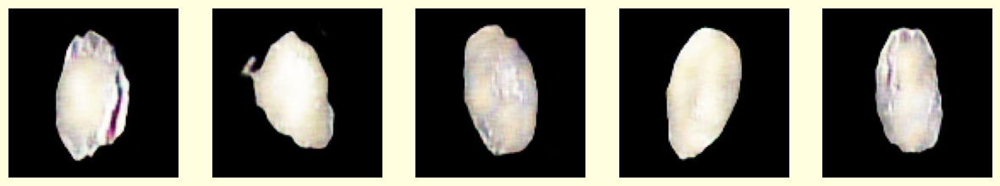

34/34 [==============================] - 15s 438ms/step - g_loss: -55.0153 - c_loss: -7.1365
Epoch 61/500
34/34 [==============================] - 15s 433ms/step - g_loss: -42.8534 - c_loss: -7.0814
Epoch 62/500
34/34 [==============================] - 15s 432ms/step - g_loss: -40.8102 - c_loss: -6.6311
Epoch 63/500
34/34 [==============================] - 15s 431ms/step - g_loss: -57.5859 - c_loss: -6.9649
Epoch 64/500
34/34 [==============================] - 15s 428ms/step - g_loss: -59.2710 - c_loss: -7.1947
Epoch 65/500
34/34 [==============================] - 15s 431ms/step - g_loss: -48.1393 - c_loss: -6.7493
Epoch 66/500
34/34 [==============================] - 15s 431ms/step - g_loss: -28.2722 - c_loss: -6.8849
Epoch 67/500
34/34 [==============================] - 15s 431ms/step - g_loss: -34.7865 - c_loss: -6.7390
Epoch 68/500
34/34 [==============================] - 15s 431ms/step - g_loss: -49.8994 - c_loss: -6.9961
Epoch 69/500
34/34 [==============================] - 15s 4

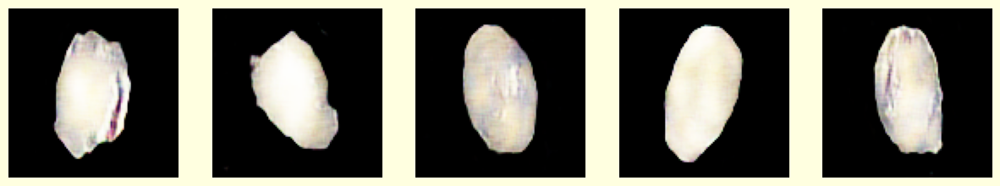

34/34 [==============================] - 15s 435ms/step - g_loss: -25.2280 - c_loss: -7.4666
Epoch 71/500
34/34 [==============================] - 15s 431ms/step - g_loss: -22.3250 - c_loss: -7.3012
Epoch 72/500
34/34 [==============================] - 15s 431ms/step - g_loss: -26.0687 - c_loss: -6.8626
Epoch 73/500
34/34 [==============================] - 15s 431ms/step - g_loss: -14.9525 - c_loss: -7.3943
Epoch 74/500
34/34 [==============================] - 15s 430ms/step - g_loss: -24.6542 - c_loss: -7.0626
Epoch 75/500
34/34 [==============================] - 15s 429ms/step - g_loss: -28.3256 - c_loss: -7.5124
Epoch 76/500
34/34 [==============================] - 15s 427ms/step - g_loss: -15.6785 - c_loss: -7.7878
Epoch 77/500
34/34 [==============================] - 15s 433ms/step - g_loss: -12.5488 - c_loss: -7.4228
Epoch 78/500
34/34 [==============================] - 15s 432ms/step - g_loss: -2.0312 - c_loss: -7.9788
Epoch 79/500
34/34 [==============================] - 15s 43

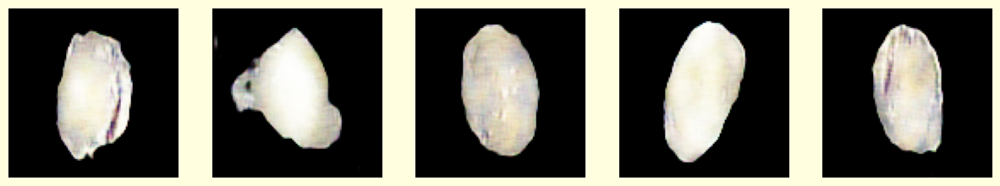

34/34 [==============================] - 15s 438ms/step - g_loss: -12.4025 - c_loss: -7.6854
Epoch 81/500
34/34 [==============================] - 15s 433ms/step - g_loss: -14.1727 - c_loss: -7.6018
Epoch 82/500
34/34 [==============================] - 15s 431ms/step - g_loss: -26.7869 - c_loss: -7.9276
Epoch 83/500
34/34 [==============================] - 15s 431ms/step - g_loss: -6.4688 - c_loss: -7.8341
Epoch 84/500
34/34 [==============================] - 15s 431ms/step - g_loss: -11.7174 - c_loss: -7.5940
Epoch 85/500
34/34 [==============================] - 15s 431ms/step - g_loss: -6.2229 - c_loss: -7.7528
Epoch 86/500
34/34 [==============================] - 15s 431ms/step - g_loss: -7.3258 - c_loss: -7.7640
Epoch 87/500
34/34 [==============================] - 15s 429ms/step - g_loss: 2.6971 - c_loss: -8.2049
Epoch 88/500
34/34 [==============================] - 15s 427ms/step - g_loss: -0.3863 - c_loss: -7.7321
Epoch 89/500
34/34 [==============================] - 15s 429ms/s

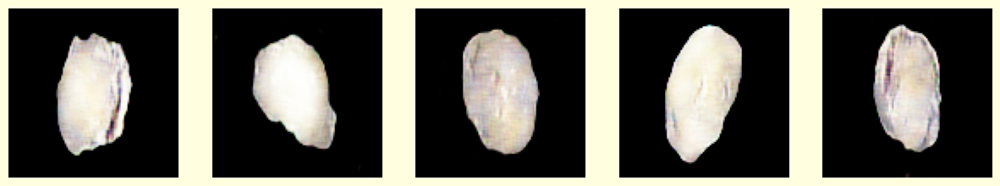

34/34 [==============================] - 15s 438ms/step - g_loss: -29.6896 - c_loss: -7.8966
Epoch 91/500
34/34 [==============================] - 15s 432ms/step - g_loss: -12.3824 - c_loss: -7.4461
Epoch 92/500
34/34 [==============================] - 15s 433ms/step - g_loss: -16.4006 - c_loss: -7.5462
Epoch 93/500
34/34 [==============================] - 15s 433ms/step - g_loss: -8.8205 - c_loss: -7.8870
Epoch 94/500
34/34 [==============================] - 15s 429ms/step - g_loss: -7.0503 - c_loss: -7.1700
Epoch 95/500
34/34 [==============================] - 15s 429ms/step - g_loss: -7.6350 - c_loss: -7.3624
Epoch 96/500
34/34 [==============================] - 15s 432ms/step - g_loss: -9.0643 - c_loss: -8.6585
Epoch 97/500
34/34 [==============================] - 15s 433ms/step - g_loss: -23.1075 - c_loss: -8.0187
Epoch 98/500
34/34 [==============================] - 15s 431ms/step - g_loss: -24.4764 - c_loss: -8.1780
Epoch 99/500
34/34 [==============================] - 15s 432ms

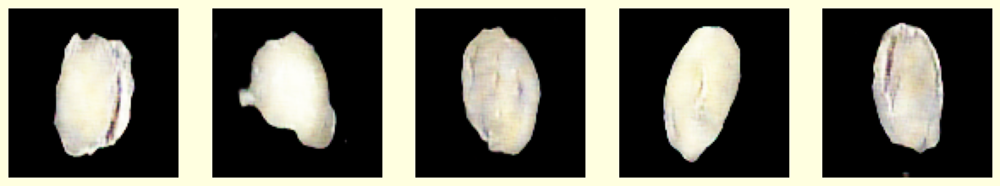


>>> Checkpoint disimpan di epoch 100:
    -> Generator: wgan_output_porto\generator_epoch_100.h5
    -> Critic: wgan_output_porto\critic_epoch_100.h5
34/34 [==============================] - 15s 441ms/step - g_loss: -33.2647 - c_loss: -8.0869
Epoch 101/500
34/34 [==============================] - 15s 431ms/step - g_loss: -20.7827 - c_loss: -8.3054
Epoch 102/500
34/34 [==============================] - 15s 432ms/step - g_loss: -24.2644 - c_loss: -7.7068
Epoch 103/500
34/34 [==============================] - 15s 432ms/step - g_loss: -26.2635 - c_loss: -7.6245
Epoch 104/500
34/34 [==============================] - 15s 432ms/step - g_loss: -25.5095 - c_loss: -7.8264
Epoch 105/500
34/34 [==============================] - 15s 432ms/step - g_loss: -26.8934 - c_loss: -8.0835
Epoch 106/500
34/34 [==============================] - 15s 432ms/step - g_loss: -23.9980 - c_loss: -7.6158
Epoch 107/500
34/34 [==============================] - 15s 431ms/step - g_loss: -6.2030 - c_loss: -8.1124
Epoch 10

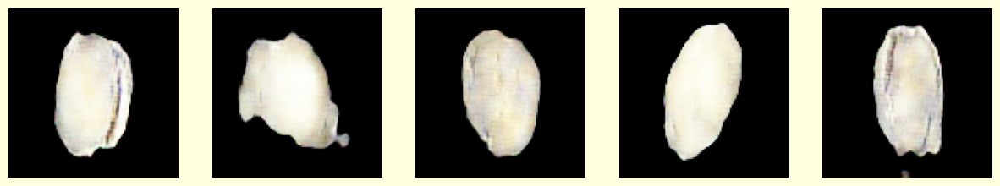

34/34 [==============================] - 15s 446ms/step - g_loss: -13.6703 - c_loss: -8.3681
Epoch 111/500
34/34 [==============================] - 15s 429ms/step - g_loss: -19.5378 - c_loss: -7.6581
Epoch 112/500
34/34 [==============================] - 15s 431ms/step - g_loss: -31.9522 - c_loss: -8.3809
Epoch 113/500
34/34 [==============================] - 15s 433ms/step - g_loss: -31.0972 - c_loss: -8.4344
Epoch 114/500
34/34 [==============================] - 15s 433ms/step - g_loss: -17.0924 - c_loss: -7.8651
Epoch 115/500
34/34 [==============================] - 15s 430ms/step - g_loss: -15.9886 - c_loss: -7.9929
Epoch 116/500
34/34 [==============================] - 15s 430ms/step - g_loss: -15.0932 - c_loss: -8.4944
Epoch 117/500
34/34 [==============================] - 15s 431ms/step - g_loss: -14.5486 - c_loss: -8.1232
Epoch 118/500
34/34 [==============================] - 15s 430ms/step - g_loss: -32.9564 - c_loss: -8.2244
Epoch 119/500
34/34 [==============================

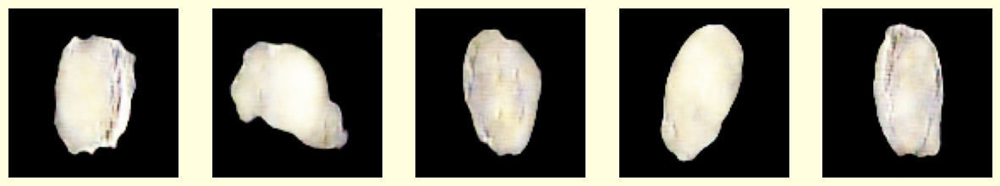

34/34 [==============================] - 15s 433ms/step - g_loss: -15.1291 - c_loss: -7.7142
Epoch 121/500
34/34 [==============================] - 15s 430ms/step - g_loss: -20.0313 - c_loss: -7.9460
Epoch 122/500
34/34 [==============================] - 15s 434ms/step - g_loss: -19.4932 - c_loss: -7.6195
Epoch 123/500
34/34 [==============================] - 15s 431ms/step - g_loss: -27.3271 - c_loss: -7.7489
Epoch 124/500
34/34 [==============================] - 15s 430ms/step - g_loss: -24.4263 - c_loss: -8.4642
Epoch 125/500
34/34 [==============================] - 15s 430ms/step - g_loss: -27.2977 - c_loss: -8.2255
Epoch 126/500
34/34 [==============================] - 15s 431ms/step - g_loss: -11.7249 - c_loss: -8.0568
Epoch 127/500
34/34 [==============================] - 15s 430ms/step - g_loss: -23.8018 - c_loss: -7.7296
Epoch 128/500
34/34 [==============================] - 15s 430ms/step - g_loss: -31.3694 - c_loss: -8.2881
Epoch 129/500
34/34 [==============================

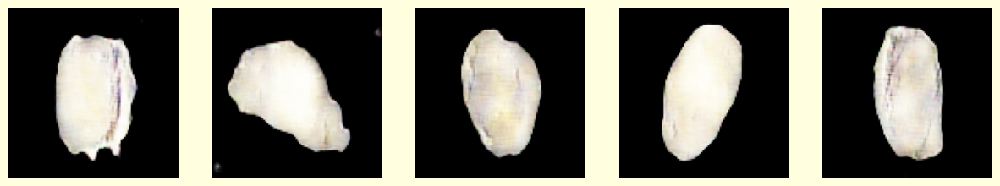

34/34 [==============================] - 15s 433ms/step - g_loss: -29.1508 - c_loss: -7.3504
Epoch 131/500
34/34 [==============================] - 15s 432ms/step - g_loss: -31.2930 - c_loss: -7.7608
Epoch 132/500
34/34 [==============================] - 15s 431ms/step - g_loss: -20.4621 - c_loss: -7.9202
Epoch 133/500
34/34 [==============================] - 15s 432ms/step - g_loss: -30.6151 - c_loss: -8.0294
Epoch 134/500
34/34 [==============================] - 15s 431ms/step - g_loss: -20.8713 - c_loss: -8.4059
Epoch 135/500
34/34 [==============================] - 15s 433ms/step - g_loss: -15.3335 - c_loss: -7.8549
Epoch 136/500
34/34 [==============================] - 15s 431ms/step - g_loss: -17.1575 - c_loss: -8.4800
Epoch 137/500
34/34 [==============================] - 15s 428ms/step - g_loss: -11.0706 - c_loss: -8.5221
Epoch 138/500
34/34 [==============================] - 15s 431ms/step - g_loss: -8.2390 - c_loss: -8.0269
Epoch 139/500
34/34 [==============================]

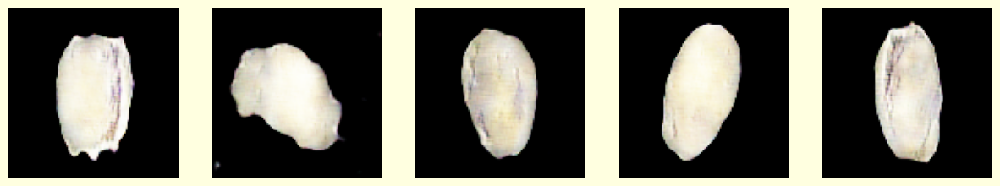

34/34 [==============================] - 15s 437ms/step - g_loss: -26.5617 - c_loss: -7.9742
Epoch 141/500
34/34 [==============================] - 15s 432ms/step - g_loss: -18.6909 - c_loss: -8.3213
Epoch 142/500
34/34 [==============================] - 15s 432ms/step - g_loss: -22.8146 - c_loss: -7.9908
Epoch 143/500
34/34 [==============================] - 15s 434ms/step - g_loss: -8.2451 - c_loss: -7.7280
Epoch 144/500
34/34 [==============================] - 15s 433ms/step - g_loss: -11.8140 - c_loss: -8.4020
Epoch 145/500
34/34 [==============================] - 15s 432ms/step - g_loss: -19.9753 - c_loss: -7.8098
Epoch 146/500
34/34 [==============================] - 15s 431ms/step - g_loss: -8.4305 - c_loss: -8.1245
Epoch 147/500
34/34 [==============================] - 15s 430ms/step - g_loss: -4.9278 - c_loss: -7.4851
Epoch 148/500
34/34 [==============================] - 15s 431ms/step - g_loss: -7.2327 - c_loss: -7.5523
Epoch 149/500
34/34 [==============================] - 

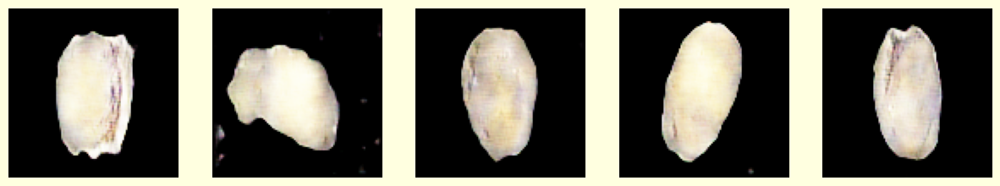


>>> Checkpoint disimpan di epoch 150:
    -> Generator: wgan_output_porto\generator_epoch_150.h5
    -> Critic: wgan_output_porto\critic_epoch_150.h5
34/34 [==============================] - 15s 443ms/step - g_loss: -13.8078 - c_loss: -7.9454
Epoch 151/500
34/34 [==============================] - 15s 433ms/step - g_loss: -14.3217 - c_loss: -8.5505
Epoch 152/500
34/34 [==============================] - 15s 433ms/step - g_loss: -10.7839 - c_loss: -7.6451
Epoch 153/500
34/34 [==============================] - 15s 434ms/step - g_loss: -10.6169 - c_loss: -7.7130
Epoch 154/500
34/34 [==============================] - 15s 433ms/step - g_loss: -14.8452 - c_loss: -8.3852
Epoch 155/500
34/34 [==============================] - 15s 431ms/step - g_loss: -15.2690 - c_loss: -7.6090
Epoch 156/500
34/34 [==============================] - 15s 432ms/step - g_loss: -8.9192 - c_loss: -8.1446
Epoch 157/500
34/34 [==============================] - 15s 431ms/step - g_loss: -15.9550 - c_loss: -7.6880
Epoch 15

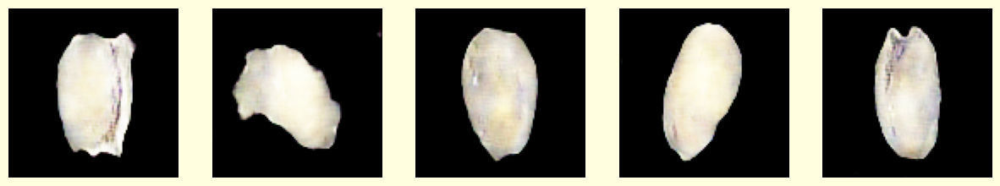

34/34 [==============================] - 15s 437ms/step - g_loss: -21.6501 - c_loss: -7.8509
Epoch 161/500
34/34 [==============================] - 15s 430ms/step - g_loss: -18.5473 - c_loss: -8.4594
Epoch 162/500
34/34 [==============================] - 15s 429ms/step - g_loss: -14.1035 - c_loss: -7.9439
Epoch 163/500
34/34 [==============================] - 15s 431ms/step - g_loss: -29.9782 - c_loss: -8.4083
Epoch 164/500
34/34 [==============================] - 15s 432ms/step - g_loss: -19.5828 - c_loss: -8.1126
Epoch 165/500
34/34 [==============================] - 15s 431ms/step - g_loss: -17.8379 - c_loss: -7.8122
Epoch 166/500
34/34 [==============================] - 15s 432ms/step - g_loss: -14.6029 - c_loss: -7.8862
Epoch 167/500
34/34 [==============================] - 15s 432ms/step - g_loss: -12.0071 - c_loss: -8.1258
Epoch 168/500
34/34 [==============================] - 15s 431ms/step - g_loss: -10.8607 - c_loss: -8.2521
Epoch 169/500
34/34 [==============================

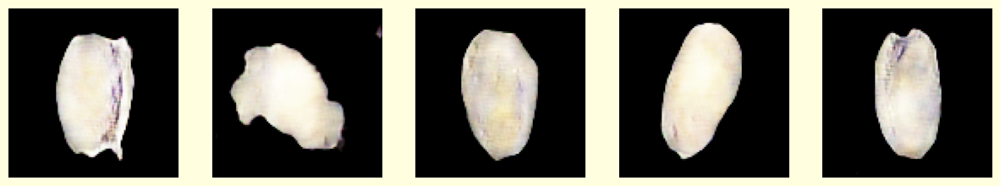

34/34 [==============================] - 15s 437ms/step - g_loss: -10.6159 - c_loss: -7.6742
Epoch 171/500
34/34 [==============================] - 15s 433ms/step - g_loss: -17.0545 - c_loss: -8.0146
Epoch 172/500
34/34 [==============================] - 15s 433ms/step - g_loss: -13.5857 - c_loss: -8.1818
Epoch 173/500
34/34 [==============================] - 15s 432ms/step - g_loss: -11.9033 - c_loss: -7.9796
Epoch 174/500
34/34 [==============================] - 15s 432ms/step - g_loss: -12.3045 - c_loss: -8.2119
Epoch 175/500
34/34 [==============================] - 15s 431ms/step - g_loss: -8.1215 - c_loss: -8.2746
Epoch 176/500
34/34 [==============================] - 15s 431ms/step - g_loss: -7.8575 - c_loss: -8.5881
Epoch 177/500
34/34 [==============================] - 15s 431ms/step - g_loss: -11.7340 - c_loss: -8.1586
Epoch 178/500
34/34 [==============================] - 15s 431ms/step - g_loss: -14.9050 - c_loss: -7.6841
Epoch 179/500
34/34 [==============================] 

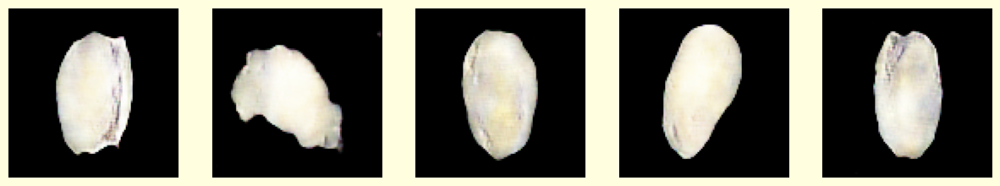

34/34 [==============================] - 15s 440ms/step - g_loss: -12.2629 - c_loss: -7.7890
Epoch 181/500
34/34 [==============================] - 15s 430ms/step - g_loss: -17.5371 - c_loss: -8.7390
Epoch 182/500
34/34 [==============================] - 14s 424ms/step - g_loss: -9.7169 - c_loss: -7.8466
Epoch 183/500
34/34 [==============================] - 15s 430ms/step - g_loss: -12.3007 - c_loss: -7.8884
Epoch 184/500
34/34 [==============================] - 15s 430ms/step - g_loss: -20.8077 - c_loss: -7.9162
Epoch 185/500
34/34 [==============================] - 15s 430ms/step - g_loss: -9.1055 - c_loss: -7.8849
Epoch 186/500
34/34 [==============================] - 15s 431ms/step - g_loss: -9.3360 - c_loss: -7.9946
Epoch 187/500
34/34 [==============================] - 15s 429ms/step - g_loss: -2.4873 - c_loss: -8.0027
Epoch 188/500
34/34 [==============================] - 15s 430ms/step - g_loss: -9.4326 - c_loss: -8.0368
Epoch 189/500
34/34 [==============================] - 1

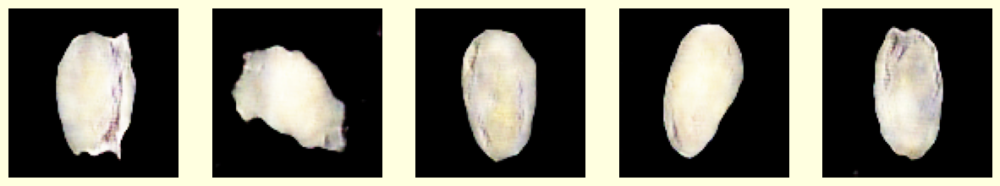

34/34 [==============================] - 15s 434ms/step - g_loss: -7.1035 - c_loss: -8.2690
Epoch 191/500
34/34 [==============================] - 15s 429ms/step - g_loss: -4.2863 - c_loss: -8.1172
Epoch 192/500
34/34 [==============================] - 15s 430ms/step - g_loss: -2.2474 - c_loss: -8.4406
Epoch 193/500
34/34 [==============================] - 15s 430ms/step - g_loss: -16.8619 - c_loss: -8.0393
Epoch 194/500
34/34 [==============================] - 15s 431ms/step - g_loss: -8.8595 - c_loss: -8.5532
Epoch 195/500
34/34 [==============================] - 15s 431ms/step - g_loss: -8.8508 - c_loss: -8.4012
Epoch 196/500
34/34 [==============================] - 15s 431ms/step - g_loss: -9.1984 - c_loss: -8.2418
Epoch 197/500
34/34 [==============================] - 15s 432ms/step - g_loss: -15.3532 - c_loss: -7.8763
Epoch 198/500
34/34 [==============================] - 15s 429ms/step - g_loss: -6.5155 - c_loss: -7.5172
Epoch 199/500
34/34 [==============================] - 15s

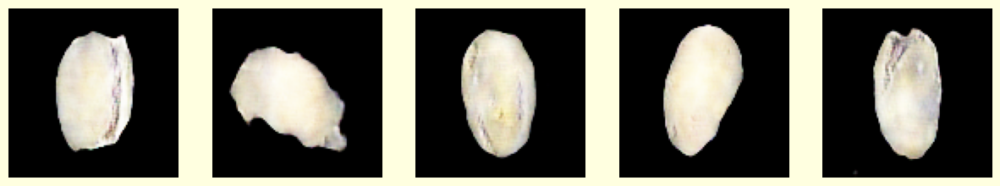


>>> Checkpoint disimpan di epoch 200:
    -> Generator: wgan_output_porto\generator_epoch_200.h5
    -> Critic: wgan_output_porto\critic_epoch_200.h5
34/34 [==============================] - 15s 442ms/step - g_loss: -8.5772 - c_loss: -8.2458
Epoch 201/500
34/34 [==============================] - 15s 430ms/step - g_loss: -8.2967 - c_loss: -8.4997
Epoch 202/500
34/34 [==============================] - 15s 433ms/step - g_loss: -3.0384 - c_loss: -8.1431
Epoch 203/500
34/34 [==============================] - 15s 433ms/step - g_loss: -7.7168 - c_loss: -8.6655
Epoch 204/500
34/34 [==============================] - 15s 433ms/step - g_loss: -7.2888 - c_loss: -7.7548
Epoch 205/500
34/34 [==============================] - 15s 432ms/step - g_loss: -9.9534 - c_loss: -7.9384
Epoch 206/500
34/34 [==============================] - 15s 432ms/step - g_loss: -9.0917 - c_loss: -7.9460
Epoch 207/500
34/34 [==============================] - 15s 431ms/step - g_loss: -7.7180 - c_loss: -7.5826
Epoch 208/500
3

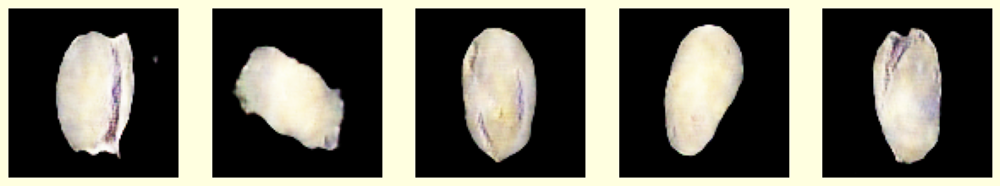

34/34 [==============================] - 15s 437ms/step - g_loss: -3.8676 - c_loss: -8.0601
Epoch 211/500
34/34 [==============================] - 15s 431ms/step - g_loss: -10.2777 - c_loss: -8.0941
Epoch 212/500
34/34 [==============================] - 15s 431ms/step - g_loss: -8.8634 - c_loss: -7.7761
Epoch 213/500
34/34 [==============================] - 15s 431ms/step - g_loss: -7.7869 - c_loss: -8.4898
Epoch 214/500
34/34 [==============================] - 15s 430ms/step - g_loss: -9.7091 - c_loss: -7.7927
Epoch 215/500
34/34 [==============================] - 15s 430ms/step - g_loss: -15.8318 - c_loss: -8.1593
Epoch 216/500
34/34 [==============================] - 15s 431ms/step - g_loss: -3.3668 - c_loss: -7.9186
Epoch 217/500
34/34 [==============================] - 15s 431ms/step - g_loss: -5.6219 - c_loss: -8.3343
Epoch 218/500
34/34 [==============================] - 15s 431ms/step - g_loss: -12.8209 - c_loss: -7.7048
Epoch 219/500
34/34 [==============================] - 15

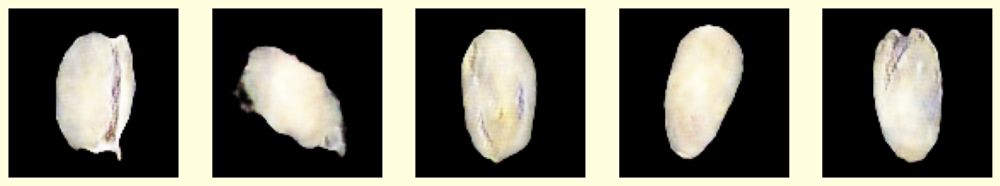

34/34 [==============================] - 15s 437ms/step - g_loss: -13.7391 - c_loss: -7.6543
Epoch 221/500
34/34 [==============================] - 15s 430ms/step - g_loss: -17.6577 - c_loss: -8.3168
Epoch 222/500
34/34 [==============================] - 15s 430ms/step - g_loss: -15.4373 - c_loss: -7.8147
Epoch 223/500
34/34 [==============================] - 15s 431ms/step - g_loss: -18.7442 - c_loss: -7.5226
Epoch 224/500
34/34 [==============================] - 15s 432ms/step - g_loss: -15.0541 - c_loss: -8.2818
Epoch 225/500
34/34 [==============================] - 15s 431ms/step - g_loss: -6.3115 - c_loss: -7.9226
Epoch 226/500
34/34 [==============================] - 15s 431ms/step - g_loss: -2.8084 - c_loss: -8.5155
Epoch 227/500
34/34 [==============================] - 15s 431ms/step - g_loss: -10.7285 - c_loss: -7.8856
Epoch 228/500
34/34 [==============================] - 15s 434ms/step - g_loss: 1.1252 - c_loss: -8.0503
Epoch 229/500
34/34 [==============================] - 

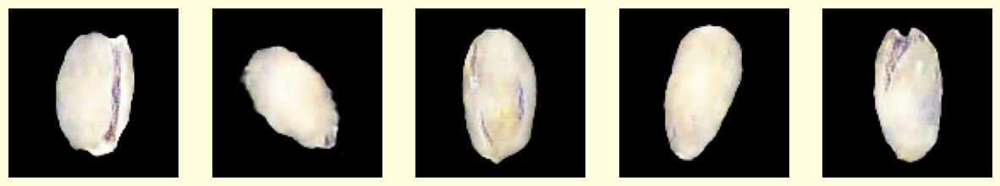

34/34 [==============================] - 15s 438ms/step - g_loss: -5.9970 - c_loss: -8.0969
Epoch 231/500
34/34 [==============================] - 15s 432ms/step - g_loss: -10.6662 - c_loss: -7.4557
Epoch 232/500
34/34 [==============================] - 15s 432ms/step - g_loss: -8.1559 - c_loss: -8.4313
Epoch 233/500
34/34 [==============================] - 15s 433ms/step - g_loss: -8.8149 - c_loss: -8.5548
Epoch 234/500
34/34 [==============================] - 15s 432ms/step - g_loss: -9.0352 - c_loss: -8.2071
Epoch 235/500
34/34 [==============================] - 15s 432ms/step - g_loss: -10.1279 - c_loss: -8.0517
Epoch 236/500
34/34 [==============================] - 15s 434ms/step - g_loss: -6.6479 - c_loss: -7.6092
Epoch 237/500
34/34 [==============================] - 15s 432ms/step - g_loss: -10.4856 - c_loss: -7.8204
Epoch 238/500
34/34 [==============================] - 15s 428ms/step - g_loss: -9.4260 - c_loss: -8.5925
Epoch 239/500
34/34 [==============================] - 15

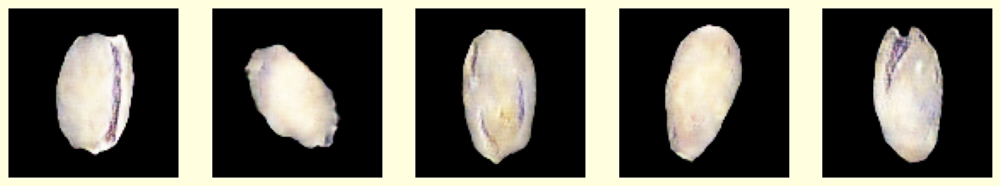

34/34 [==============================] - 15s 435ms/step - g_loss: -8.2598 - c_loss: -7.4776
Epoch 241/500
34/34 [==============================] - 15s 430ms/step - g_loss: -8.2381 - c_loss: -8.0437
Epoch 242/500
34/34 [==============================] - 15s 430ms/step - g_loss: -3.3997 - c_loss: -7.4855
Epoch 243/500
34/34 [==============================] - 15s 430ms/step - g_loss: -10.5156 - c_loss: -8.0321
Epoch 244/500
34/34 [==============================] - 15s 432ms/step - g_loss: -8.5322 - c_loss: -7.6177
Epoch 245/500
34/34 [==============================] - 15s 430ms/step - g_loss: -8.8946 - c_loss: -7.7982
Epoch 246/500
34/34 [==============================] - 15s 431ms/step - g_loss: -8.6471 - c_loss: -7.6902
Epoch 247/500
34/34 [==============================] - 15s 429ms/step - g_loss: -4.8341 - c_loss: -7.6746
Epoch 248/500
34/34 [==============================] - 15s 429ms/step - g_loss: -10.6223 - c_loss: -8.1620
Epoch 249/500
34/34 [==============================] - 15s

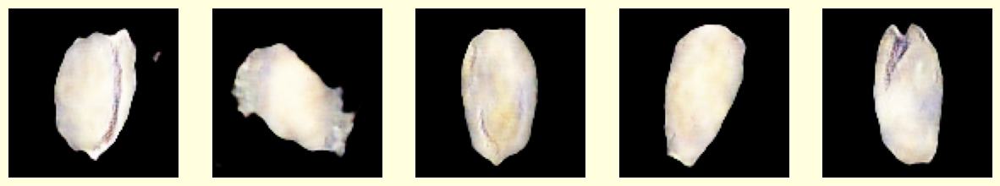


>>> Checkpoint disimpan di epoch 250:
    -> Generator: wgan_output_porto\generator_epoch_250.h5
    -> Critic: wgan_output_porto\critic_epoch_250.h5
34/34 [==============================] - 15s 445ms/step - g_loss: -6.1037 - c_loss: -7.9187
Epoch 251/500
34/34 [==============================] - 15s 430ms/step - g_loss: -14.8861 - c_loss: -8.5456
Epoch 252/500
34/34 [==============================] - 15s 431ms/step - g_loss: -10.7092 - c_loss: -7.5914
Epoch 253/500
34/34 [==============================] - 15s 431ms/step - g_loss: -9.8191 - c_loss: -8.0610
Epoch 254/500
34/34 [==============================] - 15s 430ms/step - g_loss: -6.4644 - c_loss: -8.1205
Epoch 255/500
34/34 [==============================] - 15s 431ms/step - g_loss: -7.8775 - c_loss: -7.3413
Epoch 256/500
34/34 [==============================] - 15s 430ms/step - g_loss: -1.6872 - c_loss: -8.0152
Epoch 257/500
34/34 [==============================] - 15s 430ms/step - g_loss: -4.6003 - c_loss: -7.9930
Epoch 258/500

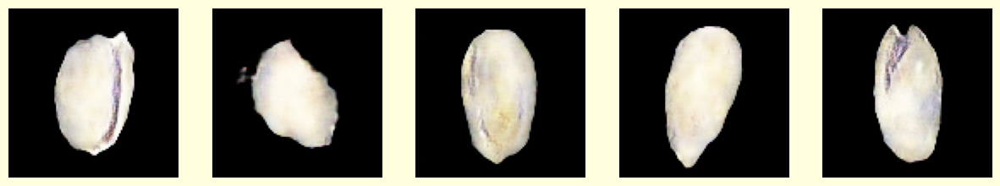

34/34 [==============================] - 15s 436ms/step - g_loss: -3.4149 - c_loss: -7.9804
Epoch 261/500
34/34 [==============================] - 15s 429ms/step - g_loss: -7.8477 - c_loss: -8.1833
Epoch 262/500
34/34 [==============================] - 15s 429ms/step - g_loss: -4.1543 - c_loss: -7.7517
Epoch 263/500
34/34 [==============================] - 15s 429ms/step - g_loss: -5.3513 - c_loss: -7.6585
Epoch 264/500
34/34 [==============================] - 15s 432ms/step - g_loss: -10.8975 - c_loss: -8.2435
Epoch 265/500
34/34 [==============================] - 15s 431ms/step - g_loss: -3.2486 - c_loss: -8.2175
Epoch 266/500
34/34 [==============================] - 15s 427ms/step - g_loss: -5.9132 - c_loss: -7.9506
Epoch 267/500
34/34 [==============================] - 15s 429ms/step - g_loss: -6.8398 - c_loss: -8.0001
Epoch 268/500
34/34 [==============================] - 15s 432ms/step - g_loss: -4.5211 - c_loss: -7.6449
Epoch 269/500
34/34 [==============================] - 15s 

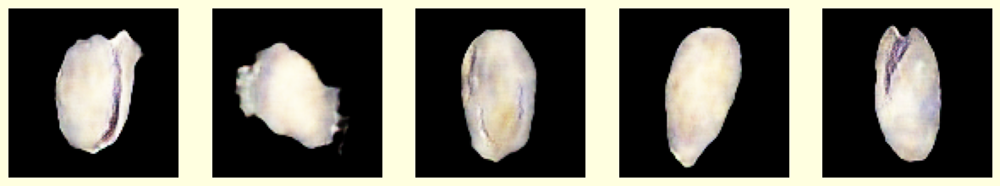

34/34 [==============================] - 15s 437ms/step - g_loss: -4.0185 - c_loss: -8.4181
Epoch 271/500
34/34 [==============================] - 15s 431ms/step - g_loss: -12.6755 - c_loss: -7.9529
Epoch 272/500
34/34 [==============================] - 15s 432ms/step - g_loss: -12.6887 - c_loss: -7.9532
Epoch 273/500
34/34 [==============================] - 15s 433ms/step - g_loss: -1.4117 - c_loss: -8.5561
Epoch 274/500
34/34 [==============================] - 15s 433ms/step - g_loss: -6.2423 - c_loss: -8.3546
Epoch 275/500
34/34 [==============================] - 15s 431ms/step - g_loss: -10.8178 - c_loss: -7.8001
Epoch 276/500
34/34 [==============================] - 15s 431ms/step - g_loss: -4.9721 - c_loss: -8.0063
Epoch 277/500
34/34 [==============================] - 15s 432ms/step - g_loss: -5.3462 - c_loss: -8.1735
Epoch 278/500
34/34 [==============================] - 15s 433ms/step - g_loss: -11.3521 - c_loss: -8.0044
Epoch 279/500
34/34 [==============================] - 1

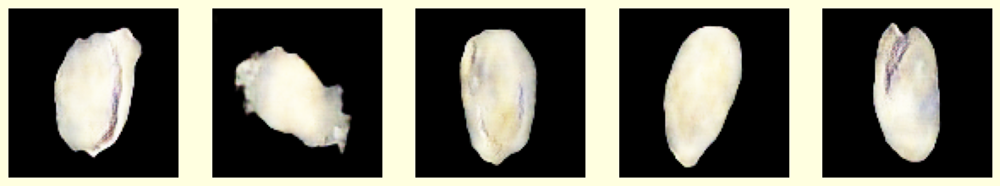

34/34 [==============================] - 15s 438ms/step - g_loss: -3.6415 - c_loss: -7.4342
Epoch 281/500
34/34 [==============================] - 15s 434ms/step - g_loss: -9.1138 - c_loss: -8.4944
Epoch 282/500
34/34 [==============================] - 15s 452ms/step - g_loss: -14.0774 - c_loss: -7.6289
Epoch 283/500
34/34 [==============================] - 15s 451ms/step - g_loss: -10.2569 - c_loss: -7.6651
Epoch 284/500
34/34 [==============================] - 15s 436ms/step - g_loss: -9.9313 - c_loss: -8.5974
Epoch 285/500
34/34 [==============================] - 15s 431ms/step - g_loss: -7.2375 - c_loss: -7.5978
Epoch 286/500
34/34 [==============================] - 15s 430ms/step - g_loss: -10.6255 - c_loss: -7.9926
Epoch 287/500
34/34 [==============================] - 15s 430ms/step - g_loss: -12.8417 - c_loss: -7.6950
Epoch 288/500
34/34 [==============================] - 15s 428ms/step - g_loss: -9.1666 - c_loss: -8.3237
Epoch 289/500
34/34 [==============================] - 1

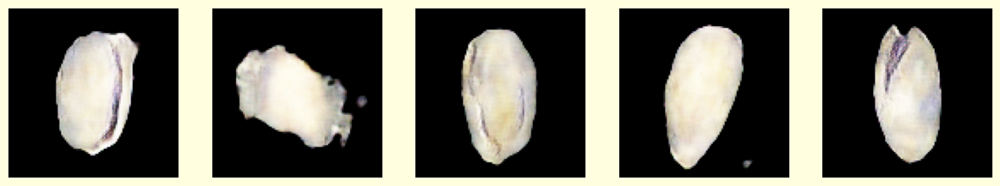

34/34 [==============================] - 15s 435ms/step - g_loss: -8.1587 - c_loss: -7.7735
Epoch 291/500
34/34 [==============================] - 15s 427ms/step - g_loss: -10.8057 - c_loss: -8.4838
Epoch 292/500
34/34 [==============================] - 15s 429ms/step - g_loss: -14.2959 - c_loss: -8.0096
Epoch 293/500
34/34 [==============================] - 15s 429ms/step - g_loss: -9.8941 - c_loss: -8.0451
Epoch 294/500
34/34 [==============================] - 15s 429ms/step - g_loss: -16.9551 - c_loss: -7.5642
Epoch 295/500
34/34 [==============================] - 15s 429ms/step - g_loss: -9.5863 - c_loss: -8.0012
Epoch 296/500
34/34 [==============================] - 15s 429ms/step - g_loss: -4.6956 - c_loss: -7.5443
Epoch 297/500
34/34 [==============================] - 15s 429ms/step - g_loss: -7.9475 - c_loss: -8.7459
Epoch 298/500
34/34 [==============================] - 15s 429ms/step - g_loss: -10.2441 - c_loss: -7.7907
Epoch 299/500
34/34 [==============================] - 1

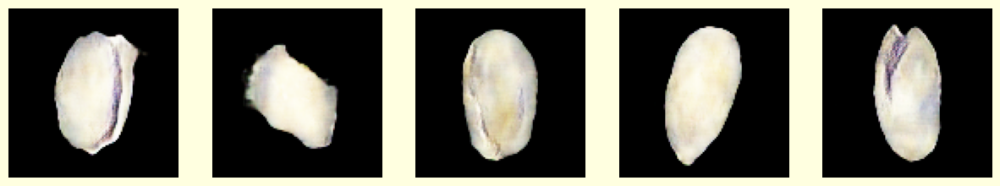


>>> Checkpoint disimpan di epoch 300:
    -> Generator: wgan_output_porto\generator_epoch_300.h5
    -> Critic: wgan_output_porto\critic_epoch_300.h5
34/34 [==============================] - 15s 438ms/step - g_loss: -10.8670 - c_loss: -7.7112
Epoch 301/500
34/34 [==============================] - 15s 432ms/step - g_loss: -11.5455 - c_loss: -8.3072
Epoch 302/500
34/34 [==============================] - 15s 432ms/step - g_loss: -11.0433 - c_loss: -7.7120
Epoch 303/500
34/34 [==============================] - 15s 431ms/step - g_loss: -8.2563 - c_loss: -7.5657
Epoch 304/500
34/34 [==============================] - 15s 430ms/step - g_loss: -9.9482 - c_loss: -8.8163
Epoch 305/500
34/34 [==============================] - 15s 433ms/step - g_loss: -8.1180 - c_loss: -8.5020
Epoch 306/500
34/34 [==============================] - 15s 432ms/step - g_loss: -16.5443 - c_loss: -8.3040
Epoch 307/500
34/34 [==============================] - 15s 430ms/step - g_loss: -12.8614 - c_loss: -7.7276
Epoch 308/

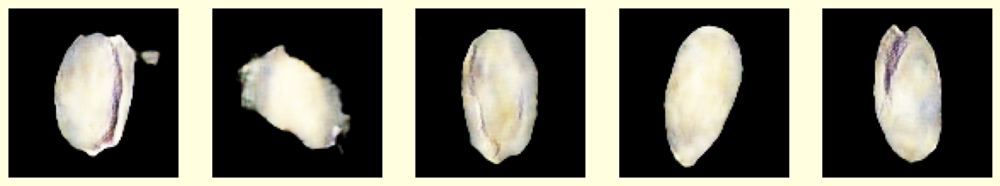

34/34 [==============================] - 15s 437ms/step - g_loss: -15.3126 - c_loss: -8.4183
Epoch 311/500
34/34 [==============================] - 15s 430ms/step - g_loss: -16.3412 - c_loss: -8.2947
Epoch 312/500
34/34 [==============================] - 15s 430ms/step - g_loss: -14.9510 - c_loss: -7.9644
Epoch 313/500
34/34 [==============================] - 15s 431ms/step - g_loss: -22.5145 - c_loss: -7.5441
Epoch 314/500
34/34 [==============================] - 15s 432ms/step - g_loss: -13.9931 - c_loss: -7.4920
Epoch 315/500
34/34 [==============================] - 15s 431ms/step - g_loss: -12.2979 - c_loss: -7.8305
Epoch 316/500
34/34 [==============================] - 15s 430ms/step - g_loss: -12.5406 - c_loss: -8.0492
Epoch 317/500
34/34 [==============================] - 15s 432ms/step - g_loss: -21.7814 - c_loss: -8.0154
Epoch 318/500
34/34 [==============================] - 15s 432ms/step - g_loss: -17.5393 - c_loss: -8.0379
Epoch 319/500
34/34 [==============================

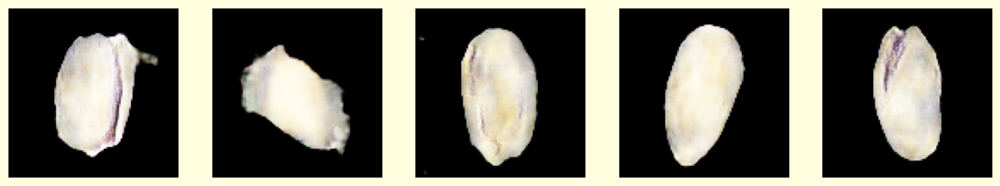

34/34 [==============================] - 15s 436ms/step - g_loss: -17.3079 - c_loss: -7.7313
Epoch 321/500
34/34 [==============================] - 15s 431ms/step - g_loss: -14.4130 - c_loss: -7.7369
Epoch 322/500
34/34 [==============================] - 15s 431ms/step - g_loss: -14.8651 - c_loss: -7.7683
Epoch 323/500
34/34 [==============================] - 15s 433ms/step - g_loss: -18.0518 - c_loss: -8.2369
Epoch 324/500
34/34 [==============================] - 15s 431ms/step - g_loss: -15.0632 - c_loss: -8.0532
Epoch 325/500
34/34 [==============================] - 15s 432ms/step - g_loss: -9.3644 - c_loss: -8.2787
Epoch 326/500
34/34 [==============================] - 15s 433ms/step - g_loss: -13.0098 - c_loss: -7.9725
Epoch 327/500
34/34 [==============================] - 15s 432ms/step - g_loss: -13.2809 - c_loss: -8.1188
Epoch 328/500
34/34 [==============================] - 15s 433ms/step - g_loss: -6.2306 - c_loss: -7.7544
Epoch 329/500
34/34 [==============================] 

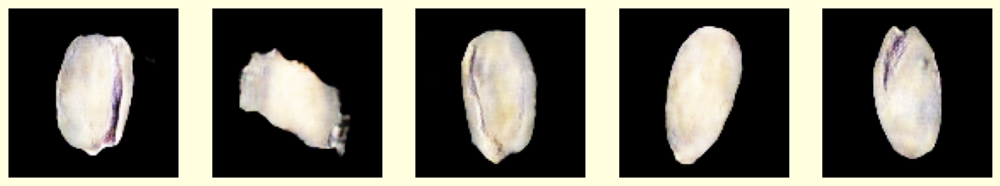

34/34 [==============================] - 15s 438ms/step - g_loss: -11.5387 - c_loss: -7.4533
Epoch 331/500
34/34 [==============================] - 15s 433ms/step - g_loss: -11.5399 - c_loss: -7.7549
Epoch 332/500
34/34 [==============================] - 15s 433ms/step - g_loss: -11.1384 - c_loss: -8.3937
Epoch 333/500
34/34 [==============================] - 15s 433ms/step - g_loss: -14.0772 - c_loss: -8.0469
Epoch 334/500
34/34 [==============================] - 15s 433ms/step - g_loss: -8.8846 - c_loss: -9.0743
Epoch 335/500
34/34 [==============================] - 15s 433ms/step - g_loss: -10.6785 - c_loss: -7.5237
Epoch 336/500
34/34 [==============================] - 15s 434ms/step - g_loss: -11.7338 - c_loss: -8.1027
Epoch 337/500
34/34 [==============================] - 15s 432ms/step - g_loss: -11.1241 - c_loss: -8.0024
Epoch 338/500
34/34 [==============================] - 15s 432ms/step - g_loss: -9.9561 - c_loss: -7.7783
Epoch 339/500
34/34 [==============================] 

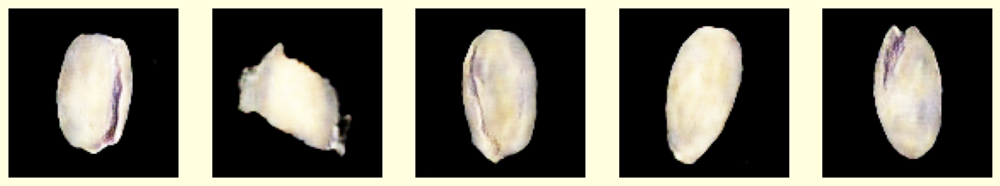

34/34 [==============================] - 15s 438ms/step - g_loss: -15.8185 - c_loss: -7.6694
Epoch 341/500
34/34 [==============================] - 15s 434ms/step - g_loss: -15.1859 - c_loss: -8.4506
Epoch 342/500
34/34 [==============================] - 15s 432ms/step - g_loss: -12.7226 - c_loss: -8.0987
Epoch 343/500
34/34 [==============================] - 15s 432ms/step - g_loss: -8.2092 - c_loss: -8.2294
Epoch 344/500
34/34 [==============================] - 15s 432ms/step - g_loss: -11.5686 - c_loss: -8.0045
Epoch 345/500
34/34 [==============================] - 15s 432ms/step - g_loss: -7.0725 - c_loss: -7.8442
Epoch 346/500
34/34 [==============================] - 15s 432ms/step - g_loss: -14.9066 - c_loss: -8.9542
Epoch 347/500
34/34 [==============================] - 15s 432ms/step - g_loss: -12.0005 - c_loss: -8.3036
Epoch 348/500
34/34 [==============================] - 15s 431ms/step - g_loss: -15.4320 - c_loss: -8.1366
Epoch 349/500
34/34 [==============================] 

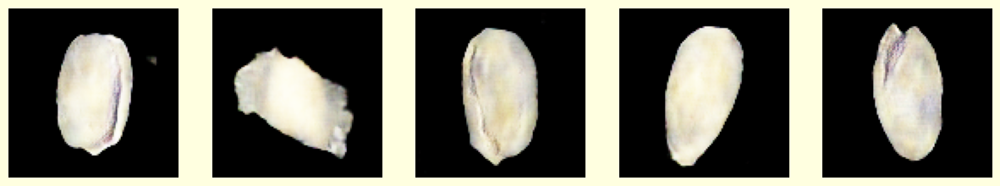


>>> Checkpoint disimpan di epoch 350:
    -> Generator: wgan_output_porto\generator_epoch_350.h5
    -> Critic: wgan_output_porto\critic_epoch_350.h5
34/34 [==============================] - 15s 443ms/step - g_loss: -12.0624 - c_loss: -8.0507
Epoch 351/500
34/34 [==============================] - 15s 433ms/step - g_loss: -7.6284 - c_loss: -8.6093
Epoch 352/500
34/34 [==============================] - 15s 432ms/step - g_loss: -5.8247 - c_loss: -8.0183
Epoch 353/500
34/34 [==============================] - 15s 433ms/step - g_loss: -6.2895 - c_loss: -8.2424
Epoch 354/500
34/34 [==============================] - 15s 434ms/step - g_loss: -8.6987 - c_loss: -7.9557
Epoch 355/500
34/34 [==============================] - 15s 431ms/step - g_loss: -11.0390 - c_loss: -8.4553
Epoch 356/500
34/34 [==============================] - 15s 432ms/step - g_loss: -9.2974 - c_loss: -8.2498
Epoch 357/500
34/34 [==============================] - 15s 432ms/step - g_loss: -9.7367 - c_loss: -8.2045
Epoch 358/500

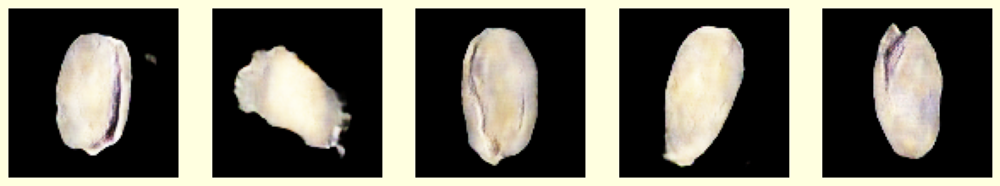

34/34 [==============================] - 15s 436ms/step - g_loss: -3.9977 - c_loss: -8.1417
Epoch 361/500
34/34 [==============================] - 15s 430ms/step - g_loss: -12.6512 - c_loss: -8.4002
Epoch 362/500
34/34 [==============================] - 15s 430ms/step - g_loss: -14.9790 - c_loss: -8.4092
Epoch 363/500
34/34 [==============================] - 15s 432ms/step - g_loss: -10.0737 - c_loss: -7.6529
Epoch 364/500
34/34 [==============================] - 15s 431ms/step - g_loss: -2.7742 - c_loss: -8.3550
Epoch 365/500
34/34 [==============================] - 15s 431ms/step - g_loss: -10.7925 - c_loss: -7.9815
Epoch 366/500
34/34 [==============================] - 15s 433ms/step - g_loss: -2.4670 - c_loss: -8.7743
Epoch 367/500
34/34 [==============================] - 15s 432ms/step - g_loss: -10.7788 - c_loss: -8.1761
Epoch 368/500
34/34 [==============================] - 15s 431ms/step - g_loss: -7.6393 - c_loss: -7.7529
Epoch 369/500
34/34 [==============================] - 

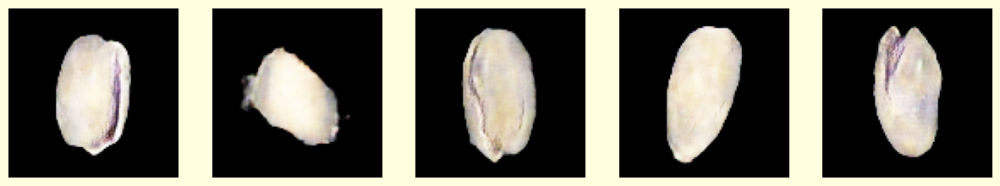

34/34 [==============================] - 15s 435ms/step - g_loss: -1.3121 - c_loss: -8.0028
Epoch 371/500
34/34 [==============================] - 15s 430ms/step - g_loss: -2.5282 - c_loss: -8.2147
Epoch 372/500
34/34 [==============================] - 15s 430ms/step - g_loss: -4.9100 - c_loss: -7.9934
Epoch 373/500
34/34 [==============================] - 15s 430ms/step - g_loss: -8.7627 - c_loss: -7.8703
Epoch 374/500
34/34 [==============================] - 15s 431ms/step - g_loss: -7.5122 - c_loss: -8.1570
Epoch 375/500
34/34 [==============================] - 15s 432ms/step - g_loss: -10.2744 - c_loss: -8.9020
Epoch 376/500
34/34 [==============================] - 14s 426ms/step - g_loss: -1.4950 - c_loss: -8.6025
Epoch 377/500
34/34 [==============================] - 15s 431ms/step - g_loss: -8.8794 - c_loss: -7.9692
Epoch 378/500
34/34 [==============================] - 15s 432ms/step - g_loss: -7.1513 - c_loss: -8.8029
Epoch 379/500
34/34 [==============================] - 15s 

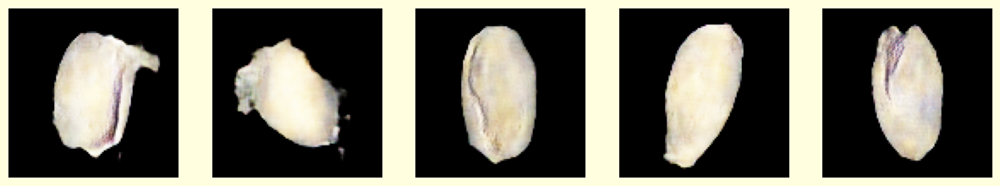

34/34 [==============================] - 15s 439ms/step - g_loss: -5.0055 - c_loss: -8.0712
Epoch 381/500
34/34 [==============================] - 15s 430ms/step - g_loss: -4.9310 - c_loss: -8.6208
Epoch 382/500
34/34 [==============================] - 15s 431ms/step - g_loss: -1.4420 - c_loss: -8.7784
Epoch 383/500
34/34 [==============================] - 15s 429ms/step - g_loss: -3.4626 - c_loss: -7.3797
Epoch 384/500
34/34 [==============================] - 15s 430ms/step - g_loss: -4.2661 - c_loss: -8.2272
Epoch 385/500
34/34 [==============================] - 15s 429ms/step - g_loss: -4.7773 - c_loss: -7.7945
Epoch 386/500
34/34 [==============================] - 15s 431ms/step - g_loss: -5.7251 - c_loss: -9.1461
Epoch 387/500
34/34 [==============================] - 15s 433ms/step - g_loss: -8.0604 - c_loss: -8.1566
Epoch 388/500
34/34 [==============================] - 15s 430ms/step - g_loss: -7.2372 - c_loss: -7.8503
Epoch 389/500
34/34 [==============================] - 15s 4

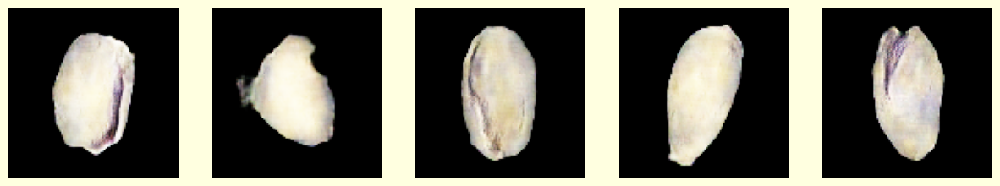

34/34 [==============================] - 15s 443ms/step - g_loss: -9.7699 - c_loss: -8.3290
Epoch 391/500
34/34 [==============================] - 15s 432ms/step - g_loss: -7.2437 - c_loss: -7.8647
Epoch 392/500
34/34 [==============================] - 15s 430ms/step - g_loss: -6.9080 - c_loss: -8.7951
Epoch 393/500
34/34 [==============================] - 15s 430ms/step - g_loss: -7.7247 - c_loss: -8.1894
Epoch 394/500
34/34 [==============================] - 15s 430ms/step - g_loss: -3.4081 - c_loss: -8.1828
Epoch 395/500
34/34 [==============================] - 15s 429ms/step - g_loss: -10.0874 - c_loss: -8.8733
Epoch 396/500
34/34 [==============================] - 15s 430ms/step - g_loss: -10.0736 - c_loss: -8.6511
Epoch 397/500
34/34 [==============================] - 15s 429ms/step - g_loss: -9.4046 - c_loss: -8.5273
Epoch 398/500
34/34 [==============================] - 15s 431ms/step - g_loss: -6.3741 - c_loss: -7.8428
Epoch 399/500
34/34 [==============================] - 15s

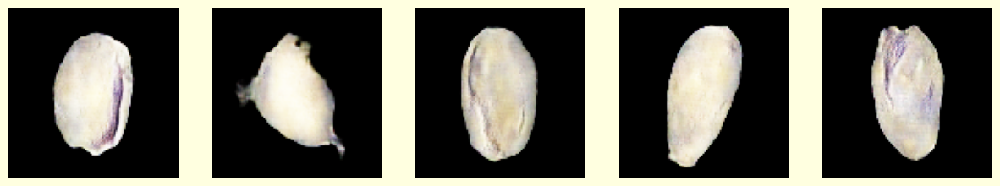


>>> Checkpoint disimpan di epoch 400:
    -> Generator: wgan_output_porto\generator_epoch_400.h5
    -> Critic: wgan_output_porto\critic_epoch_400.h5
34/34 [==============================] - 15s 438ms/step - g_loss: -2.7288 - c_loss: -8.4300
Epoch 401/500
34/34 [==============================] - 15s 430ms/step - g_loss: -7.0530 - c_loss: -8.4649
Epoch 402/500
34/34 [==============================] - 15s 431ms/step - g_loss: -4.7181 - c_loss: -8.7215
Epoch 403/500
34/34 [==============================] - 15s 431ms/step - g_loss: -3.0944 - c_loss: -7.3110
Epoch 404/500
34/34 [==============================] - 15s 431ms/step - g_loss: -2.5016 - c_loss: -8.1301
Epoch 405/500
34/34 [==============================] - 15s 430ms/step - g_loss: -7.7655 - c_loss: -8.1287
Epoch 406/500
34/34 [==============================] - 15s 432ms/step - g_loss: -11.9324 - c_loss: -8.4934
Epoch 407/500
34/34 [==============================] - 15s 431ms/step - g_loss: -5.1039 - c_loss: -7.8950
Epoch 408/500


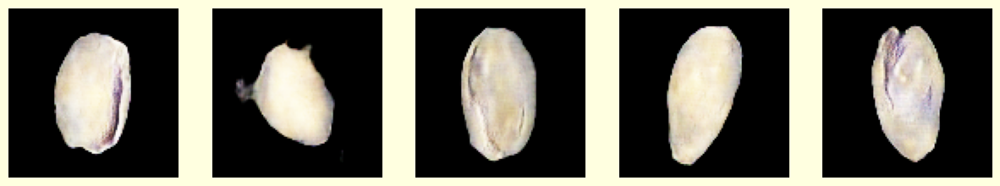

34/34 [==============================] - 15s 444ms/step - g_loss: -7.4511 - c_loss: -7.9986
Epoch 411/500
34/34 [==============================] - 15s 440ms/step - g_loss: -8.9522 - c_loss: -8.0849
Epoch 412/500
34/34 [==============================] - 15s 439ms/step - g_loss: -6.1380 - c_loss: -8.5037
Epoch 413/500
34/34 [==============================] - 15s 438ms/step - g_loss: -2.6299 - c_loss: -7.9364
Epoch 414/500
34/34 [==============================] - 15s 439ms/step - g_loss: -5.3641 - c_loss: -8.1711
Epoch 415/500
34/34 [==============================] - 15s 441ms/step - g_loss: -7.1334 - c_loss: -8.4570
Epoch 416/500
34/34 [==============================] - 15s 440ms/step - g_loss: -8.2458 - c_loss: -8.2584
Epoch 417/500
34/34 [==============================] - 15s 438ms/step - g_loss: -5.5299 - c_loss: -8.0642
Epoch 418/500
34/34 [==============================] - 15s 431ms/step - g_loss: -7.0570 - c_loss: -7.7898
Epoch 419/500
34/34 [==============================] - 15s 4

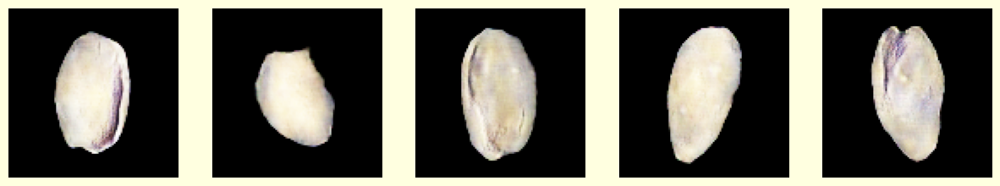

34/34 [==============================] - 15s 436ms/step - g_loss: -7.9526 - c_loss: -8.8571
Epoch 421/500
34/34 [==============================] - 15s 433ms/step - g_loss: -13.0471 - c_loss: -7.7384
Epoch 422/500
34/34 [==============================] - 15s 437ms/step - g_loss: -12.7690 - c_loss: -7.9305
Epoch 423/500
34/34 [==============================] - 15s 438ms/step - g_loss: -8.3145 - c_loss: -8.4854
Epoch 424/500
34/34 [==============================] - 15s 451ms/step - g_loss: -12.5986 - c_loss: -7.8464
Epoch 425/500
34/34 [==============================] - 15s 441ms/step - g_loss: -3.4365 - c_loss: -8.1432
Epoch 426/500
34/34 [==============================] - 15s 447ms/step - g_loss: -1.2605 - c_loss: -8.0185
Epoch 427/500
34/34 [==============================] - 15s 448ms/step - g_loss: -8.4579 - c_loss: -8.5909
Epoch 428/500
34/34 [==============================] - 15s 449ms/step - g_loss: -8.8902 - c_loss: -7.9767
Epoch 429/500
34/34 [==============================] - 15

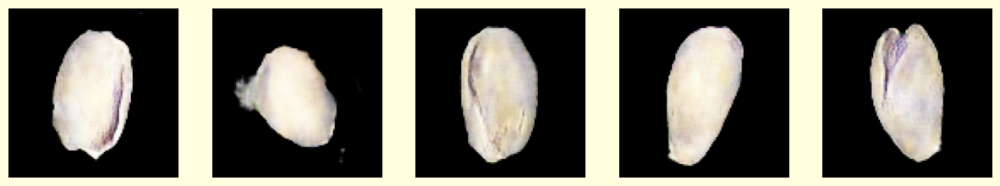

34/34 [==============================] - 16s 457ms/step - g_loss: -2.5365 - c_loss: -8.1778
Epoch 431/500
34/34 [==============================] - 15s 447ms/step - g_loss: 0.4752 - c_loss: -7.5287
Epoch 432/500
34/34 [==============================] - 15s 447ms/step - g_loss: -6.6806 - c_loss: -7.8732
Epoch 433/500
34/34 [==============================] - 16s 457ms/step - g_loss: -4.1469 - c_loss: -8.5265
Epoch 434/500
34/34 [==============================] - 15s 452ms/step - g_loss: -3.5887 - c_loss: -8.1409
Epoch 435/500
34/34 [==============================] - 16s 454ms/step - g_loss: -5.7101 - c_loss: -8.1784
Epoch 436/500
34/34 [==============================] - 15s 453ms/step - g_loss: -4.2182 - c_loss: -8.0952
Epoch 437/500
34/34 [==============================] - 16s 455ms/step - g_loss: -5.2410 - c_loss: -8.8993
Epoch 438/500
34/34 [==============================] - 16s 455ms/step - g_loss: -5.0088 - c_loss: -8.4591
Epoch 439/500
34/34 [==============================] - 16s 45

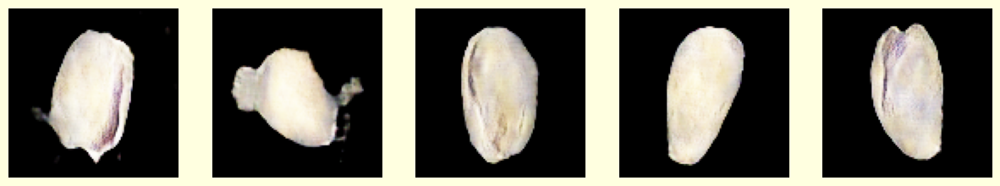

34/34 [==============================] - 16s 466ms/step - g_loss: -9.9936 - c_loss: -9.1201
Epoch 441/500
34/34 [==============================] - 16s 455ms/step - g_loss: -5.4483 - c_loss: -8.2133
Epoch 442/500
34/34 [==============================] - 16s 455ms/step - g_loss: -4.2940 - c_loss: -7.9375
Epoch 443/500
34/34 [==============================] - 15s 453ms/step - g_loss: -8.2828 - c_loss: -8.1263
Epoch 444/500
34/34 [==============================] - 15s 453ms/step - g_loss: -6.6884 - c_loss: -8.8369
Epoch 445/500
34/34 [==============================] - 15s 454ms/step - g_loss: -9.8648 - c_loss: -8.3334
Epoch 446/500
34/34 [==============================] - 15s 453ms/step - g_loss: -4.9603 - c_loss: -8.2860
Epoch 447/500
34/34 [==============================] - 15s 453ms/step - g_loss: -5.1195 - c_loss: -8.2560
Epoch 448/500
34/34 [==============================] - 16s 455ms/step - g_loss: -7.9312 - c_loss: -8.2973
Epoch 449/500
34/34 [==============================] - 15s 4

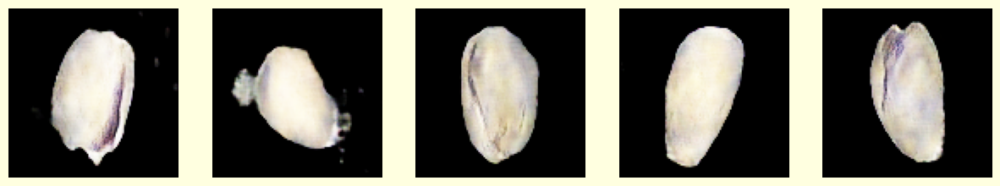


>>> Checkpoint disimpan di epoch 450:
    -> Generator: wgan_output_porto\generator_epoch_450.h5
    -> Critic: wgan_output_porto\critic_epoch_450.h5
34/34 [==============================] - 16s 472ms/step - g_loss: -2.4045 - c_loss: -8.1346
Epoch 451/500
34/34 [==============================] - 15s 453ms/step - g_loss: -3.0705 - c_loss: -8.4445
Epoch 452/500
34/34 [==============================] - 16s 456ms/step - g_loss: -4.5214 - c_loss: -7.8786
Epoch 453/500
34/34 [==============================] - 16s 455ms/step - g_loss: 1.4155 - c_loss: -8.3417
Epoch 454/500
34/34 [==============================] - 16s 458ms/step - g_loss: -5.9402 - c_loss: -8.0443
Epoch 455/500
34/34 [==============================] - 15s 437ms/step - g_loss: -1.5216 - c_loss: -8.4852
Epoch 456/500
34/34 [==============================] - 15s 439ms/step - g_loss: -2.9607 - c_loss: -8.1677
Epoch 457/500
34/34 [==============================] - 15s 438ms/step - g_loss: -2.4983 - c_loss: -8.5006
Epoch 458/500
34

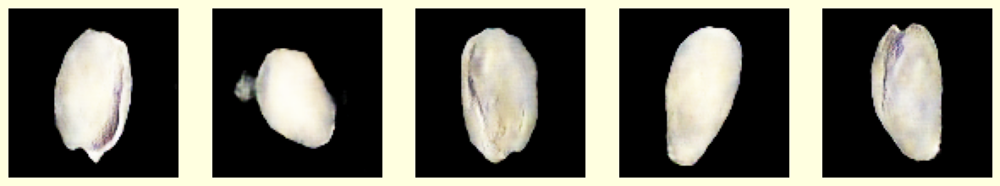

34/34 [==============================] - 15s 443ms/step - g_loss: -8.3123 - c_loss: -8.3386
Epoch 461/500
34/34 [==============================] - 15s 439ms/step - g_loss: -0.0985 - c_loss: -8.0874
Epoch 462/500
34/34 [==============================] - 15s 438ms/step - g_loss: -4.0634 - c_loss: -9.5477
Epoch 463/500
34/34 [==============================] - 15s 438ms/step - g_loss: 5.0734 - c_loss: -8.6269
Epoch 464/500
34/34 [==============================] - 15s 437ms/step - g_loss: 2.3295 - c_loss: -8.2880
Epoch 465/500
34/34 [==============================] - 15s 438ms/step - g_loss: -3.9371 - c_loss: -8.2243
Epoch 466/500
34/34 [==============================] - 15s 437ms/step - g_loss: -3.1391 - c_loss: -7.9754
Epoch 467/500
34/34 [==============================] - 15s 439ms/step - g_loss: -3.1830 - c_loss: -8.0224
Epoch 468/500
34/34 [==============================] - 15s 443ms/step - g_loss: -2.0163 - c_loss: -8.3412
Epoch 469/500
34/34 [==============================] - 15s 444

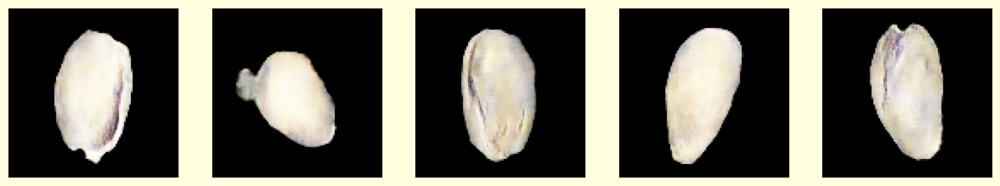

34/34 [==============================] - 15s 448ms/step - g_loss: 6.5410 - c_loss: -8.4706
Epoch 471/500
34/34 [==============================] - 15s 450ms/step - g_loss: 1.7657 - c_loss: -8.6055
Epoch 472/500
34/34 [==============================] - 15s 450ms/step - g_loss: -2.8641 - c_loss: -7.7722
Epoch 473/500
34/34 [==============================] - 15s 448ms/step - g_loss: -0.4757 - c_loss: -8.4362
Epoch 474/500
34/34 [==============================] - 15s 448ms/step - g_loss: 0.8518 - c_loss: -8.4144
Epoch 475/500
34/34 [==============================] - 15s 448ms/step - g_loss: -5.1634 - c_loss: -8.7286
Epoch 476/500
34/34 [==============================] - 15s 452ms/step - g_loss: -5.5946 - c_loss: -8.4545
Epoch 477/500
34/34 [==============================] - 15s 442ms/step - g_loss: -5.7227 - c_loss: -8.3391
Epoch 478/500
34/34 [==============================] - 15s 446ms/step - g_loss: -3.1797 - c_loss: -8.4888
Epoch 479/500
34/34 [==============================] - 15s 444m

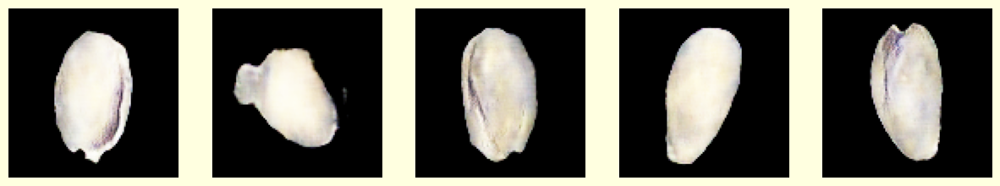

34/34 [==============================] - 15s 453ms/step - g_loss: 0.7827 - c_loss: -8.7072
Epoch 481/500
34/34 [==============================] - 15s 442ms/step - g_loss: 5.5551 - c_loss: -8.8758
Epoch 482/500
34/34 [==============================] - 15s 443ms/step - g_loss: 0.6869 - c_loss: -8.2373
Epoch 483/500
34/34 [==============================] - 15s 443ms/step - g_loss: -0.7440 - c_loss: -8.2806
Epoch 484/500
34/34 [==============================] - 15s 443ms/step - g_loss: -2.9184 - c_loss: -8.0959
Epoch 485/500
34/34 [==============================] - 15s 442ms/step - g_loss: -3.5267 - c_loss: -8.1267
Epoch 486/500
34/34 [==============================] - 15s 439ms/step - g_loss: -1.7715 - c_loss: -8.5038
Epoch 487/500
34/34 [==============================] - 15s 451ms/step - g_loss: -1.0770 - c_loss: -8.3205
Epoch 488/500
34/34 [==============================] - 15s 446ms/step - g_loss: 1.2579 - c_loss: -8.9563
Epoch 489/500
34/34 [==============================] - 15s 437ms

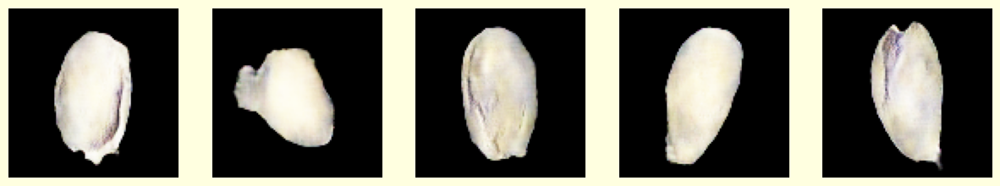

34/34 [==============================] - 15s 447ms/step - g_loss: -3.7591 - c_loss: -8.5243
Epoch 491/500
34/34 [==============================] - 15s 437ms/step - g_loss: -0.2995 - c_loss: -7.8123
Epoch 492/500
34/34 [==============================] - 15s 438ms/step - g_loss: -4.1427 - c_loss: -8.5700
Epoch 493/500
34/34 [==============================] - 15s 437ms/step - g_loss: -0.8708 - c_loss: -8.3753
Epoch 494/500
34/34 [==============================] - 15s 454ms/step - g_loss: 2.3847 - c_loss: -8.0033
Epoch 495/500
34/34 [==============================] - 15s 438ms/step - g_loss: 0.5808 - c_loss: -8.5953
Epoch 496/500
34/34 [==============================] - 15s 439ms/step - g_loss: 3.2915 - c_loss: -8.8139
Epoch 497/500
34/34 [==============================] - 15s 441ms/step - g_loss: -2.1696 - c_loss: -7.9914
Epoch 498/500
34/34 [==============================] - 15s 440ms/step - g_loss: 0.1008 - c_loss: -8.4802
Epoch 499/500
34/34 [==============================] - 15s 438ms

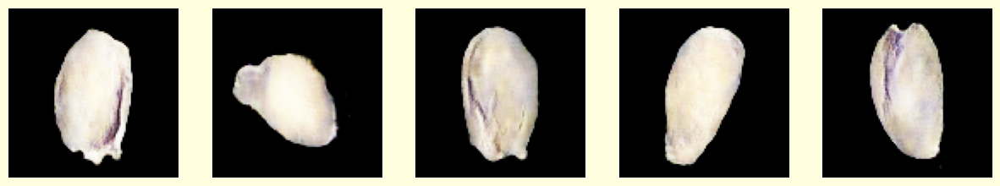


>>> Checkpoint disimpan di epoch 500:
    -> Generator: wgan_output_porto\generator_epoch_500.h5
    -> Critic: wgan_output_porto\critic_epoch_500.h5
34/34 [==============================] - 15s 453ms/step - g_loss: -2.0791 - c_loss: -8.1778


In [27]:
monitor_wgan = WGANMonitor(num_img=5, latent_dim=LATENT_DIM, image_freq=10, save_freq=50)

history_wgan = wgan.fit(data, epochs=500, callbacks=[monitor_wgan])

### Loss Plot

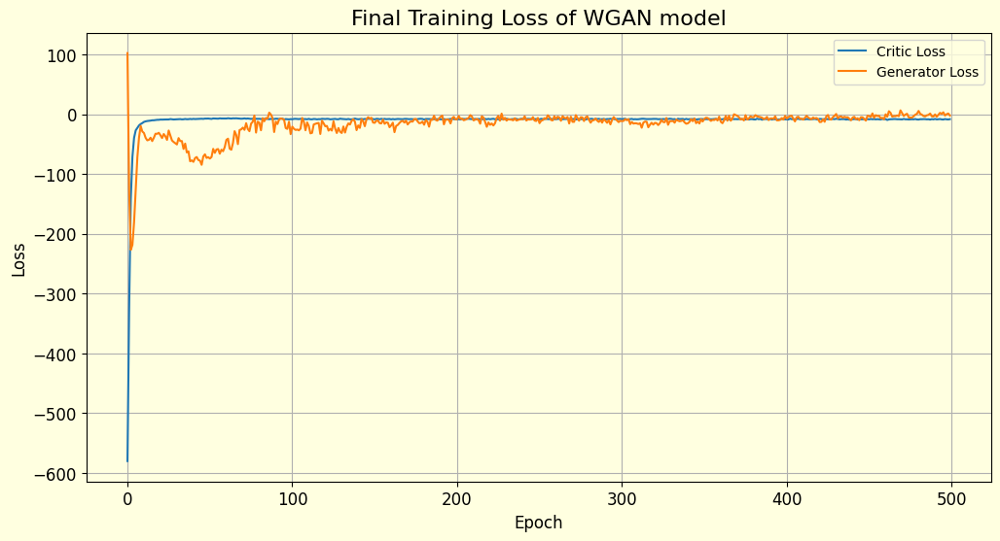

In [28]:
c_loss = history_wgan.history['c_loss']
gwgan_loss = history_wgan.history['g_loss']
epochs_range = range(len(c_loss))

plt.figure(figsize=(12, 6))
plt.plot(epochs_range, c_loss, label='Critic Loss')
plt.plot(epochs_range, gwgan_loss, label='Generator Loss')
plt.title('Final Training Loss of WGAN model', fontsize=16)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

This loss plot is more interesting than the DCGAN because it really shows a good battle between the Generator and Critic. 
- At first the generator is being beaten by critic because it has not learning and just produce random noise, so the critic giving so many negative score.
- But when the epoch goes on, We can see from epoch 25-100ish they are starting to stabilize. This means that the generator are starting to generating image thats good enough to challengen the critic. 
- At 100-500 The generator loss oscillates around a stable baseline, and crucially, it frequently dips into negative territory. negative g_loss means the fake_score from the critic was positive and that means critic thinks that the image is real. 

This really shows that both of the instances have a stable training process and considered quite successful. It demonstrates that with Gradient-Penalty and Critic, it able to gives the stability of training that DCGAN dont have

### Data Generation Example

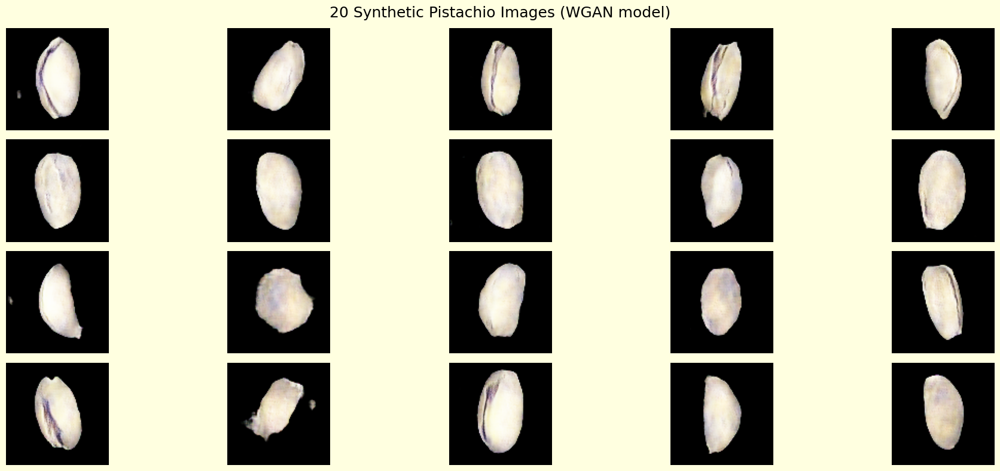

In [29]:
generator_weights_path = "wgan_output_porto/generator_epoch_500.h5"
critic_weights_path = "wgan_output_porto/critic_epoch_500.h5"

generator = build_generator_wgan()
critic = build_critic()

generator.load_weights(generator_weights_path)
critic.load_weights(critic_weights_path)
num_images = 20
random_latent_vectors = tf.random.normal(shape=(num_images, LATENT_DIM))
generated_images = generator(random_latent_vectors, training=False)
generated_images = (generated_images + 1) / 2.0  # Rescale from [-1,1] to [0,1]

plt.figure(figsize=(20, 8))
for i in range(num_images):
    plt.subplot(4, 5, i + 1)
    img = tf.keras.preprocessing.image.array_to_img(generated_images[i])
    plt.imshow(img)
    plt.axis('off')
plt.suptitle("20 Synthetic Pistachio Images (WGAN model)", fontsize=18)
plt.tight_layout()
plt.show()

We can see here that the model is starting to be able to learn more about the images, compared to DCGAN. Even tho the image got more purplish color (the color of the seeds when the nut opens), the image is still not stable, as example of the 6th picture. The image looks more like a candlenut(kemiri) instead of pistachios. This means that the model can be improved more and more to generate a better images in the future.

# C. FID Evaluation

## FID Function using InceptionV3

For the final evaluation to compare my two GAN models, I will use the Fréchet Inception Distance (FID). The reason InceptionV3 is the standard model for this job goes back to the older Inception Score (IS). IS was an early metric, but its main weakness was that it only judged the generated images on their own, without comparing them to the real dataset. FID was created as the evolution of this idea, fixing the biggest flaw by directly comparing the generated images to the real ones. So, using the InceptionV3 model became the standard practice.

In [4]:
data_path = "Dataset"

IMG_HEIGHT = 100
IMG_WIDTH = 100
CHANNELS = 3
BATCH_SIZE = 16

def preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=CHANNELS, expand_animations=False)
    img = tf.image.resize(img, [IMG_HEIGHT, IMG_WIDTH])
    img = (tf.cast(img, tf.float32) / 127.5) - 1.0 ## Because the generator is asked for the output to be tanh so we need it to be [-1 1]

    img.set_shape([IMG_HEIGHT, IMG_WIDTH, CHANNELS])
    
    return img

data_path_list = glob.glob(os.path.join(data_path, "*.jpg"))
data= tf.data.Dataset.from_tensor_slices(data_path_list)
data = data.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
data = data.batch(BATCH_SIZE, drop_remainder=True)
data = data.prefetch(tf.data.AUTOTUNE)

In [5]:
def calculate_fid(inception_model, images1, images2, batch_size):
    #  InceptionV3 activations (features) for both sets
    act1 = inception_model.predict(images1, batch_size=batch_size,verbose=0)
    act2 = inception_model.predict(images2, batch_size=batch_size,verbose=0)
    
    # mean and covariance
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    
    #  sum squared difference between means
    ssdiff = np.sum((mu1 - mu2)**2.0)
    
    # the square root of the product of covariances
    covmean = sqrtm(sigma1.dot(sigma2))
    
    # Clean up complex numbers if they arise
    if np.iscomplexobj(covmean):
        covmean = covmean.real
        
    # Calculate the final FID score
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

Some of these values are being declared, just to make sure that it's there.

In [6]:
LATENT_DIM = 128
IMG_HEIGHT = 100
IMG_WIDTH = 100
CHANNELS = 3

## Re-Building the generator

In here i would build the generator again, so we can call them as the blueprint for our saved model. Therefore we can use them to generate images and calculate the FID score.

In [7]:
def build_dcgan_generator_for_fid():
    noise_input = Input(shape=(LATENT_DIM,))
    x = Dense(28 * 28 * 64, use_bias=False)(noise_input)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Reshape((28, 28, 64))(x)
    x = UpSampling2D()(x)
    x = Conv2D(16, 3, strides=1, padding='valid', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = UpSampling2D()(x)
    x = Conv2D(32, 3, strides=1, padding='valid', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Conv2D(64, 3, strides=1, padding='valid', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Conv2D(CHANNELS, 3, strides=1, padding='valid', activation='tanh')(x)
    output_image = Cropping2D(cropping=((1, 1), (1, 1)))(x)
    return Model(noise_input, output_image, name="dcgan_generator")


def build_wgan_generator_for_fid():
    noise_input = Input(shape=(LATENT_DIM,))
    x = Dense(25 * 25 * 128, use_bias=False)(noise_input)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Reshape((25, 25, 128))(x)

    # 25 -> 50
    x = UpSampling2D()(x)
    x = _gen_block(x, 64)

    # 50-> 100
    x = UpSampling2D()(x)
    x = _gen_block(x, 32)

    out = Conv2D(CHANNELS, 3, padding='same', activation='tanh')(x)  # [-1, 1]
    return Model(noise_input, out, name="generator")

In [9]:
NUM_IMAGES_TO_EVAL = 1000 
INCEPTION_SIZE = (299, 299)
REAL_IMAGES_PATH = "Dataset/*.jpg"
DCGAN_WEIGHTS_PATH = "gan_training_run_modified/generator_weights_epoch_0500.h5"
WGAN_WEIGHTS_PATH = "wgan_output_porto/generator_epoch_500.h5"

FID_BATCH_SIZE  = 1 # biar ga oom terus pas inference hiks

In [23]:
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(*INCEPTION_SIZE, 3))
print("loaded")

loaded


Real images are gonna be loaded here for the comparison so we can generate the FID scores!

In [24]:
real_image_paths = glob.glob(REAL_IMAGES_PATH)
if len(real_image_paths) < NUM_IMAGES_TO_EVAL:
    raise ValueError(f"Not enough real images found. Found {len(real_image_paths)}, need {NUM_IMAGES_TO_EVAL}.")

np.random.shuffle(real_image_paths)
selected_paths = real_image_paths[:NUM_IMAGES_TO_EVAL]
real_images = [tf.keras.preprocessing.image.img_to_array(tf.keras.preprocessing.image.load_img(p, target_size=INCEPTION_SIZE)) for p in selected_paths]
real_images = np.array(real_images)
real_images_preprocessed = preprocess_input(real_images)
print("done, processed, loaded")

done, processed, loaded


In this function we will build the generators and put the weights inside them blueprints. Then we will generate 1000 fake images then compare the real and fake images using inception model. Then it will return our FID score.

## Calculating

In [25]:
def evaluate_generator(generator_weights_path, build_fn, bsize):
    print(f"\n--- Evaluating model: {os.path.basename(generator_weights_path)} ---")
    
    #  Build and load the generator using the provided build function
    generator = build_fn()
    generator.load_weights(generator_weights_path)
    print("model loaded success")
    
    # Generate fake images
    print(f"Generating {NUM_IMAGES_TO_EVAL} fake images")
    latent_samples = tf.random.normal(shape=(NUM_IMAGES_TO_EVAL, LATENT_DIM))
    fake_images_raw = generator.predict(latent_samples, batch_size = bsize, verbose=0)
    
    # Post-process fake images for InceptionV3
    fake_images_denorm = (fake_images_raw * 127.5) + 127.5
    fake_images_resized = tf.image.resize(fake_images_denorm, INCEPTION_SIZE, method='bilinear')
    fake_images_preprocessed = preprocess_input(fake_images_resized)
    print("images generated & processed")
    
    # Calculate FID score
    print("calculating fid")
    fid_score = calculate_fid(inception_model, real_images_preprocessed, fake_images_preprocessed, bsize)
    
    return fid_score

In [16]:
print("\nEvaluating DCGAN model...")
fid_dcgan = evaluate_generator(DCGAN_WEIGHTS_PATH, build_dcgan_generator_for_fid, FID_BATCH_SIZE)


Evaluating DCGAN model...

--- Evaluating model: generator_weights_epoch_0500.h5 ---
model loaded success
Generating 1000 fake images
images generated & processed
calculating fid


In [28]:
print("\nEvaluating WGAN-GP model...")
fid_wgan_gp = evaluate_generator(WGAN_WEIGHTS_PATH, build_wgan_generator_for_fid, FID_BATCH_SIZE)


Evaluating WGAN-GP model...

--- Evaluating model: generator_epoch_500.h5 ---
model loaded success
Generating 1000 fake images
images generated & processed
calculating fid


In [17]:
print(f"FID Score for Baseline DCGAN: {fid_dcgan:.3f}")


FID Score for Baseline DCGAN: 145.835


In [29]:
print(f"FID Score for Modified WGAN-GP: {fid_wgan_gp:.3f}")

FID Score for Modified WGAN-GP: 145.604


# Conclusion

From the FID Score we can see that there's only a little bit changes in the model performance, even after all of the changes we made for WGAN GP

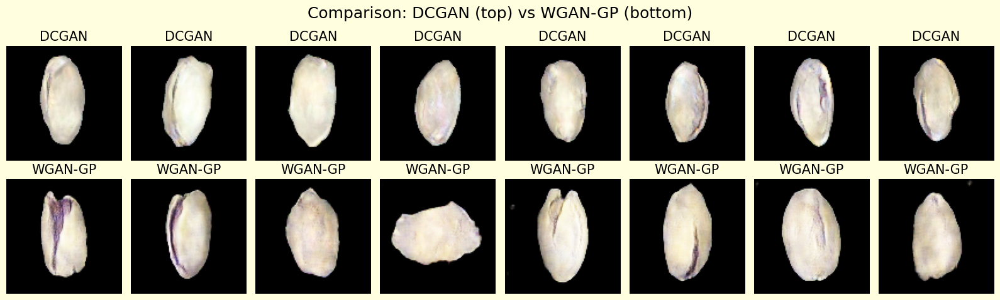

In [13]:
dcgan_generator = build_dcgan_generator_for_fid()
dcgan_generator.load_weights(DCGAN_WEIGHTS_PATH)
wgan_generator = build_wgan_generator_for_fid()
wgan_generator.load_weights(WGAN_WEIGHTS_PATH)

num_compare = 8
latent_vectors = tf.random.normal(shape=(num_compare, LATENT_DIM))

dcgan_images = dcgan_generator(latent_vectors, training=False)
wgan_images = wgan_generator(latent_vectors, training=False)
dcgan_images = (dcgan_images + 1) / 2.0
wgan_images = (wgan_images + 1) / 2.0

plt.figure(figsize=(16, 5))
for i in range(num_compare):
    plt.subplot(2, num_compare, i + 1)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(dcgan_images[i]))
    plt.title("DCGAN")
    plt.axis('off')
    plt.subplot(2, num_compare, num_compare + i + 1)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(wgan_images[i]))
    plt.title("WGAN-GP")
    plt.axis('off')
plt.suptitle("Comparison: DCGAN (top) vs WGAN-GP (bottom)", fontsize=18)
plt.tight_layout()
plt.show()

In [ ]:
# for images sample
num_save = 5
latent_vectors_dcgan = tf.random.normal(shape=(num_save, LATENT_DIM))
dcgan_imgs = dcgan_generator(latent_vectors_dcgan, training=False)
dcgan_imgs = (dcgan_imgs + 1) / 2.0  

for idx in range(num_save):
    img = tf.keras.preprocessing.image.array_to_img(dcgan_imgs[idx])
    img.save(f"dcgan_sample_{idx+1}.png")

# wgan
latent_vectors_wgan = tf.random.normal(shape=(num_save, LATENT_DIM))
wgan_imgs = wgan_generator(latent_vectors_wgan, training=False)
wgan_imgs = (wgan_imgs + 1) / 2.0  

for idx in range(num_save):
    img = tf.keras.preprocessing.image.array_to_img(wgan_imgs[idx])
    img.save(f"wgan_sample_{idx+1}.png")

To provide a definitive and accurate quantitative measurement for both of the model, Frechet Inception Distance is used and we got the score of 
- 145.8 for the DCGAN, and
- 145.6 for WGAN

This might seems just a little bit different from both of the model, However from both of the model we can't just look at the FID number, but we have to see the process too.

`DCGAN-The Baseline` : The FID score of 145.8 for the DCGAN represents a "lucky punch" from a chaotic and unstable training process. As evidenced by the erratic loss curves, the DCGAN model was constantly on the verge of either mode collapse or training divergence. This score is achieved by picking a single checkpoint where the model was at the best performance, before the generator keep losing as we can see at the plot of loss. The training is also unstable. Influencing the decision to try a different model, which is WGAN-GP.

`WGAN-GP > The modified` : With the FID of 145.6, This result was achieved from a model whose training was healthy, stable, and predictable from start to finish, as proven by its loss curve that is stable and we can see a visible "fight" between the generator and discriminator. The generator is able to generate a more variation of nut shapes more than the DC-GAN meaning that the model has successfully learned more from the previous model

The success of this project is threefold:

- Qualitative Success: A visual analysis of the generated images proves that the WGAN-GP successfully solved the model collapse problem. It produced a more diveresed outputs, exploring various shapes, orientations, and features present in the dataset like opened nut, something that DCGAN cannot achieve

- Training Process Success: A comparison of the loss curves demonstrates a dramatic improvement. The unstable behavior of the DCGAN was replaced by the stable, interpretable, and healthy training dynamic of the WGAN-GP. This proves the modification created a reliable and predictable process

- Quantitative Success: The final FID scores confirm the efficacy of the new model. The WGAN-GP achieved a score of 145.6, proving it could match the quality of the DCGAN's best possible "lucky shot" (145.8) but through a stable and trustworthy method instead of just luck from DC-GAN with unstable model training process.